In [1]:
!pip install sktime

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.5/17.5 MB 71.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 118.7/118.7 kB 14.7 MB/s eta 0:00:00


In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
import pandas as pd
import numpy as np
import torch
from tqdm.auto import tqdm
import random
import os

def reset_seeds(seed):
    random.seed(seed)
    os.environ['PYTHONHASHSEED'] = str(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.backends.cudnn.deterministic = True

DATA_PATH = '/content/drive/MyDrive/데이콘 캐글 컴페티션/DACON_23.07_PowerConsumption/'
SEED = 42

device = 'cuda' if torch.cuda.is_available() else 'cpu'
device

'cuda'

In [4]:
from lightgbm import LGBMRegressor
from xgboost import XGBRegressor
import sktime
from sktime.forecasting.model_selection import temporal_train_test_split
from sktime.utils.plotting import plot_series
import matplotlib.pyplot as pl24
from sklearn.metrics import make_scorer
from lightgbm import early_stopping
import xgboost as xgb
import seaborn as sns

In [5]:
def _smape(true, pred):
    true = np.array(true)
    pred = np.array(pred)
    output = np.mean((np.abs(true-pred))/(np.abs(true) + np.abs(pred))) * 100 * 2
    return output
smape = make_scorer(_smape, greater_is_better=False)

In [6]:
train = pd.read_csv(f"{DATA_PATH}train.csv")
test = pd.read_csv(f"{DATA_PATH}test.csv")
# building = pd.read_csv(f"{DATA_PATH}building_info.csv")
submission = pd.read_csv(f"{DATA_PATH}sample_submission.csv")

In [7]:

train_ft = pd.read_csv(f'{DATA_PATH}train_ver3.csv') #ver 4 미완성본

test_ft = pd.read_csv(f'{DATA_PATH}test_ver3.csv')



# train_ft = pd.read_csv(f"{DATA_PATH}train_feature9.csv")
# test_ft = pd.read_csv(f"{DATA_PATH}test_feature9.csv")


# train_ft = pd.read_csv(f"{DATA_PATH}train_selected_3.csv")
# test_ft = pd.read_csv(f"{DATA_PATH}test_selected_3.csv")

# df = pd.read_csv(f"{DATA_PATH}train_featured_3.csv")


In [8]:
# cols = ['day_hour_mean', 'day_hour_median', 'discomfort_CDH', 'week',
#        'day_hour_mode', 'discomfort', 'day_hour_std', 'CDH', 'hour_mean',
#        'sin_time', 'cos_week','building_num','energy_consum']

# train_ft = df[cols]

- 피처추가

In [9]:
train_ft.shape, test_ft.shape

((201600, 31), (16800, 28))

In [10]:
train_ft.columns

cols = ['energy_consum', 'building_num', 'date_time', 'temp', 'precip', 'wind', 'hum',
       'sunshine', 'solar_rad', 'building_type', 'time', 'day', 'month', 'week',
       'day_of_year', 'sin_time', 'cos_time', 'temp_RM', 'wind_RM', 'hum_RM',
       'temp_EMA', 'wind_EMA', 'hum_EMA', 'THI', 'feels_temp', 'CDH',
       'hour_mean', 'day_hour_mean', 'hour_std', 'heat_index', 'heat_wave']


train_ft.columns = cols

In [11]:
test_ft.columns

cols = ['building_num', 'date_time', 'temp', 'precip', 'wind', 'hum', 'building_type',
       'time', 'day', 'month', 'week', 'day_of_year', 'sin_time', 'cos_time',
       'temp_RM', 'wind_RM', 'hum_RM', 'temp_EMA', 'wind_EMA', 'hum_EMA',
       'THI', 'feels_temp', 'CDH', 'hour_mean', 'day_hour_mean', 'hour_std',
       'heat_index', 'heat_wave']

test_ft.columns = cols

In [12]:
train_ft.isna().sum().sum(), test_ft.isna().sum().sum()

(0, 0)

In [13]:
train_ft.shape, test_ft.shape

((201600, 31), (16800, 28))

In [14]:
cols = ['sunshine', 'solar_rad']
train_ft = train_ft.drop(columns=cols)

요일별 6시간 전 대비 전력 변화율

In [15]:
train_ft.day

0         3
1         3
2         3
3         3
4         3
         ..
201595    2
201596    2
201597    2
201598    2
201599    2
Name: day, Length: 201600, dtype: int64

In [16]:
train_ft['power_change_rate'] = (train_ft['energy_consum'] - train_ft.groupby(['building_num', train_ft.day])['energy_consum'].shift(6)) / train_ft.groupby(['building_num', train_ft.day])['energy_consum'].shift(6)


In [17]:
# train_ft['day_within_cycle'] = train_ft.index % (7*24)

# periodic_avg_power_change_rate = train_ft.groupby(['building_num', 'day_within_cycle'])['power_change_rate'].mean().reset_index()
# periodic_avg_power_change_rate.rename(columns={'power_change_rate': 'periodic_avg_power_change_rate'}, inplace=True)

# train_ft = train_ft.merge(periodic_avg_power_change_rate, on=['building_num', 'day_within_cycle'], how='left')

In [18]:
# cols = ['day_within_cycle', 'power_change_rate']
# train_ft = train_ft.drop(columns=cols)

# train_ft['periodic_avg_power_change_rate'].nunique()

# last_rows = train_ft.groupby('building_num').tail(28)['periodic_avg_power_change_rate'].reset_index().drop('index', axis=1)
# test_ft = pd.concat([test_ft, last_rows], axis=1)

In [19]:
# train_ft['power_change_rate'] = (train_ft['energy_consum'] - train_ft.groupby(['building_num', train_ft.day])['energy_consum'].shift(6)) / train_ft.groupby(['building_num', train_ft.day])['energy_consum'].shift(6)

# train_ft['day_within_cycle'] = train_ft.index % (7*24)

# periodic_avg_power_change_rate = train_ft.groupby(['building_num', 'day_within_cycle'])['power_change_rate'].mean().reset_index()
# periodic_avg_power_change_rate.rename(columns={'power_change_rate': 'periodic_avg_power_change_rate'}, inplace=True)

# train_ft = train_ft.merge(periodic_avg_power_change_rate, on=['building_num', 'day_within_cycle'], how='left')

# cols = ['day_within_cycle', 'power_change_rate']
# train_ft = train_ft.drop(columns=cols)

# train_ft['periodic_avg_power_change_rate'].nunique()

# last_rows = train_ft.groupby('building_num').tail(28)['periodic_avg_power_change_rate'].reset_index().drop('index', axis=1)
# test_ft = pd.concat([test_ft, last_rows], axis=1)


In [20]:
train_ft.columns

Index(['energy_consum', 'building_num', 'date_time', 'temp', 'precip', 'wind',
       'hum', 'building_type', 'time', 'day', 'month', 'week', 'day_of_year',
       'sin_time', 'cos_time', 'temp_RM', 'wind_RM', 'hum_RM', 'temp_EMA',
       'wind_EMA', 'hum_EMA', 'THI', 'feels_temp', 'CDH', 'hour_mean',
       'day_hour_mean', 'hour_std', 'heat_index', 'heat_wave',
       'power_change_rate'],
      dtype='object')


7일 주기, 7일전 대비 전력 변화율

In [21]:
train_ft['day_hour_mean'].nunique() # 168개 고유값. 건물별로.

16425

In [22]:
train_ft['power_change_rate'] = (train_ft['energy_consum'] - train_ft.groupby('building_num')['energy_consum'].shift(7*24)) / train_ft.groupby('building_num')['energy_consum'].shift(7*24)

train_ft['day_within_cycle'] = train_ft.index % (7*24)

periodic_avg_power_change_rate = train_ft.groupby(['building_num','day_within_cycle' ])['power_change_rate'].mean().reset_index()
periodic_avg_power_change_rate.rename(columns={'power_change_rate': 'periodic_avg_power_change_rate'}, inplace=True)

train_ft = train_ft.merge(periodic_avg_power_change_rate, on=['building_num','day_within_cycle'], how='left')
cols = ['day_within_cycle','power_change_rate']
train_ft = train_ft.drop(columns = cols)

train_ft['periodic_avg_power_change_rate'].nunique()

last_rows = train_ft.groupby('building_num').tail(168)['periodic_avg_power_change_rate'].reset_index().drop('index',axis=1)
test_ft = pd.concat([test_ft, last_rows], axis=1)

In [23]:
train_ft['power_change_rate_6'] = (train_ft['energy_consum'] - train_ft.groupby('building_num')['energy_consum'].shift(24)) / train_ft.groupby('building_num')['energy_consum'].shift(24)

train_ft['day_within_cycle_6'] = train_ft.index % (24)

periodic_avg_power_change_rate = train_ft.groupby(['building_num','day_within_cycle_6' ])['power_change_rate_6'].mean().reset_index()
periodic_avg_power_change_rate.rename(columns={'power_change_rate_6': 'periodic_avg_power_change_rate_6'}, inplace=True)

train_ft = train_ft.merge(periodic_avg_power_change_rate, on=['building_num','day_within_cycle_6'], how='left')
cols = ['day_within_cycle_6','power_change_rate_6']
train_ft = train_ft.drop(columns = cols)

train_ft['periodic_avg_power_change_rate_6'].nunique()

last_rows = train_ft.groupby('building_num').tail(168)['periodic_avg_power_change_rate_6'].reset_index().drop('index',axis=1)
test_ft = pd.concat([test_ft, last_rows], axis=1)

In [24]:
pd.DataFrame(train_ft['periodic_avg_power_change_rate_6'])

,periodic_avg_power_change_rate_6
0,0.021710
1,0.023154
2,0.025346
3,0.030905
4,0.033128
...,...
201595,0.004240
201596,0.004927
201597,0.006987
201598,0.008615


In [25]:
# train_ft['power_change_rate'] = (train_ft['energy_consum'] - train_ft.groupby('building_num')['energy_consum'].shift(6)) / train_ft.groupby('building_num')['energy_consum'].shift(6)

# train_ft['day_within_cycle'] = train_ft.index % (6)

# periodic_avg_power_change_rate = train_ft.groupby(['building_num','day_within_cycle' ])['power_change_rate'].mean().reset_index()
# periodic_avg_power_change_rate.rename(columns={'power_change_rate': 'periodic_avg_power_change_rate_6h'}, inplace=True)

# train_ft = train_ft.merge(periodic_avg_power_change_rate, on=['building_num','day_within_cycle'], how='left')
# cols = ['day_within_cycle','periodic_avg_power_change_rate_6h']
# train_ft = train_ft.drop(columns = cols)

# # train_ft['periodic_avg_power_change_rate_6h'].nunique()

# last_rows = train_ft.groupby('building_num').tail(168)['periodic_avg_power_change_rate_6h'].reset_index().drop('index',axis=1)
# test_ft = pd.concat([test_ft, last_rows], axis=1)

In [26]:
train_ft

,energy_consum,building_num,date_time,temp,precip,wind,hum,building_type,time,day,...,THI,feels_temp,CDH,hour_mean,day_hour_mean,hour_std,heat_index,heat_wave,periodic_avg_power_change_rate,periodic_avg_power_change_rate_6
0,1034.40,1,20220602 00,18.1,0.0,0.4,67.0,건물기타,0,3,...,69.672872,28.818026,-1.850000,1713.711429,1627.80,444.306331,0.0,0,0.069171,0.021710
1,973.92,1,20220602 01,17.6,0.0,0.8,69.0,건물기타,1,3,...,68.942223,27.987268,-4.591667,1629.468571,1550.08,437.718795,0.0,0,0.072765,0.023154
2,909.12,1,20220602 02,17.2,0.0,0.7,71.0,건물기타,2,3,...,68.121589,27.080175,-8.266667,1513.305714,1431.12,410.362488,0.0,0,0.071155,0.025346
3,893.28,1,20220602 03,17.2,0.0,2.2,75.0,건물기타,3,3,...,67.254888,26.152269,-12.866667,1443.122857,1372.20,389.916262,0.0,0,0.067707,0.030905
4,924.00,1,20220602 04,17.2,0.0,2.0,81.0,건물기타,4,3,...,66.367960,25.248724,-18.333333,1452.808571,1381.72,379.995696,0.0,0,0.063264,0.033128
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
201595,881.04,100,20220824 19,23.1,0.0,0.9,86.0,호텔및리조트,19,2,...,73.846285,30.510262,-35.641667,1012.602857,976.06,161.150392,0.0,0,0.039282,0.004240
201596,798.96,100,20220824 20,22.4,0.0,1.3,86.0,호텔및리조트,20,2,...,73.733854,30.441848,-33.391667,930.205714,892.92,137.040302,0.0,0,0.040570,0.004927
201597,825.12,100,20220824 21,21.3,0.0,1.0,92.0,호텔및리조트,21,2,...,73.494949,30.233938,-31.266667,831.714286,786.62,128.125250,0.0,0,0.053521,0.006987
201598,640.08,100,20220824 22,21.0,0.0,0.3,94.0,호텔및리조트,22,2,...,73.192381,29.960151,-29.483333,724.480000,667.94,112.413470,0.0,0,0.036985,0.008615


일주일 전시점의, 7일전 대비 전력 변화율

In [27]:
# train_ft['power_change_rate'] = (train_ft.groupby('building_num')['energy_consum'].shift(7*24) - train_ft.groupby('building_num')['energy_consum'].shift(7*2*24)) / train_ft.groupby('building_num')['energy_consum'].shift(7*2*24) #변화율 변경 기준을 7로도 바꿔볼 것
# train_ft['day_within_cycle'] = train_ft.index % (7*24)

# periodic_avg_power_change_rate = train_ft.groupby(['building_num','day_within_cycle' ])['power_change_rate'].mean().reset_index()
# periodic_avg_power_change_rate.rename(columns={'power_change_rate': 'periodic_avg_power_change_rate'}, inplace=True)

# train_ft = train_ft.merge(periodic_avg_power_change_rate, on=['building_num','day_within_cycle'], how='left')
# train_ft['power_change_rate'].fillna(train_ft['periodic_avg_power_change_rate'], inplace=True)

# cols = ['day_within_cycle','periodic_avg_power_change_rate']
# train_ft = train_ft.drop(columns = cols)


# last_rows = train_ft.groupby('building_num').tail(168)['power_change_rate'].reset_index().drop('index',axis=1) # train 데이터의 마지막 168행을 그대로 test셋에 적용
# test_ft = pd.concat([test_ft, last_rows], axis=1)

In [28]:
# #test
# # test_ft['power_change_rate'] = periodic_avg_power_change_rate['periodic_avg_power_change_rate']
# last_rows = train_ft.groupby('building_num').tail(7*2*24)['power_change_rate'].reset_index().drop('index',axis=1) # train 데이터의 마지막 168행을 그대로 test셋에 적용
# test_ft = pd.concat([test_ft, last_rows], axis=1)

In [29]:
# # import matplotlib.pyplot as plt
# cols = ['index']
# result_df = train_ft['power_change_rate'].reset_index().drop(columns=cols)
# result_df

In [30]:
# import matplotlib.pyplot as plt

# result_df *= 1000


# # 그래프 그리기
# plt.figure(figsize=(12, 6))
# plt.plot(result_df.values)
# plt.xlabel('Index')
# plt.ylabel('Scaled Periodic Avg Power Change Rate')
# # plt.title(f'Scaled Periodic Avg Power Change Rate for Building {building_num}')
# plt.legend(result_df.columns, title='Day within Cycle')
# plt.grid()
# plt.show()


- 6시간 전 대비 전력 벼노하율

In [31]:
# #train
# #test에는

# train_ft['power_change_rate_6h'] = (train_ft['energy_consum'] - train_ft.groupby('building_num')['energy_consum'].shift(6)) / train_ft.groupby('building_num')['energy_consum'].shift(6) #변화율 변경 기준을 7로도 바꿔볼 것
# train_ft['day_within_cycle'] = train_ft.index % (6)

# periodic_avg_power_change_rate = train_ft.groupby(['building_num','day_within_cycle' ])['power_change_rate_6h'].mean().reset_index()
# periodic_avg_power_change_rate.rename(columns={'power_change_rate_6h': 'periodic_avg_power_change_rate'}, inplace=True)

# train_ft = train_ft.merge(periodic_avg_power_change_rate, on=['building_num','day_within_cycle'], how='left')
# train_ft['power_change_rate_6h'].fillna(train_ft['periodic_avg_power_change_rate'], inplace=True)

# cols = ['day_within_cycle','periodic_avg_power_change_rate']
# train_ft = train_ft.drop(columns = cols)

# #test
# # test_ft['power_change_rate'] = periodic_avg_power_change_rate['periodic_avg_power_change_rate']
# last_rows = train_ft.groupby('building_num').tail(168)['power_change_rate_6h'].reset_index().drop('index',axis=1) # train 데이터의 마지막 168행을 그대로 test셋에 적용
# test_ft = pd.concat([test_ft, last_rows], axis=1)

## 피처추가

- 건물별 ft 생성

In [32]:
for i in range(1, 101):
    globals()[f'train_ft_{i}'] = train_ft[train_ft['building_num'] == i]

for i in range(1, 101):
    globals()[f'test_ft_{i}'] = test_ft[test_ft['building_num'] == i]

## 공휴일 반영

In [33]:
# 휴무일 지정(1: 휴무일, 0: 영업일)
train_ft_1['weekend'] = train_ft_1['day'].isin([6]) + 0
test_ft_1['weekend'] = test_ft_1['day'].isin([6]) + 0

mask = train_ft_1['day_of_year'] == 157
train_ft_1.loc[mask, 'weekend'] = 1

# 휴무일 지정(1: 휴무일, 0: 영업일)
train_ft_2['weekend'] = train_ft_2['day'].isin([0]) + 0
test_ft_2['weekend'] = test_ft_2['day'].isin([0]) + 0

# 휴무일 지정(1: 휴무일, 0: 영업일)
train_ft_3['weekend'] = train_ft_3['day'].isin([0]) + 0
test_ft_3['weekend'] = test_ft_3['day'].isin([0]) + 0

# 휴무일 지정(1: 휴무일, 0: 영업일)
train_ft_5['weekend'] = train_ft_5['day'].isin([0, 1, 2, 3]) + 0
test_ft_5['weekend'] = test_ft_5['day'].isin([0, 1, 2, 3]) + 0

# 휴무일 지정(1: 휴무일, 0: 영업일)
train_ft_6['weekend'] = 0
test_ft_6['weekend'] = 0

mask_train = (train_ft_6['day_of_year'] == 163) | (train_ft_6['day_of_year'] == 177)| (train_ft_6['day_of_year'] == 191)| (train_ft_6['day_of_year'] == 205)| (train_ft_6['day_of_year'] == 226)
train_ft_6.loc[mask_train, 'weekend'] = 1

mask_test = test_ft_6['day_of_year'] == 240
test_ft_6.loc[mask_test, 'weekend'] = 1

# 주말 지정(0: 주중, 1: 주말)
train_ft_7['weekend'] = train_ft_7['day'].isin([5, 6]) + 0
test_ft_7['weekend'] = test_ft_7['day'].isin([5, 6]) + 0

# 주말 지정(0: 주중, 1: 주말)
train_ft_8['weekend'] = train_ft_8['day'].isin([6]) + 0
test_ft_8['weekend'] = test_ft_8['day'].isin([6]) + 0

# 주말 지정(0: 주중, 1: 주말)
train_ft_9['weekend'] = 0
test_ft_9['weekend'] = 0

mask_train = (train_ft_9['day_of_year'] == 163) | (train_ft_9['day_of_year'] == 177)| (train_ft_9['day_of_year'] == 191)| (train_ft_9['day_of_year'] == 205)| (train_ft_9['day_of_year'] == 226)
train_ft_9.loc[mask_train, 'weekend'] = 1

mask_test = test_ft_9['day_of_year'] == 240
test_ft_9.loc[mask_test, 'weekend'] = 1

# 주말 지정(0: 주중, 1: 주말)
train_ft_12['weekend'] = train_ft_12['day'].isin([6]) + 0
test_ft_12['weekend'] = test_ft_12['day'].isin([6]) + 0

# 주말 지정(0: 주중, 1: 주말)
train_ft_14['weekend'] = train_ft_14['day'].isin([5,6]) + 0
test_ft_14['weekend'] = test_ft_14['day'].isin([5,6]) + 0

# 주말 지정(0: 주중, 1: 주말)
train_ft_15['weekend'] = train_ft_15['day'].isin([5,6]) + 0
test_ft_15['weekend'] = test_ft_15['day'].isin([5,6]) + 0

# 주말 지정(0: 주중, 1: 주말)
train_ft_16['weekend'] = train_ft_16['day'].isin([5, 6]) + 0
test_ft_16['weekend'] = test_ft_16['day'].isin([5, 6]) + 0

# 공휴일 주말로 지정(공휴일이 2일 밖에 존재하지 않으며, 주말과 차이가 없다고 판단)
mask = (train_ft_16['day_of_year'] == 157) | (train_ft_16['day_of_year'] == 227)
train_ft_16.loc[mask, 'weekend'] = 1

# 주말 지정(0: 주중, 1: 주말)
train_ft_17['weekend'] = train_ft_17['day'].isin([5, 6]) + 0
test_ft_17['weekend'] = test_ft_17['day'].isin([5, 6]) + 0

# 공휴일 주말로 지정(공휴일이 2일 밖에 존재하지 않으며, 주말과 차이가 없다고 판단)
mask = (train_ft_17['day_of_year'] == 157) | (train_ft_17['day_of_year'] == 227)
train_ft_17.loc[mask, 'weekend'] = 1

# 주말 지정(0: 주중, 1: 주말)
train_ft_18['weekend'] = train_ft_18['day'].isin([5, 6]) + 0
test_ft_18['weekend'] = test_ft_18['day'].isin([5, 6]) + 0

# 공휴일 주말로 지정(공휴일이 2일 밖에 존재하지 않으며, 주말과 차이가 없다고 판단)
mask = (train_ft_18['day_of_year'] == 157) | (train_ft_18['day_of_year'] == 227)
train_ft_18.loc[mask, 'weekend'] = 1

# 주말 지정(0: 주중, 1: 주말)
train_ft_19['weekend'] = train_ft_19['day'].isin([5, 6]) + 0
test_ft_19['weekend'] = test_ft_19['day'].isin([5, 6]) + 0

# 공휴일 주말로 지정(공휴일이 2일 밖에 존재하지 않으며, 주말과 차이가 없다고 판단)
mask = (train_ft_19['day_of_year'] == 157) | (train_ft_19['day_of_year'] == 227)
train_ft_19.loc[mask, 'weekend'] = 1

# 주말 지정(0: 주중, 1: 주말)
train_ft_20['weekend'] = train_ft_20['day'].isin([5, 6]) + 0

test_ft_20['weekend'] = test_ft_20['day'].isin([5, 6]) + 0

# 공휴일 주말로 지정(공휴일이 2일 밖에 존재하지 않으며, 주말과 차이가 없다고 판단)
mask = (train_ft_20['day_of_year'] == 157) | (train_ft_20['day_of_year'] == 227)
train_ft_20.loc[mask, 'weekend'] = 1

# 주말 지정(0: 주중, 1: 주말)
train_ft_21['weekend'] = train_ft_21['day'].isin([5, 6]) + 0
test_ft_21['weekend'] = test_ft_21['day'].isin([5, 6]) + 0

# 공휴일 주말로 지정(공휴일이 2일 밖에 존재하지 않으며, 주말과 차이가 없다고 판단)
mask = (train_ft_21['day_of_year'] == 157) | (train_ft_21['day_of_year'] == 227)
train_ft_21.loc[mask, 'weekend'] = 1

# 주말 지정(0: 주중, 1: 주말)
train_ft_22['weekend'] = train_ft_22['day'].isin([5, 6]) + 0
test_ft_22['weekend'] = test_ft_22['day'].isin([5, 6]) + 0

# 공휴일 주말로 지정(공휴일이 2일 밖에 존재하지 않으며, 주말과 차이가 없다고 판단)
mask = (train_ft_22['day_of_year'] == 157) | (train_ft_22['day_of_year'] == 227)
train_ft_22.loc[mask, 'weekend'] = 1

# 주말 지정(0: 주중, 1: 주말)
train_ft_23['weekend'] = train_ft_23['day'].isin([5, 6]) + 0
test_ft_23['weekend'] = test_ft_23['day'].isin([5, 6]) + 0

# 공휴일 주말로 지정(공휴일이 2일 밖에 존재하지 않으며, 주말과 차이가 없다고 판단)
mask = (train_ft_23['day_of_year'] == 157) | (train_ft_23['day_of_year'] == 227)
train_ft_23.loc[mask, 'weekend'] = 1

# 주말 지정(0: 주중, 1: 주말)
train_ft_24['weekend'] = train_ft_24['day'].isin([5, 6]) + 0
test_ft_24['weekend'] = test_ft_24['day'].isin([5, 6]) + 0

# 공휴일 주말로 지정(공휴일이 2일 밖에 존재하지 않으며, 주말과 차이가 없다고 판단)
mask = (train_ft_24['day_of_year'] == 157) | (train_ft_24['day_of_year'] == 227)
train_ft_24.loc[mask, 'weekend'] = 1

# 휴무일 지정(0: 영업일, 1: 휴무일)
train_ft_25['weekend'] = (train_ft_25['day'] == 0) + 0
test_ft_25['weekend'] = (test_ft_25['day'] == 0) + 0

# 8월 16일, 8월 17일 휴무일로 예상.
mask = (train_ft_25['day_of_year'] == 228) | (train_ft_25['day_of_year'] == 229)
train_ft_25.loc[mask, 'weekend'] = 1

# 주말 지정(0: 주중, 1: 주말)
train_ft_26['weekend'] = train_ft_26['day'].isin([5, 6]) + 0
test_ft_26['weekend'] = test_ft_26['day'].isin([5, 6]) + 0

# 공휴일 주말로 지정(공휴일이 2일 밖에 존재하지 않으며, 주말과 차이가 없다고 판단)
mask = (train_ft_26['day_of_year'] == 157) | (train_ft_26['day_of_year'] == 227)
train_ft_26.loc[mask, 'weekend'] = 1

# 주말 지정(0: 주중, 1: 주말)
train_ft_27['weekend'] = train_ft_27['day'].isin([5, 6]) + 0
test_ft_27['weekend'] = test_ft_27['day'].isin([5, 6]) + 0

# 공휴일 주말로 지정(공휴일이 2일 밖에 존재하지 않으며, 주말과 차이가 없다고 판단)
mask = (train_ft_27['day_of_year'] == 157) | (train_ft_27['day_of_year'] == 227)
train_ft_27.loc[mask, 'weekend'] = 1

# 주말 지정(0: 주중, 1: 주말)
train_ft_28['weekend'] = train_ft_28['day'].isin([5, 6]) + 0
test_ft_28['weekend'] = test_ft_28['day'].isin([5, 6]) + 0

# 공휴일 주말로 지정(공휴일이 2일 밖에 존재하지 않으며, 주말과 차이가 없다고 판단)
mask = (train_ft_28['day_of_year'] == 157) | (train_ft_28['day_of_year'] == 227)
train_ft_28.loc[mask, 'weekend'] = 1

# 주말 지정(0: 주중, 1: 주말)
train_ft_29['weekend'] = train_ft_29['day'].isin([5, 6]) + 0
test_ft_29['weekend'] = test_ft_29['day'].isin([5, 6]) + 0

# 공휴일 주말로 지정(공휴일이 2일 밖에 존재하지 않으며, 주말과 차이가 없다고 판단)
mask = (train_ft_29['day_of_year'] == 157) | (train_ft_29['day_of_year'] == 227)
train_ft_29.loc[mask, 'weekend'] = 1

# 주말 지정(0: 주중, 1: 주말)
train_ft_30['weekend'] = train_ft_30['day'].isin([5, 6]) + 0
test_ft_30['weekend'] = test_ft_30['day'].isin([5, 6]) + 0

# 공휴일 주말로 지정(공휴일이 2일 밖에 존재하지 않으며, 주말과 차이가 없다고 판단)
mask = (train_ft_30['day_of_year'] == 157) | (train_ft_30['day_of_year'] == 227)
train_ft_30.loc[mask, 'weekend'] = 1

# 주말 지정(0: 주중, 1: 주말)
train_ft_31['weekend'] = train_ft_31['day'].isin([5, 6]) + 0
test_ft_31['weekend'] = test_ft_31['day'].isin([5, 6]) + 0

# 공휴일 주말로 지정(공휴일이 2일 밖에 존재하지 않으며, 주말과 차이가 없다고 판단)
mask = (train_ft_31['day_of_year'] == 157) | (train_ft_31['day_of_year'] == 227)
train_ft_31.loc[mask, 'weekend'] = 1



<ipython-input-33-731d943b1092>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_ft_1['weekend'] = train_ft_1['day'].isin([6]) + 0
<ipython-input-33-731d943b1092>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_ft_1['weekend'] = test_ft_1['day'].isin([6]) + 0
<ipython-input-33-731d943b1092>:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pyd

In [34]:
# 휴무일 지정(1: 휴무일, 0: 영업일)
train_ft_37['closed'] = 0
mask = (train_ft_37['day_of_year'] == 171) | (train_ft_37['day_of_year'] == 192) | (train_ft_37['day_of_year'] == 220)
train_ft_37.loc[mask, 'closed'] = 1

test_ft_37['closed'] = 0

# 휴무일 지정(1: 휴무일, 0: 영업일)
train_ft_38['closed'] = 0
mask = (train_ft_38['day_of_year'] == 164) | (train_ft_38['day_of_year'] == 206) | (train_ft_38['day_of_year'] == 213)
train_ft_38.loc[mask, 'closed'] = 1

test_ft_38['closed'] = 0

# 휴무일 지정(1: 휴무일, 0: 영업일)
train_ft_39['closed'] = 0
mask = (train_ft_39['day_of_year'] == 199) | (train_ft_39['day_of_year'] == 220)
train_ft_39.loc[mask, 'closed'] = 1

test_ft_39['closed'] = 0

# 휴무일 지정(1: 휴무일, 0: 영업일)
train_ft_40['closed'] = 0
mask = (train_ft_40['day_of_year'] == 171) | (train_ft_40['day_of_year'] == 199) | (train_ft_40['day_of_year'] == 220)
train_ft_40.loc[mask, 'closed'] = 1

test_ft_40['closed'] = 0

# 휴무일 지정(1: 휴무일, 0: 영업일)
train_ft_41['closed'] = 0
mask = (train_ft_41['day_of_year'] == 178) | (train_ft_41['day_of_year'] == 206) | (train_ft_41['day_of_year'] == 220)
train_ft_41.loc[mask, 'closed'] = 1

test_ft_41['closed'] = 0

# 주말 지정(0: 주중, 1: 주말)
train_ft_41['weekend'] = train_ft_41['day'].isin([5, 6]) + 0

test_ft_41['weekend'] = test_ft_41['day'].isin([5, 6]) + 0

# 휴무일 지정(1: 휴무일, 0: 영업일)
train_ft_42['closed'] = 0
mask = (train_ft_42['day_of_year'] == 164) | (train_ft_42['day_of_year'] == 192) | (train_ft_42['day_of_year'] == 234)
train_ft_42.loc[mask, 'closed'] = 1

test_ft_42['closed'] = 0

# 주말 지정(0: 주중, 1: 주말)
train_ft_43['weekend'] = train_ft_43['day'].isin([5, 6]) + 0

test_ft_43['weekend'] = test_ft_43['day'].isin([5, 6]) + 0

# 주말 지정(0: 주중, 1: 주말)
train_ft_44['weekend'] = train_ft_44['day'].isin([5, 6]) + 0

test_ft_44['weekend'] = test_ft_44['day'].isin([5, 6]) + 0

# 주말 지정(0: 주중, 1: 주말)
train_ft_45['weekend'] = train_ft_45['day'].isin([5, 6]) + 0

test_ft_45['weekend'] = test_ft_45['day'].isin([5, 6]) + 0

# 공휴일 주말로 지정(공휴일이 2일 밖에 존재하지 않으며, 주말과 차이가 없다고 판단)
mask = (train_ft_45['day_of_year'] == 157) | (train_ft_45['day_of_year'] == 227)
train_ft_45.loc[mask, 'weekend'] = 1

# 주말 지정(0: 주중, 1: 주말)
train_ft_46['weekend'] = train_ft_46['day'].isin([5, 6]) + 0

test_ft_46['weekend'] = test_ft_46['day'].isin([5, 6]) + 0

# 공휴일 주말로 지정(공휴일이 2일 밖에 존재하지 않으며, 주말과 차이가 없다고 판단)
mask = (train_ft_46['day_of_year'] == 157) | (train_ft_46['day_of_year'] == 227)
train_ft_46.loc[mask, 'weekend'] = 1

# 주말 지정(0: 주중, 1: 주말)
train_ft_47['weekend'] = train_ft_47['day'].isin([5, 6]) + 0

test_ft_47['weekend'] = test_ft_47['day'].isin([5, 6]) + 0

# 공휴일 주말로 지정(공휴일이 2일 밖에 존재하지 않으며, 주말과 차이가 없다고 판단)
mask = (train_ft_47['day_of_year'] == 157) | (train_ft_47['day_of_year'] == 227)
train_ft_47.loc[mask, 'weekend'] = 1

# 주말 지정(0: 주중, 1: 주말)
train_ft_48['weekend'] = train_ft_48['day'].isin([5, 6]) + 0

test_ft_48['weekend'] = test_ft_48['day'].isin([5, 6]) + 0

# 공휴일 주말로 지정(공휴일이 2일 밖에 존재하지 않으며, 주말과 차이가 없다고 판단)
mask = (train_ft_48['day_of_year'] == 157) | (train_ft_48['day_of_year'] == 227)
train_ft_48.loc[mask, 'weekend'] = 1

# 주말 지정(0: 주중, 1: 주말)
train_ft_49['weekend'] = train_ft_49['day'].isin([5, 6]) + 0

test_ft_49['weekend'] = test_ft_49['day'].isin([5, 6]) + 0

# 공휴일 주말로 지정(공휴일이 2일 밖에 존재하지 않으며, 주말과 차이가 없다고 판단)
mask = (train_ft_49['day_of_year'] == 157) | (train_ft_49['day_of_year'] == 227)
train_ft_49.loc[mask, 'weekend'] = 1

# 주말 지정(0: 주중, 1: 주말)
train_ft_50['weekend'] = train_ft_50['day'].isin([5, 6]) + 0

test_ft_50['weekend'] = test_ft_50['day'].isin([5, 6]) + 0

# 공휴일 주말로 지정(공휴일이 2일 밖에 존재하지 않으며, 주말과 차이가 없다고 판단)
mask = (train_ft_50['day_of_year'] == 157) | (train_ft_50['day_of_year'] == 227)
train_ft_50.loc[mask, 'weekend'] = 1

# 주말 지정(0: 주중, 1: 주말)
train_ft_51['weekend'] = train_ft_51['day'].isin([5, 6]) + 0

test_ft_51['weekend'] = test_ft_51['day'].isin([5, 6]) + 0

# 공휴일 주말로 지정(공휴일이 2일 밖에 존재하지 않으며, 주말과 차이가 없다고 판단)
mask = (train_ft_51['day_of_year'] == 157) | (train_ft_51['day_of_year'] == 227)
train_ft_51.loc[mask, 'weekend'] = 1

# 주말 지정(0: 주중, 1: 주말)
train_ft_52['weekend'] = train_ft_52['day'].isin([5, 6]) + 0

test_ft_52['weekend'] = test_ft_52['day'].isin([5, 6]) + 0

# 공휴일 주말로 지정(공휴일이 2일 밖에 존재하지 않으며, 주말과 차이가 없다고 판단)
mask = (train_ft_52['day_of_year'] == 157) | (train_ft_52['day_of_year'] == 227)
train_ft_52.loc[mask, 'weekend'] = 1

# 주말 지정(0: 주중, 1: 주말)
train_ft_53['weekend'] = train_ft_53['day'].isin([5, 6]) + 0

test_ft_53['weekend'] = test_ft_53['day'].isin([5, 6]) + 0

# 공휴일 주말로 지정(공휴일이 2일 밖에 존재하지 않으며, 주말과 차이가 없다고 판단)
mask = (train_ft_53['day_of_year'] == 157) | (train_ft_53['day_of_year'] == 227)
train_ft_53.loc[mask, 'weekend'] = 1

# 휴무일 지정(0: 영업일, 1: 휴무일)
train_ft_54['weekend'] = (train_ft_54['day'] == 0) + 0

test_ft_54['weekend'] = (test_ft_54['day'] == 0) + 0

# 8월 16일, 8월 17일 휴무일로 예상.
mask = (train_ft_54['day_of_year'] == 228) | (train_ft_54['day_of_year'] == 229)
train_ft_54.loc[mask, 'weekend'] = 1

# 주말 지정(0: 주중, 1: 주말)
train_ft_55['weekend'] = train_ft_55['day'].isin([5, 6]) + 0

test_ft_55['weekend'] = test_ft_55['day'].isin([5, 6]) + 0

# 공휴일 주말로 지정(공휴일이 2일 밖에 존재하지 않으며, 주말과 차이가 없다고 판단)
mask = (train_ft_55['day_of_year'] == 157) | (train_ft_55['day_of_year'] == 227)
train_ft_55.loc[mask, 'weekend'] = 1

# 주말 지정(0: 주중, 1: 주말)
train_ft_56['weekend'] = train_ft_56['day'].isin([5, 6]) + 0

test_ft_56['weekend'] = test_ft_56['day'].isin([5, 6]) + 0

# 공휴일 주말로 지정(공휴일이 2일 밖에 존재하지 않으며, 주말과 차이가 없다고 판단)
mask = (train_ft_56['day_of_year'] == 157) | (train_ft_56['day_of_year'] == 227)
train_ft_56.loc[mask, 'weekend'] = 1

# 주말 지정(0: 주중, 1: 주말)
train_ft_57['weekend'] = train_ft_57['day'].isin([5, 6]) + 0

test_ft_57['weekend'] = test_ft_57['day'].isin([5, 6]) + 0

# 공휴일 주말로 지정(공휴일이 2일 밖에 존재하지 않으며, 주말과 차이가 없다고 판단)
mask = (train_ft_57['day_of_year'] == 157) | (train_ft_57['day_of_year'] == 227)
train_ft_57.loc[mask, 'weekend'] = 1

# 주말 지정(0: 주중, 1: 주말)
train_ft_58['weekend'] = train_ft_58['day'].isin([5, 6]) + 0

test_ft_58['weekend'] = test_ft_58['day'].isin([5, 6]) + 0

# 공휴일 주말로 지정(공휴일이 2일 밖에 존재하지 않으며, 주말과 차이가 없다고 판단)
mask = (train_ft_58['day_of_year'] == 157) | (train_ft_58['day_of_year'] == 227)
train_ft_58.loc[mask, 'weekend'] = 1

# 주말 지정(0: 주중, 1: 주말)
train_ft_59['weekend'] = train_ft_59['day'].isin([5, 6]) + 0

test_ft_59['weekend'] = test_ft_59['day'].isin([5, 6]) + 0

# 공휴일 주말로 지정(공휴일이 2일 밖에 존재하지 않으며, 주말과 차이가 없다고 판단)
mask = (train_ft_59['day_of_year'] == 157) | (train_ft_59['day_of_year'] == 227)
train_ft_59.loc[mask, 'weekend'] = 1

# 주말 지정(0: 주중, 1: 주말)
train_ft_60['weekend'] = train_ft_60['day'].isin([5, 6]) + 0

test_ft_60['weekend'] = test_ft_60['day'].isin([5, 6]) + 0

# 공휴일 주말로 지정(공휴일이 2일 밖에 존재하지 않으며, 주말과 차이가 없다고 판단)
mask = (train_ft_60['day_of_year'] == 157) | (train_ft_60['day_of_year'] == 227)
train_ft_60.loc[mask, 'weekend'] = 1

# 주말 지정(0: 주중, 1: 주말)
train_ft_61['weekend'] = train_ft_61['day'].isin([5, 6]) + 0

test_ft_61['weekend'] = test_ft_61['day'].isin([5, 6]) + 0

# 공휴일 주말로 지정(공휴일이 2일 밖에 존재하지 않으며, 주말과 차이가 없다고 판단)
mask = (train_ft_61['day_of_year'] == 157) | (train_ft_61['day_of_year'] == 227)
train_ft_61.loc[mask, 'weekend'] = 1

# 주말 지정(0: 주중, 1: 주말)
train_ft_62['weekend'] = train_ft_62['day'].isin([5, 6]) + 0

test_ft_62['weekend'] = test_ft_62['day'].isin([5, 6]) + 0

# 공휴일 주말로 지정(공휴일이 2일 밖에 존재하지 않으며, 주말과 차이가 없다고 판단)
mask = (train_ft_62['day_of_year'] == 157) | (train_ft_62['day_of_year'] == 227)
train_ft_62.loc[mask, 'weekend'] = 1

# 주말 지정(0: 주중, 1: 주말)
train_ft_63['weekend'] = train_ft_63['day'].isin([5, 6]) + 0

test_ft_63['weekend'] = test_ft_63['day'].isin([5, 6]) + 0

# 공휴일 주말로 지정(공휴일이 2일 밖에 존재하지 않으며, 주말과 차이가 없다고 판단)
mask = (train_ft_63['day_of_year'] == 157) | (train_ft_63['day_of_year'] == 227)
train_ft_63.loc[mask, 'weekend'] = 1

# 주말 지정(0: 주중, 1: 주말)
train_ft_64['weekend'] = train_ft_64['day'].isin([5, 6]) + 0

test_ft_64['weekend'] = test_ft_64['day'].isin([5, 6]) + 0

# 공휴일 주말로 지정(공휴일이 2일 밖에 존재하지 않으며, 주말과 차이가 없다고 판단)
mask = (train_ft_64['day_of_year'] == 157) | (train_ft_64['day_of_year'] == 227)
train_ft_64.loc[mask, 'weekend'] = 1

# 주말 지정(0: 주중, 1: 주말)
train_ft_65['weekend'] = train_ft_65['day'].isin([5, 6]) + 0

test_ft_65['weekend'] = test_ft_65['day'].isin([5, 6]) + 0

# 공휴일 주말로 지정(공휴일이 2일 밖에 존재하지 않으며, 주말과 차이가 없다고 판단)
mask = (train_ft_65['day_of_year'] == 157) | (train_ft_65['day_of_year'] == 227)
train_ft_65.loc[mask, 'weekend'] = 1

# 주말 지정(0: 주중, 1: 주말)
train_ft_66['weekend'] = train_ft_66['day'].isin([5, 6]) + 0

test_ft_66['weekend'] = test_ft_66['day'].isin([5, 6]) + 0

# 공휴일 주말로 지정(공휴일이 2일 밖에 존재하지 않으며, 주말과 차이가 없다고 판단)
mask = (train_ft_66['day_of_year'] == 157) | (train_ft_66['day_of_year'] == 227)
train_ft_66.loc[mask, 'weekend'] = 1

# 주말 지정(0: 주중, 1: 주말)
train_ft_67['weekend'] = train_ft_67['day'].isin([5, 6]) + 0

test_ft_67['weekend'] = test_ft_67['day'].isin([5, 6]) + 0

# 주말 지정(0: 주중, 1: 주말)
train_ft_67['weekend'] = train_ft_67['day'].isin([5, 6]) + 0

test_ft_67['weekend'] = test_ft_67['day'].isin([5, 6]) + 0

# 주말 지정(0: 주중, 1: 주말)
train_ft_68['weekend'] = train_ft_68['day'].isin([5, 6]) + 0

test_ft_68['weekend'] = test_ft_68['day'].isin([5, 6]) + 0

# 공휴일 주말로 지정(공휴일이 2일 밖에 존재하지 않으며, 주말과 차이가 없다고 판단)
mask = (train_ft_68['day_of_year'] == 157) | (train_ft_68['day_of_year'] == 227)
train_ft_68.loc[mask, 'weekend'] = 1




<ipython-input-34-fd22beefbdde>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_ft_37['closed'] = 0
<ipython-input-34-fd22beefbdde>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_ft_37['closed'] = 0
<ipython-input-34-fd22beefbdde>:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returni

In [35]:
# 주말 지정(0: 주중, 1: 주말)
train_ft_69['weekend'] = train_ft_69['day'].isin([5, 6]) + 0
test_ft_69['weekend'] = test_ft_69['day'].isin([5, 6]) + 0

# 공휴일 주말로 지정(공휴일이 2일 밖에 존재하지 않으며, 주말과 차이가 없다고 판단)
mask = (train_ft_69['day_of_year'] == 157) | (train_ft_69['day_of_year'] == 227)
train_ft_69.loc[mask, 'weekend'] = 1

# 주말 지정(0: 주중, 1: 주말)
train_ft_70['weekend'] = train_ft_70['day'].isin([5, 6]) + 0
test_ft_70['weekend'] = test_ft_70['day'].isin([5, 6]) + 0

# 공휴일 주말로 지정(공휴일이 2일 밖에 존재하지 않으며, 주말과 차이가 없다고 판단)
mask = (train_ft_70['day_of_year'] == 157) | (train_ft_70['day_of_year'] == 227)
train_ft_70.loc[mask, 'weekend'] = 1

# 주말 지정(0: 주중, 1: 주말)
train_ft_71['weekend'] = train_ft_71['day'].isin([5, 6]) + 0
test_ft_71['weekend'] = test_ft_71['day'].isin([5, 6]) + 0

# 공휴일 주말로 지정(공휴일이 2일 밖에 존재하지 않으며, 주말과 차이가 없다고 판단)
mask = (train_ft_71['day_of_year'] == 157) | (train_ft_71['day_of_year'] == 227)
train_ft_71.loc[mask, 'weekend'] = 1

# 주말 지정(0: 주중, 1: 주말)
train_ft_72['weekend'] = train_ft_72['day'].isin([5, 6]) + 0
test_ft_72['weekend'] = test_ft_72['day'].isin([5, 6]) + 0

# 공휴일 주말로 지정(공휴일이 2일 밖에 존재하지 않으며, 주말과 차이가 없다고 판단)
mask = (train_ft_72['day_of_year'] == 157) | (train_ft_72['day_of_year'] == 227)
train_ft_72.loc[mask, 'weekend'] = 1

# 주말 지정(0: 주중, 1: 주말)
train_ft_73['weekend'] = train_ft_73['day'].isin([5, 6]) + 0
test_ft_73['weekend'] = test_ft_73['day'].isin([5, 6]) + 0

# 공휴일 주말로 지정(공휴일이 2일 밖에 존재하지 않으며, 주말과 차이가 없다고 판단)
mask = (train_ft_73['day_of_year'] == 157) | (train_ft_73['day_of_year'] == 227)
train_ft_73.loc[mask, 'weekend'] = 1

# 주말 지정(0: 주중, 1: 주말)
train_ft_74['weekend'] = train_ft_74['day'].isin([5, 6]) + 0
test_ft_74['weekend'] = test_ft_74['day'].isin([5, 6]) + 0

# 공휴일 주말로 지정(공휴일이 2일 밖에 존재하지 않으며, 주말과 차이가 없다고 판단)
mask = (train_ft_74['day_of_year'] == 157) | (train_ft_74['day_of_year'] == 227)
train_ft_74.loc[mask, 'weekend'] = 1

# 주말 지정(0: 주중, 1: 주말)
train_ft_75['weekend'] = train_ft_75['day'].isin([5, 6, 0]) + 0
test_ft_75['weekend'] = test_ft_75['day'].isin([5, 6, 0]) + 0

# 주말 지정(0: 주중, 1: 주말)
train_ft_76['weekend'] = train_ft_76['day'].isin([5, 6]) + 0
test_ft_76['weekend'] = test_ft_76['day'].isin([5, 6]) + 0

# 공휴일 주말로 지정(공휴일이 2일 밖에 존재하지 않으며, 주말과 차이가 없다고 판단)
mask = (train_ft_76['day_of_year'] == 157) | (train_ft_76['day_of_year'] == 227)
train_ft_76.loc[mask, 'weekend'] = 1

# 주말 지정(0: 주중, 1: 주말)
train_ft_77['weekend'] = train_ft_77['day'].isin([5, 6]) + 0
test_ft_77['weekend'] = test_ft_77['day'].isin([5, 6]) + 0

# 공휴일 주말로 지정(공휴일이 2일 밖에 존재하지 않으며, 주말과 차이가 없다고 판단)
mask = (train_ft_77['day_of_year'] == 157) | (train_ft_77['day_of_year'] == 227)
train_ft_77.loc[mask, 'weekend'] = 1

# 주말 지정(0: 주중, 1: 주말)
train_ft_78['weekend'] = train_ft_78['day'].isin([5, 6]) + 0

test_ft_78['weekend'] = test_ft_78['day'].isin([5, 6]) + 0

# 공휴일 주말로 지정(공휴일이 2일 밖에 존재하지 않으며, 주말과 차이가 없다고 판단)
mask = (train_ft_78['day_of_year'] == 157) | (train_ft_78['day_of_year'] == 227)
train_ft_78.loc[mask, 'weekend'] = 1

# 주말 지정(0: 주중, 1: 주말)
train_ft_79['weekend'] = train_ft_79['day'].isin([5, 6]) + 0

test_ft_79['weekend'] = test_ft_79['day'].isin([5, 6]) + 0

# 공휴일 주말로 지정(공휴일이 2일 밖에 존재하지 않으며, 주말과 차이가 없다고 판단)
mask = (train_ft_79['day_of_year'] == 157) | (train_ft_79['day_of_year'] == 227)
train_ft_79.loc[mask, 'weekend'] = 1

# 주말 지정(0: 주중, 1: 주말)
train_ft_80['weekend'] = train_ft_80['day'].isin([5, 6]) + 0

test_ft_80['weekend'] = test_ft_80['day'].isin([5, 6]) + 0

# 공휴일 주말로 지정(공휴일이 2일 밖에 존재하지 않으며, 주말과 차이가 없다고 판단)
mask = (train_ft_80['day_of_year'] == 157) | (train_ft_80['day_of_year'] == 227)
train_ft_80.loc[mask, 'weekend'] = 1

# 주말 지정(0: 주중, 1: 주말)
train_ft_82['weekend'] = train_ft_82['day'].isin([5, 6]) + 0
test_ft_82['weekend'] = test_ft_82['day'].isin([5, 6]) + 0

# 공휴일 주말로 지정(공휴일이 2일 밖에 존재하지 않으며, 주말과 차이가 없다고 판단)
mask = (train_ft_82['day_of_year'] == 157) | (train_ft_82['day_of_year'] == 227)
train_ft_82.loc[mask, 'weekend'] = 1

# 주말 지정(0: 주중, 1: 주말)
train_ft_83['weekend'] = train_ft_83['day'].isin([5, 6]) + 0

test_ft_83['weekend'] = test_ft_83['day'].isin([5, 6]) + 0

# 공휴일 주말로 지정(공휴일이 2일 밖에 존재하지 않으며, 주말과 차이가 없다고 판단)
mask = (train_ft_83['day_of_year'] == 157) | (train_ft_83['day_of_year'] == 227)
train_ft_83.loc[mask, 'weekend'] = 1

# 주말 지정(0: 주중, 1: 주말)
train_ft_84['weekend'] = train_ft_84['day'].isin([5, 6]) + 0
test_ft_84['weekend'] = test_ft_84['day'].isin([5, 6]) + 0

# 공휴일 주말로 지정(공휴일이 2일 밖에 존재하지 않으며, 주말과 차이가 없다고 판단)
mask = (train_ft_84['day_of_year'] == 157) | (train_ft_84['day_of_year'] == 227)
train_ft_84.loc[mask, 'weekend'] = 1

# 휴무일 지정(1: 휴무일, 0: 영업일)
train_ft_86['weekend'] = 0
test_ft_86['weekend'] = 0

mask_train = (train_ft_86['day_of_year'] == 161) | (train_ft_86['day_of_year'] == 177)| (train_ft_86['day_of_year'] == 191)| (train_ft_86['day_of_year'] == 205)| (train_ft_86['day_of_year'] == 222)
train_ft_86.loc[mask_train, 'weekend'] = 1

# 휴무일 지정(1: 휴무일, 0: 영업일)
train_ft_87['weekend'] = 0
test_ft_87['weekend'] = 0

mask_train = (train_ft_87['day_of_year'] == 163) | (train_ft_87['day_of_year'] == 177)| (train_ft_87['day_of_year'] == 191)| (train_ft_87['day_of_year'] == 205)| (train_ft_87['day_of_year'] == 226)
train_ft_87.loc[mask_train, 'weekend'] = 1

mask_test = test_ft_87['day_of_year'] == 240
test_ft_87.loc[mask_test, 'weekend'] = 1

# 휴무일 지정(1: 휴무일, 0: 영업일)
train_ft_88['weekend'] = 0
test_ft_88['weekend'] = 0

mask_train = (train_ft_88['day_of_year'] == 163) | (train_ft_88['day_of_year'] == 177)| (train_ft_88['day_of_year'] == 191)| (train_ft_88['day_of_year'] == 205)| (train_ft_88['day_of_year'] == 226)
train_ft_88.loc[mask_train, 'weekend'] = 1

mask_test = test_ft_88['day_of_year'] == 240
test_ft_88.loc[mask_test, 'weekend'] = 1

# 휴무일 지정(1: 휴무일, 0: 영업일)
train_ft_89['weekend'] = 0
test_ft_89['weekend'] = 0

mask_train = (train_ft_89['day_of_year'] == 163) | (train_ft_89['day_of_year'] == 177)| (train_ft_89['day_of_year'] == 191)| (train_ft_89['day_of_year'] == 205)| (train_ft_89['day_of_year'] == 226)
train_ft_89.loc[mask_train, 'weekend'] = 1

mask_test = test_ft_89['day_of_year'] == 240
test_ft_89.loc[mask_test, 'weekend'] = 1

# 휴무일 지정(1: 휴무일, 0: 영업일)
train_ft_90['weekend'] = 0
test_ft_90['weekend'] = 0

mask_train = (train_ft_90['day_of_year'] == 163) | (train_ft_90['day_of_year'] == 177)| (train_ft_90['day_of_year'] == 191)| (train_ft_90['day_of_year'] == 205)| (train_ft_90['day_of_year'] == 226)
train_ft_90.loc[mask_train, 'weekend'] = 1

mask_test = test_ft_90['day_of_year'] == 240
test_ft_90.loc[mask_test, 'weekend'] = 1

# 휴무일 지정(1: 휴무일, 0: 영업일)
train_ft_91['weekend'] = 0
test_ft_91['weekend'] = 0

mask_train = (train_ft_91['day_of_year'] == 163) | (train_ft_91['day_of_year'] == 177)| (train_ft_91['day_of_year'] == 191)| (train_ft_91['day_of_year'] == 205)| (train_ft_91['day_of_year'] == 226)
train_ft_91.loc[mask_train, 'weekend'] = 1

mask_test = test_ft_91['day_of_year'] == 240
test_ft_91.loc[mask_test, 'weekend'] = 1

# 휴무일 지정(1: 휴무일, 0: 영업일)
train_ft_92['weekend'] = 0
test_ft_92['weekend'] = 0

mask_train = (train_ft_92['day_of_year'] == 163) | (train_ft_92['day_of_year'] == 177)| (train_ft_92['day_of_year'] == 191)| (train_ft_92['day_of_year'] == 205)| (train_ft_92['day_of_year'] == 226)
train_ft_92.loc[mask_train, 'weekend'] = 1

mask_test = test_ft_92['day_of_year'] == 240
test_ft_92.loc[mask_test, 'weekend'] = 1




<ipython-input-35-3dcc50ac59b7>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_ft_69['weekend'] = train_ft_69['day'].isin([5, 6]) + 0
<ipython-input-35-3dcc50ac59b7>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_ft_69['weekend'] = test_ft_69['day'].isin([5, 6]) + 0
<ipython-input-35-3dcc50ac59b7>:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https:/

## 개별 피처 추가 및 제거

In [36]:
train_ft_1.columns


Index(['energy_consum', 'building_num', 'date_time', 'temp', 'precip', 'wind',
       'hum', 'building_type', 'time', 'day', 'month', 'week', 'day_of_year',
       'sin_time', 'cos_time', 'temp_RM', 'wind_RM', 'hum_RM', 'temp_EMA',
       'wind_EMA', 'hum_EMA', 'THI', 'feels_temp', 'CDH', 'hour_mean',
       'day_hour_mean', 'hour_std', 'heat_index', 'heat_wave',
       'periodic_avg_power_change_rate', 'periodic_avg_power_change_rate_6',
       'weekend'],
      dtype='object')

- day of year 제거

In [37]:
# columns_to_drop = ['day_hour_mean']  # 삭제할 칼럼 이름들

# target_indices = [30, 51, 54, 56, 67, 71, 80, 82]  # 특정 i 값들


# for i in range(1, 101):
#     if i in target_indices:  # i 값이 특정 값인 경우에만 칼럼 삭제
#         train_subset = globals()[f'train_ft_{i}'].drop(columns=columns_to_drop)
#         test_subset = globals()[f'test_ft_{i}'].drop(columns=columns_to_drop)
#     else:
#         train_subset = globals()[f'train_ft_{i}']
#         test_subset = globals()[f'test_ft_{i}']

#     # 데이터 프레임 갱신
#     globals()[f'train_ft_{i}'] = train_subset
#     globals()[f'test_ft_{i}'] = test_subset

In [38]:
# columns_to_drop = ['precip']  # 삭제할 칼럼 이름들
# # target_indices = [1, 9, 15, 19, 25, 28, 32, 36, 41, 79, 81, 82, 91, 92, 99, 100]  # 특정 i 값들
# target_indices = [3,9,42, 54,72,82,91,92 ]  # 특정 i 값들


# for i in range(1, 101):
#     if i in target_indices:  # i 값이 특정 값인 경우에만 칼럼 삭제
#         train_subset = globals()[f'train_ft_{i}'].drop(columns=columns_to_drop)
#         test_subset = globals()[f'test_ft_{i}'].drop(columns=columns_to_drop)
#     else:
#         train_subset = globals()[f'train_ft_{i}']
#         test_subset = globals()[f'test_ft_{i}']

#     # 데이터 프레임 갱신
#     globals()[f'train_ft_{i}'] = train_subset
#     globals()[f'test_ft_{i}'] = test_subset

In [39]:
train_ft.columns

Index(['energy_consum', 'building_num', 'date_time', 'temp', 'precip', 'wind',
       'hum', 'building_type', 'time', 'day', 'month', 'week', 'day_of_year',
       'sin_time', 'cos_time', 'temp_RM', 'wind_RM', 'hum_RM', 'temp_EMA',
       'wind_EMA', 'hum_EMA', 'THI', 'feels_temp', 'CDH', 'hour_mean',
       'day_hour_mean', 'hour_std', 'heat_index', 'heat_wave',
       'periodic_avg_power_change_rate', 'periodic_avg_power_change_rate_6'],
      dtype='object')

In [40]:
test_ft.columns

Index(['building_num', 'date_time', 'temp', 'precip', 'wind', 'hum',
       'building_type', 'time', 'day', 'month', 'week', 'day_of_year',
       'sin_time', 'cos_time', 'temp_RM', 'wind_RM', 'hum_RM', 'temp_EMA',
       'wind_EMA', 'hum_EMA', 'THI', 'feels_temp', 'CDH', 'hour_mean',
       'day_hour_mean', 'hour_std', 'heat_index', 'heat_wave',
       'periodic_avg_power_change_rate', 'periodic_avg_power_change_rate_6'],
      dtype='object')

In [41]:
train_ft_1.columns

Index(['energy_consum', 'building_num', 'date_time', 'temp', 'precip', 'wind',
       'hum', 'building_type', 'time', 'day', 'month', 'week', 'day_of_year',
       'sin_time', 'cos_time', 'temp_RM', 'wind_RM', 'hum_RM', 'temp_EMA',
       'wind_EMA', 'hum_EMA', 'THI', 'feels_temp', 'CDH', 'hour_mean',
       'day_hour_mean', 'hour_std', 'heat_index', 'heat_wave',
       'periodic_avg_power_change_rate', 'periodic_avg_power_change_rate_6',
       'weekend'],
      dtype='object')

In [42]:


columns_to_drop = [ 'temp','wind', 'hum', # RM 때문에 제거할 칼럼
                   'heat_wave', 'heat_index',  # 필요 없어서 제거할 칼럼
                   'day_of_year','building_num','date_time','building_type','CDH','hour_std','precip','hour_mean']
                    # 'precip', 'hour_mean']  # 기본 제거할 칼럼

for i in range(1, 101):
    globals()[f'train_ft_{i}'] = globals()[f'train_ft_{i}'].drop(columns=columns_to_drop)
    globals()[f'test_ft_{i}'] = globals()[f'test_ft_{i}'].drop(columns=columns_to_drop)

- 함수

In [43]:
def make_dataset(train_ft, test_ft):
    train_x = train_ft.iloc[:, 2:]
    train_y = train_ft['energy_consum']

    test_x = test_ft.iloc[:, 1:]
    return train_x, train_y, test_x

def train_test_split(train_x, train_y, test_size=168):
    y_train, y_valid, x_train, x_valid = temporal_train_test_split(y = train_y, X = train_x, test_size = test_size)
    return x_train, y_train, x_valid, y_valid


In [44]:

def lightgbm_smape(y_true, y_pred):
    smape_val = _smape(y_true, y_pred)
    return 'SMAPE', smape_val, False

# LGBMRegressor 모델
def lgbm_predict(model, x_train, y_train, x_valid, y_valid, stopping=300, eval_metric=lightgbm_smape):
    model.fit(x_train, y_train, eval_set=[(x_train, y_train), (x_valid, y_valid)], callbacks = [early_stopping(stopping)], eval_metric=eval_metric)
    pred = model.predict(x_valid)
    pred = pd.Series(pred)
    pred.index = np.arange(y_valid.index[0], y_valid.index[-1]+1)
    plot_series(y_train, y_valid, pd.Series(pred), markers=[',' , ',', ','])
    smape_score = _smape(y_valid, pred)
    print(f"SMAPE_SCORE : {smape_score}")
    return smape_score

# test dataset 예측
def lgbm_test_predict(model, train_x, train_y, test_x):
    model.fit(train_x, train_y)
    lgbm_pred = model.predict(test_x)
    return lgbm_pred

In [45]:
# LGBM 모델 사용

smape_score = []
lgbm_preds = np.array([])

def lgbm_evaluation(train_ft, test_ft) :
    global lgbm_preds

    model = LGBMRegressor(random_state=SEED, objective='regression', force_row_wise=True)
    train_x, train_y, test_x = make_dataset(train_ft, test_ft)
    x_train, y_train, x_valid, y_valid = train_test_split(train_x, train_y)

    score = lgbm_predict(model, x_train, y_train, x_valid, y_valid)
    smape_score.append(score)

    lgbm_pred = lgbm_test_predict(model, train_x, train_y, test_x)
    lgbm_preds = np.concatenate([lgbm_preds, lgbm_pred])

    print(smape_score)

## 1

[LightGBM] [Info] Total Bins 2465
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 17
[LightGBM] [Info] Start training from score 2645.323115
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[90]	training's l2: 6299.37	training's SMAPE: 2.44629	valid_1's l2: 30917.2	valid_1's SMAPE: 5.23861
SMAPE_SCORE : 5.2386057041006975
[LightGBM] [Info] Total Bins 2467
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 17
[LightGBM] [Info] Start training from score 2663.085236
[5.2386057041006975]


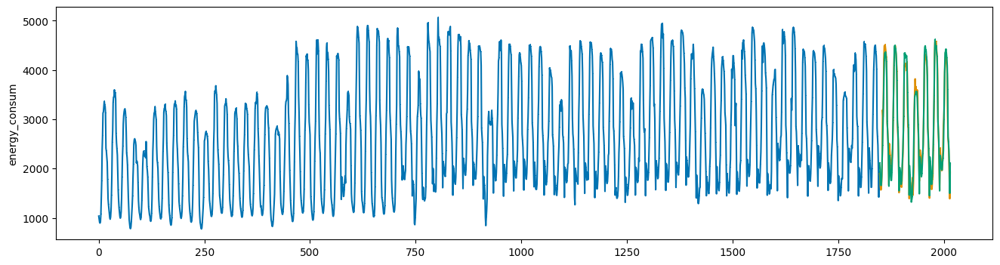

In [46]:
lgbm_evaluation(train_ft_1, test_ft_1)

## 2

[LightGBM] [Info] Total Bins 2467
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 17
[LightGBM] [Info] Start training from score 1679.106526
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[51]	training's l2: 8363.64	training's SMAPE: 4.28914	valid_1's l2: 46404.2	valid_1's SMAPE: 8.9906
SMAPE_SCORE : 8.990598575610294
[LightGBM] [Info] Total Bins 2469
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 17
[LightGBM] [Info] Start training from score 1681.879911
[5.2386057041006975, 8.990598575610294]


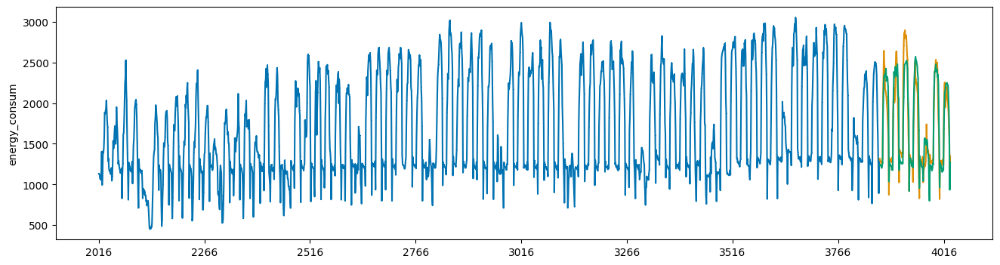

In [47]:
lgbm_evaluation(train_ft_2, test_ft_2)

## 3

[LightGBM] [Info] Total Bins 2465
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 17
[LightGBM] [Info] Start training from score 1455.236007
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[16]	training's l2: 49315.7	training's SMAPE: 11.5333	valid_1's l2: 69449.2	valid_1's SMAPE: 15.4684
SMAPE_SCORE : 15.468435855444696
[LightGBM] [Info] Total Bins 2467
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 17
[LightGBM] [Info] Start training from score 1447.292411
[5.2386057041006975, 8.990598575610294, 15.468435855444696]


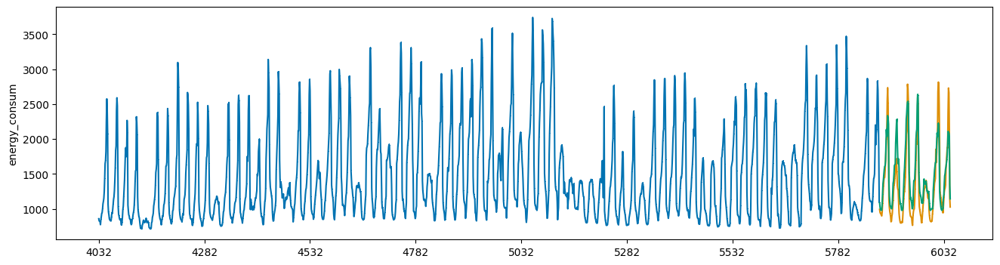

In [48]:
lgbm_evaluation(train_ft_3, test_ft_3)

## 4

[LightGBM] [Info] Total Bins 2463
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 16
[LightGBM] [Info] Start training from score 993.900049
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[99]	training's l2: 414.178	training's SMAPE: 1.72553	valid_1's l2: 3971.95	valid_1's SMAPE: 5.49431
SMAPE_SCORE : 5.494312795168174
[LightGBM] [Info] Total Bins 2465
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 16
[LightGBM] [Info] Start training from score 996.501741
[5.2386057041006975, 8.990598575610294, 15.468435855444696, 5.494312795168174]


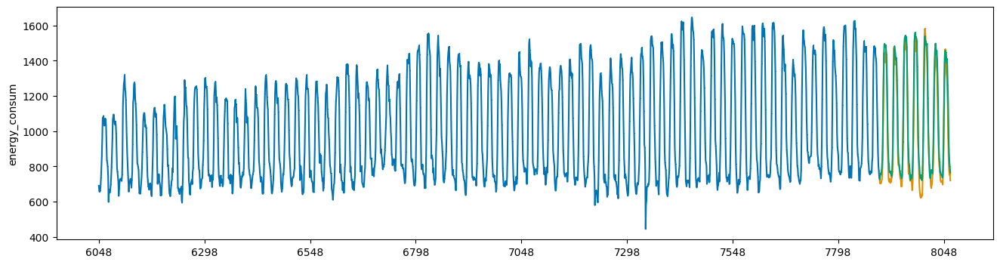

In [49]:
lgbm_evaluation(train_ft_4, test_ft_4)

## 5

[LightGBM] [Info] Total Bins 2463
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 17
[LightGBM] [Info] Start training from score 2730.454478
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[33]	training's l2: 50501.4	training's SMAPE: 5.06393	valid_1's l2: 68751.8	valid_1's SMAPE: 5.59648
SMAPE_SCORE : 5.596482236916065
[LightGBM] [Info] Total Bins 2465
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 17
[LightGBM] [Info] Start training from score 2754.781961
[5.2386057041006975, 8.990598575610294, 15.468435855444696, 5.494312795168174, 5.596482236916065]


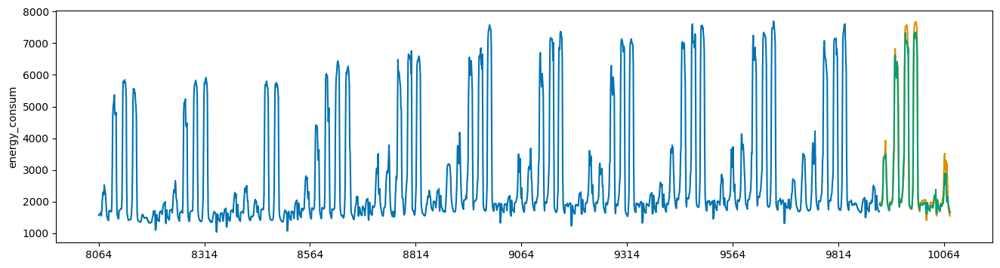

In [50]:
lgbm_evaluation(train_ft_5, test_ft_5)

## 6

In [ ]:
lgbm_evaluation(train_ft_6, test_ft_6)

[LightGBM] [Info] Total Bins 2462
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 17
[LightGBM] [Info] Start training from score 1968.807793
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[68]	training's l2: 1542.3	training's SMAPE: 1.60598	valid_1's l2: 8000.53	valid_1's SMAPE: 3.27085
SMAPE_SCORE : 3.2708471176410847
[LightGBM] [Info] Total Bins 2465
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 17
[LightGBM] [Info] Start training from score 1977.859286


## 7

In [ ]:
lgbm_evaluation(train_ft_7, test_ft_7)

## 8

In [ ]:
lgbm_evaluation(train_ft_8, test_ft_8)

## 9

In [ ]:
lgbm_evaluation(train_ft_9, test_ft_9)

## 10

[LightGBM] [Info] Total Bins 2460
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 16
[LightGBM] [Info] Start training from score 4064.766363
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[6]	training's l2: 133420	training's SMAPE: 1.83239	valid_1's l2: 170701	valid_1's SMAPE: 2.13012
SMAPE_SCORE : 2.130121536415576
[LightGBM] [Info] Total Bins 2462
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 16
[LightGBM] [Info] Start training from score 4062.173927
[1.3096514260251744, 2.2476496439025735, 3.867108963861174, 1.3735781987920435, 1.3991205592290163, 0.8177117794102712, 1.9792006517139409, 1.2448133018942593, 1.06074043895381, 2.130121536415576]


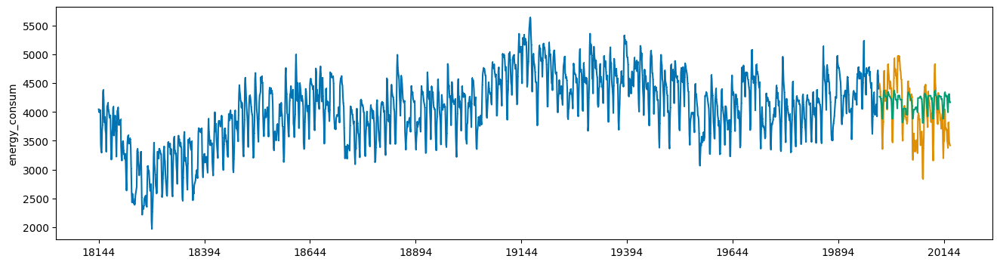

In [ ]:
lgbm_evaluation(train_ft_10, test_ft_10)

## 11

[LightGBM] [Info] Total Bins 2458
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 16
[LightGBM] [Info] Start training from score 1932.463247
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[50]	training's l2: 2446.73	training's SMAPE: 0.431628	valid_1's l2: 7151.88	valid_1's SMAPE: 0.767976
SMAPE_SCORE : 0.767976278032088
[LightGBM] [Info] Total Bins 2459
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 16
[LightGBM] [Info] Start training from score 1933.249643
[1.3096514260251744, 2.2476496439025735, 3.867108963861174, 1.3735781987920435, 1.3991205592290163, 0.8177117794102712, 1.9792006517139409, 1.2448133018942593, 1.06074043895381, 2.130121536415576, 0.767976278032088]


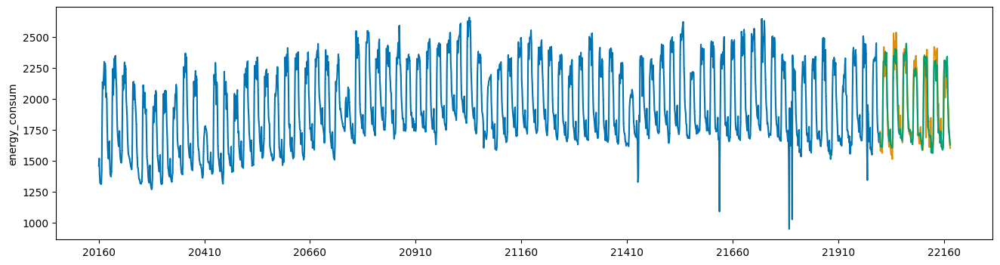

In [ ]:
lgbm_evaluation(train_ft_11, test_ft_11)

## 12

[LightGBM] [Info] Total Bins 2463
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 17
[LightGBM] [Info] Start training from score 1438.764740
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[63]	training's l2: 1021.87	training's SMAPE: 0.854175	valid_1's l2: 6203.6	valid_1's SMAPE: 1.8826
SMAPE_SCORE : 1.8826042642919132
[LightGBM] [Info] Total Bins 2466
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 17
[LightGBM] [Info] Start training from score 1444.928125
[2.6193028520503487, 4.495299287805147, 7.734217927722348, 2.747156397584087, 2.7982411184580327, 1.6354235588205424, 3.9584013034278818, 2.4896266037885186, 2.12148087790762, 4.260243072831152, 1.535952556064176, 1.8826042642919132]


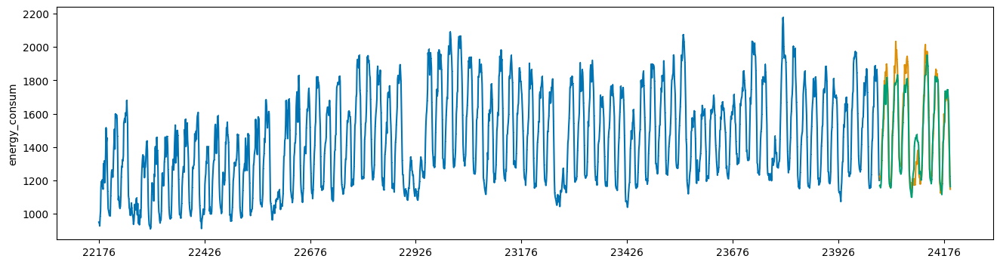

In [ ]:
lgbm_evaluation(train_ft_12, test_ft_12)

## 13

[LightGBM] [Info] Total Bins 2460
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 16
[LightGBM] [Info] Start training from score 2531.728442
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[16]	training's l2: 26201.2	training's SMAPE: 2.62716	valid_1's l2: 37555.3	valid_1's SMAPE: 3.05259
SMAPE_SCORE : 3.0525914102303906
[LightGBM] [Info] Total Bins 2462
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 16
[LightGBM] [Info] Start training from score 2537.385596
[2.6193028520503487, 4.495299287805147, 7.734217927722348, 2.747156397584087, 2.7982411184580327, 1.6354235588205424, 3.9584013034278818, 2.4896266037885186, 2.12148087790762, 4.260243072831152, 1.535952556064176, 1.8826042642919132, 3.0525914102303906]


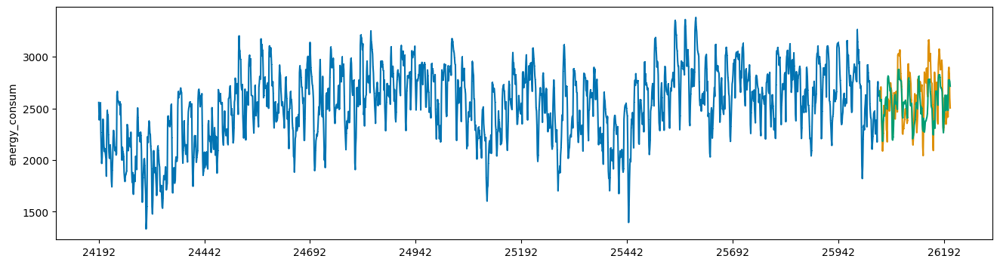

In [ ]:
lgbm_evaluation(train_ft_13, test_ft_13)

## 14

[LightGBM] [Info] Total Bins 2463
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 17
[LightGBM] [Info] Start training from score 1913.528310
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[9]	training's l2: 92450.1	training's SMAPE: 6.84249	valid_1's l2: 139262	valid_1's SMAPE: 8.57945
SMAPE_SCORE : 8.579447562669253
[LightGBM] [Info] Total Bins 2465
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 17
[LightGBM] [Info] Start training from score 1907.782380
[2.6193028520503487, 4.495299287805147, 7.734217927722348, 2.747156397584087, 2.7982411184580327, 1.6354235588205424, 3.9584013034278818, 2.4896266037885186, 2.12148087790762, 4.260243072831152, 1.535952556064176, 1.8826042642919132, 3.0525914102303906, 8.579447562669253]


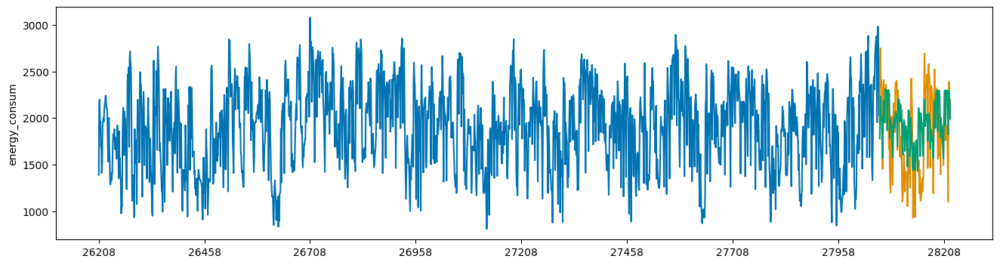

In [ ]:
lgbm_evaluation(train_ft_14, test_ft_14)

## 15

[LightGBM] [Info] Total Bins 2466
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 17
[LightGBM] [Info] Start training from score 1782.912369
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[27]	training's l2: 2911.13	training's SMAPE: 1.13389	valid_1's l2: 4495.99	valid_1's SMAPE: 1.4751
SMAPE_SCORE : 1.4750973146336337
[LightGBM] [Info] Total Bins 2467
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 17
[LightGBM] [Info] Start training from score 1782.149241
[2.6193028520503487, 4.495299287805147, 7.734217927722348, 2.747156397584087, 2.7982411184580327, 1.6354235588205424, 3.9584013034278818, 2.4896266037885186, 2.12148087790762, 4.260243072831152, 1.535952556064176, 1.8826042642919132, 3.0525914102303906, 8.579447562669253, 1.4750973146336337]


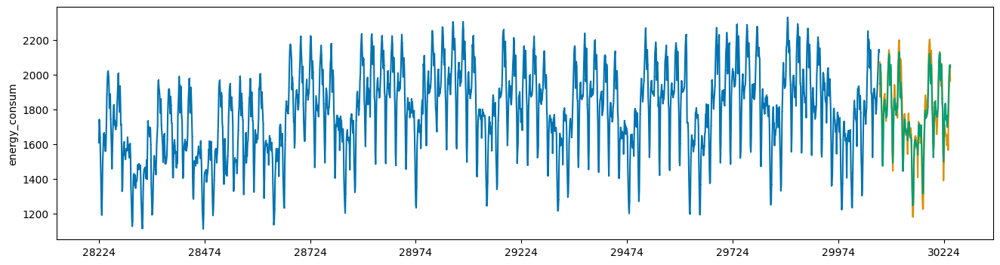

In [ ]:
lgbm_evaluation(train_ft_15, test_ft_15)

## 16

[LightGBM] [Info] Total Bins 2468
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 17
[LightGBM] [Info] Start training from score 3406.021042
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[23]	training's l2: 34096.6	training's SMAPE: 3.13696	valid_1's l2: 38619.7	valid_1's SMAPE: 2.96364
SMAPE_SCORE : 2.963644782442167
[LightGBM] [Info] Total Bins 2470
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 17
[LightGBM] [Info] Start training from score 3414.361193
[2.6193028520503487, 4.495299287805147, 7.734217927722348, 2.747156397584087, 2.7982411184580327, 1.6354235588205424, 3.9584013034278818, 2.4896266037885186, 2.12148087790762, 4.260243072831152, 1.535952556064176, 1.8826042642919132, 3.0525914102303906, 8.579447562669253, 1.4750973146336337, 2.963644782442167]


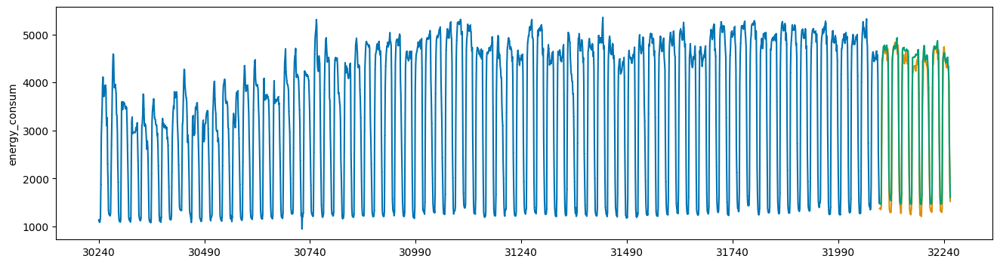

In [ ]:
lgbm_evaluation(train_ft_16, test_ft_16)

## 17

[LightGBM] [Info] Total Bins 2465
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 17
[LightGBM] [Info] Start training from score 978.219886
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[26]	training's l2: 3067.61	training's SMAPE: 2.36074	valid_1's l2: 9061.21	valid_1's SMAPE: 3.16386
SMAPE_SCORE : 3.163861588660989
[LightGBM] [Info] Total Bins 2467
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 17
[LightGBM] [Info] Start training from score 982.527812
[2.6193028520503487, 4.495299287805147, 7.734217927722348, 2.747156397584087, 2.7982411184580327, 1.6354235588205424, 3.9584013034278818, 2.4896266037885186, 2.12148087790762, 4.260243072831152, 1.535952556064176, 1.8826042642919132, 3.0525914102303906, 8.579447562669253, 1.4750973146336337, 2.963644782442167, 3.163861588660989]


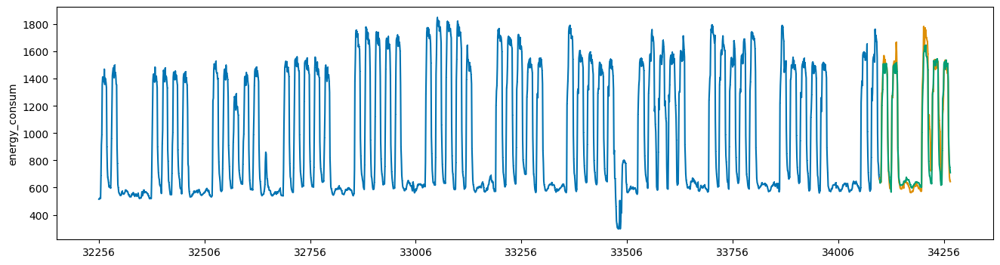

In [ ]:
lgbm_evaluation(train_ft_17, test_ft_17)

## 18

[LightGBM] [Info] Total Bins 2463
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 17
[LightGBM] [Info] Start training from score 1449.849270
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[36]	training's l2: 3420.25	training's SMAPE: 1.46508	valid_1's l2: 20808.7	valid_1's SMAPE: 3.40929
SMAPE_SCORE : 3.4092909807984815
[LightGBM] [Info] Total Bins 2466
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 17
[LightGBM] [Info] Start training from score 1460.628497
[2.6193028520503487, 4.495299287805147, 7.734217927722348, 2.747156397584087, 2.7982411184580327, 1.6354235588205424, 3.9584013034278818, 2.4896266037885186, 2.12148087790762, 4.260243072831152, 1.535952556064176, 1.8826042642919132, 3.0525914102303906, 8.579447562669253, 1.4750973146336337, 2.963644782442167, 3.163861588660989, 3.4092909807984815]


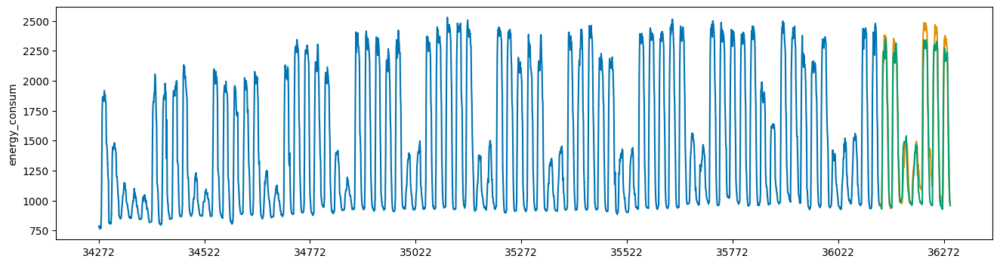

In [ ]:
lgbm_evaluation(train_ft_18, test_ft_18)

## 19

[LightGBM] [Info] Total Bins 2465
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 17
[LightGBM] [Info] Start training from score 1420.082085
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[34]	training's l2: 2892.05	training's SMAPE: 1.5407	valid_1's l2: 29256.2	valid_1's SMAPE: 3.90105
SMAPE_SCORE : 3.90105459147488
[LightGBM] [Info] Total Bins 2467
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 17
[LightGBM] [Info] Start training from score 1430.264054
[2.6193028520503487, 4.495299287805147, 7.734217927722348, 2.747156397584087, 2.7982411184580327, 1.6354235588205424, 3.9584013034278818, 2.4896266037885186, 2.12148087790762, 4.260243072831152, 1.535952556064176, 1.8826042642919132, 3.0525914102303906, 8.579447562669253, 1.4750973146336337, 2.963644782442167, 3.163861588660989, 3.4092909807984815, 3.90105459147488]


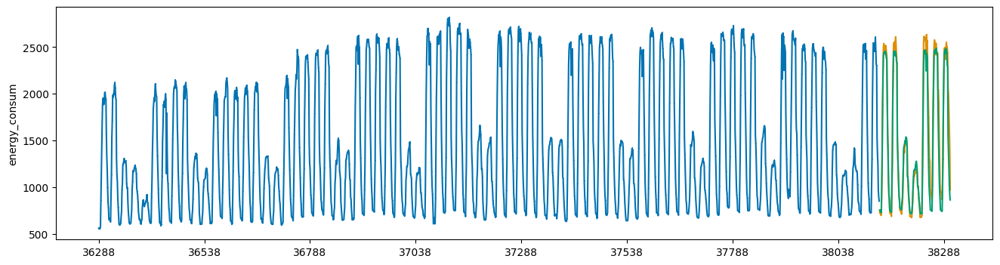

In [ ]:
lgbm_evaluation(train_ft_19, test_ft_19)

## 20

[LightGBM] [Info] Total Bins 2457
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 17
[LightGBM] [Info] Start training from score 1724.482339
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[55]	training's l2: 4685.07	training's SMAPE: 1.30433	valid_1's l2: 16069.1	valid_1's SMAPE: 2.3234
SMAPE_SCORE : 2.3233965495316915
[LightGBM] [Info] Total Bins 2462
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 17
[LightGBM] [Info] Start training from score 1732.892382
[2.6193028520503487, 4.495299287805147, 7.734217927722348, 2.747156397584087, 2.7982411184580327, 1.6354235588205424, 3.9584013034278818, 2.4896266037885186, 2.12148087790762, 4.260243072831152, 1.535952556064176, 1.8826042642919132, 3.0525914102303906, 8.579447562669253, 1.4750973146336337, 2.963644782442167, 3.163861588660989, 3.4092909807984815, 3.90105459147488, 2.3233965495316915]


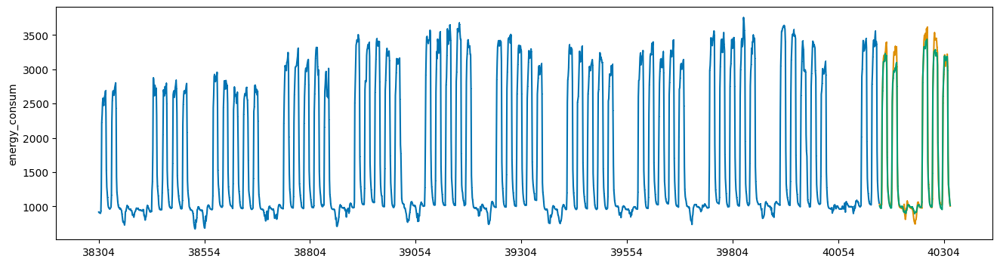

In [ ]:
lgbm_evaluation(train_ft_20, test_ft_20)

## 21

[LightGBM] [Info] Total Bins 2466
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 17
[LightGBM] [Info] Start training from score 1987.589499
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[88]	training's l2: 3659.29	training's SMAPE: 1.08693	valid_1's l2: 30161.5	valid_1's SMAPE: 3.38988
SMAPE_SCORE : 3.3898829258442524
[LightGBM] [Info] Total Bins 2468
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 17
[LightGBM] [Info] Start training from score 1995.378887
[2.6193028520503487, 4.495299287805147, 7.734217927722348, 2.747156397584087, 2.7982411184580327, 1.6354235588205424, 3.9584013034278818, 2.4896266037885186, 2.12148087790762, 4.260243072831152, 1.535952556064176, 1.8826042642919132, 3.0525914102303906, 8.579447562669253, 1.4750973146336337, 2.963644782442167, 3.163861588660989, 3.4092909807984815, 3.90105459147488, 2.3233965495316915, 3.3

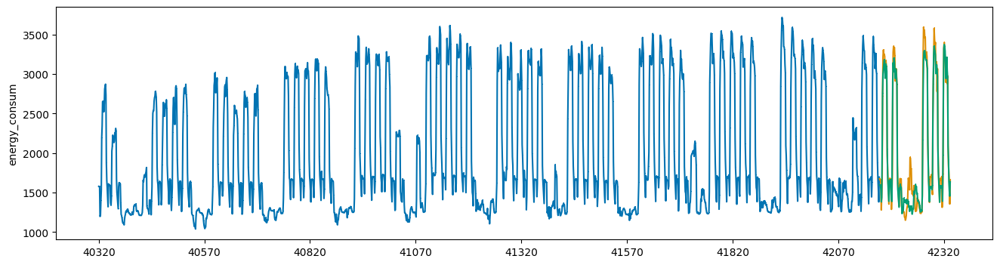

In [ ]:
lgbm_evaluation(train_ft_21, test_ft_21)

## 22

[LightGBM] [Info] Total Bins 2450
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 17
[LightGBM] [Info] Start training from score 1236.076949
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[29]	training's l2: 2362.73	training's SMAPE: 1.46207	valid_1's l2: 6331.91	valid_1's SMAPE: 2.10407
SMAPE_SCORE : 2.1040652426503943
[LightGBM] [Info] Total Bins 2458
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 17
[LightGBM] [Info] Start training from score 1237.861250
[2.6193028520503487, 4.495299287805147, 7.734217927722348, 2.747156397584087, 2.7982411184580327, 1.6354235588205424, 3.9584013034278818, 2.4896266037885186, 2.12148087790762, 4.260243072831152, 1.535952556064176, 1.8826042642919132, 3.0525914102303906, 8.579447562669253, 1.4750973146336337, 2.963644782442167, 3.163861588660989, 3.4092909807984815, 3.90105459147488, 2.3233965495316915, 3.3

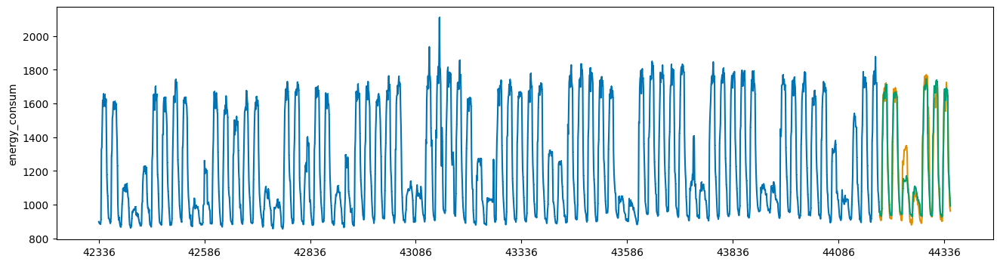

In [ ]:
lgbm_evaluation(train_ft_22, test_ft_22)

## 23

[LightGBM] [Info] Total Bins 2468
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 17
[LightGBM] [Info] Start training from score 1264.469319
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[45]	training's l2: 434.993	training's SMAPE: 0.515013	valid_1's l2: 1440.21	valid_1's SMAPE: 0.822726
SMAPE_SCORE : 0.8227254938838328
[LightGBM] [Info] Total Bins 2469
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 17
[LightGBM] [Info] Start training from score 1267.254167
[2.6193028520503487, 4.495299287805147, 7.734217927722348, 2.747156397584087, 2.7982411184580327, 1.6354235588205424, 3.9584013034278818, 2.4896266037885186, 2.12148087790762, 4.260243072831152, 1.535952556064176, 1.8826042642919132, 3.0525914102303906, 8.579447562669253, 1.4750973146336337, 2.963644782442167, 3.163861588660989, 3.4092909807984815, 3.90105459147488, 2.3233965495316915, 3

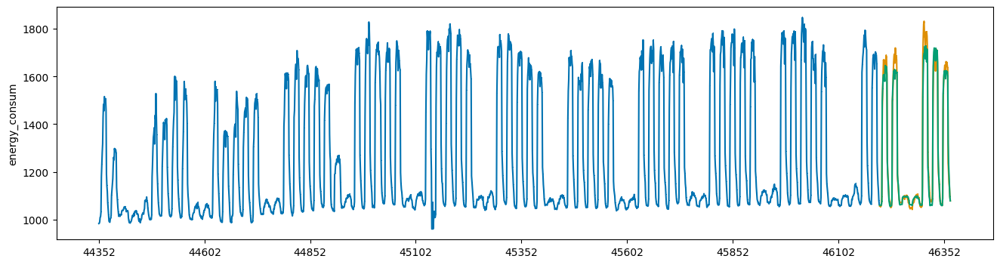

In [ ]:
lgbm_evaluation(train_ft_23, test_ft_23)

## 24

[LightGBM] [Info] Total Bins 2465
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 17
[LightGBM] [Info] Start training from score 10046.908445
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[100]	training's l2: 10229.3	training's SMAPE: 0.400717	valid_1's l2: 102188	valid_1's SMAPE: 1.16373
SMAPE_SCORE : 1.1637266561556292
[LightGBM] [Info] Total Bins 2467
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 17
[LightGBM] [Info] Start training from score 10079.341967
[2.6193028520503487, 4.495299287805147, 7.734217927722348, 2.747156397584087, 2.7982411184580327, 1.6354235588205424, 3.9584013034278818, 2.4896266037885186, 2.12148087790762, 4.260243072831152, 1.535952556064176, 1.8826042642919132, 3.0525914102303906, 8.579447562669253, 1.4750973146336337, 2.963644782442167, 3.163861588660989, 3.4092909807984815, 3.90105459147488, 2.3233965495316915, 

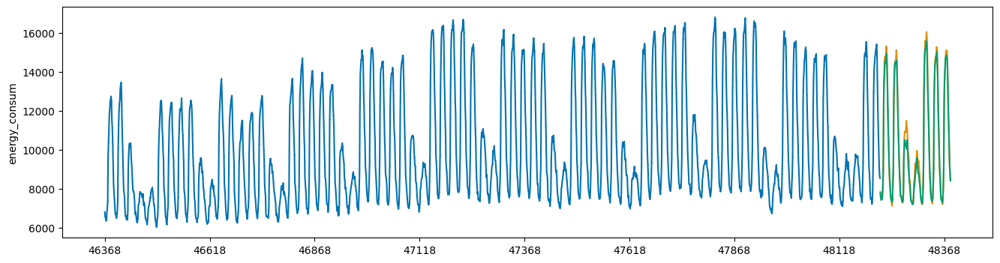

In [ ]:
lgbm_evaluation(train_ft_24, test_ft_24)

## 25

[LightGBM] [Info] Total Bins 2465
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 17
[LightGBM] [Info] Start training from score 7265.609476
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[45]	training's l2: 37299.7	training's SMAPE: 0.804306	valid_1's l2: 274253	valid_1's SMAPE: 1.78353
SMAPE_SCORE : 1.7835317004820277
[LightGBM] [Info] Total Bins 2467
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 17
[LightGBM] [Info] Start training from score 7288.983864
[2.6193028520503487, 4.495299287805147, 7.734217927722348, 2.747156397584087, 2.7982411184580327, 1.6354235588205424, 3.9584013034278818, 2.4896266037885186, 2.12148087790762, 4.260243072831152, 1.535952556064176, 1.8826042642919132, 3.0525914102303906, 8.579447562669253, 1.4750973146336337, 2.963644782442167, 3.163861588660989, 3.4092909807984815, 3.90105459147488, 2.3233965495316915, 3.3

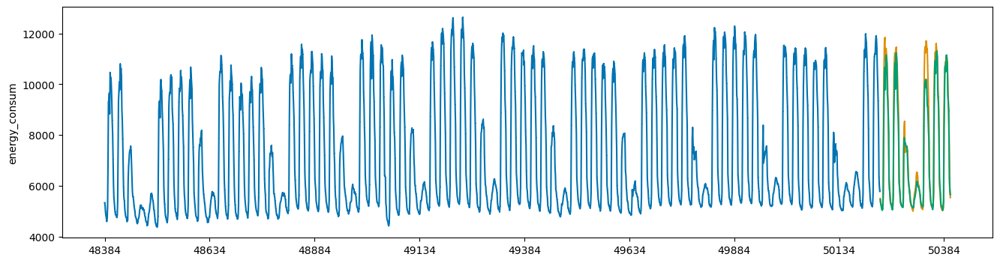

In [ ]:
lgbm_evaluation(train_ft_25, test_ft_25)

## 26

[LightGBM] [Info] Total Bins 2460
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 17
[LightGBM] [Info] Start training from score 3536.451428
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[44]	training's l2: 5886.3	training's SMAPE: 0.808118	valid_1's l2: 17269.5	valid_1's SMAPE: 1.17835
SMAPE_SCORE : 1.1783500159149958
[LightGBM] [Info] Total Bins 2461
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 17
[LightGBM] [Info] Start training from score 3540.765476
[2.6193028520503487, 4.495299287805147, 7.734217927722348, 2.747156397584087, 2.7982411184580327, 1.6354235588205424, 3.9584013034278818, 2.4896266037885186, 2.12148087790762, 4.260243072831152, 1.535952556064176, 1.8826042642919132, 3.0525914102303906, 8.579447562669253, 1.4750973146336337, 2.963644782442167, 3.163861588660989, 3.4092909807984815, 3.90105459147488, 2.3233965495316915, 3.3

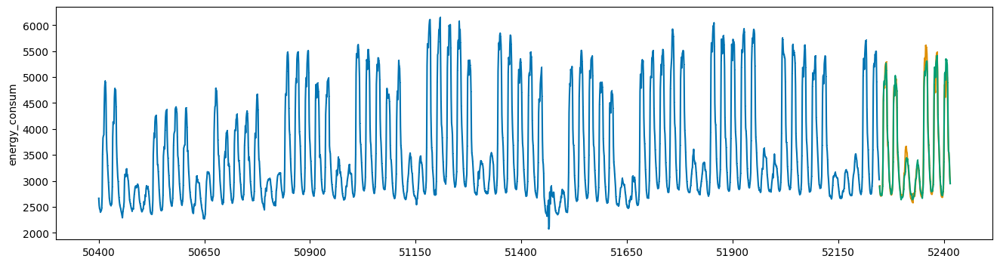

In [ ]:
lgbm_evaluation(train_ft_26, test_ft_26)

## 27

[LightGBM] [Info] Total Bins 2468
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 17
[LightGBM] [Info] Start training from score 17479.325746
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[43]	training's l2: 58466.2	training's SMAPE: 0.483428	valid_1's l2: 214591	valid_1's SMAPE: 0.923717
SMAPE_SCORE : 0.9237168267356308
[LightGBM] [Info] Total Bins 2468
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 17
[LightGBM] [Info] Start training from score 17501.216653
[2.6193028520503487, 4.495299287805147, 7.734217927722348, 2.747156397584087, 2.7982411184580327, 1.6354235588205424, 3.9584013034278818, 2.4896266037885186, 2.12148087790762, 4.260243072831152, 1.535952556064176, 1.8826042642919132, 3.0525914102303906, 8.579447562669253, 1.4750973146336337, 2.963644782442167, 3.163861588660989, 3.4092909807984815, 3.90105459147488, 2.3233965495316915, 

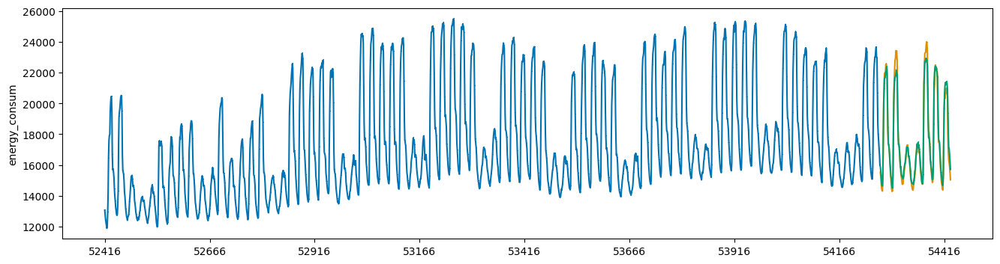

In [ ]:
lgbm_evaluation(train_ft_27, test_ft_27)

## 28

[LightGBM] [Info] Total Bins 2466
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 17
[LightGBM] [Info] Start training from score 1741.411169
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[28]	training's l2: 8309	training's SMAPE: 1.86992	valid_1's l2: 18301	valid_1's SMAPE: 3.3643
SMAPE_SCORE : 3.36429545136155
[LightGBM] [Info] Total Bins 2467
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 17
[LightGBM] [Info] Start training from score 1733.818750
[2.6193028520503487, 4.495299287805147, 7.734217927722348, 2.747156397584087, 2.7982411184580327, 1.6354235588205424, 3.9584013034278818, 2.4896266037885186, 2.12148087790762, 4.260243072831152, 1.535952556064176, 1.8826042642919132, 3.0525914102303906, 8.579447562669253, 1.4750973146336337, 2.963644782442167, 3.163861588660989, 3.4092909807984815, 3.90105459147488, 2.3233965495316915, 3.389882925

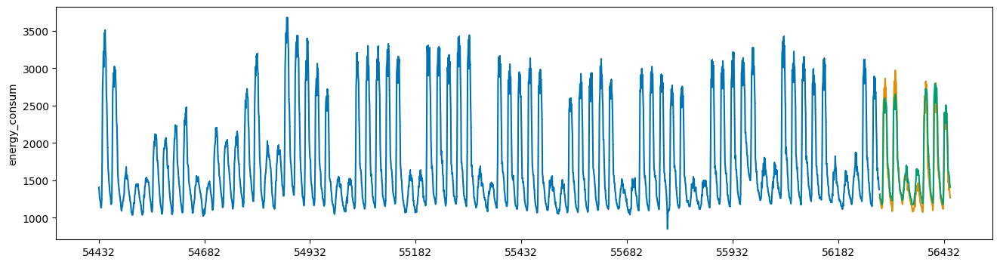

In [ ]:
lgbm_evaluation(train_ft_28, test_ft_28)

## 29

[LightGBM] [Info] Total Bins 2459
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 17
[LightGBM] [Info] Start training from score 1455.595374
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[56]	training's l2: 1103.4	training's SMAPE: 0.878184	valid_1's l2: 6800.43	valid_1's SMAPE: 1.81419
SMAPE_SCORE : 1.8141853456352504
[LightGBM] [Info] Total Bins 2464
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 17
[LightGBM] [Info] Start training from score 1454.552307
[2.6193028520503487, 4.495299287805147, 7.734217927722348, 2.747156397584087, 2.7982411184580327, 1.6354235588205424, 3.9584013034278818, 2.4896266037885186, 2.12148087790762, 4.260243072831152, 1.535952556064176, 1.8826042642919132, 3.0525914102303906, 8.579447562669253, 1.4750973146336337, 2.963644782442167, 3.163861588660989, 3.4092909807984815, 3.90105459147488, 2.3233965495316915, 3.3

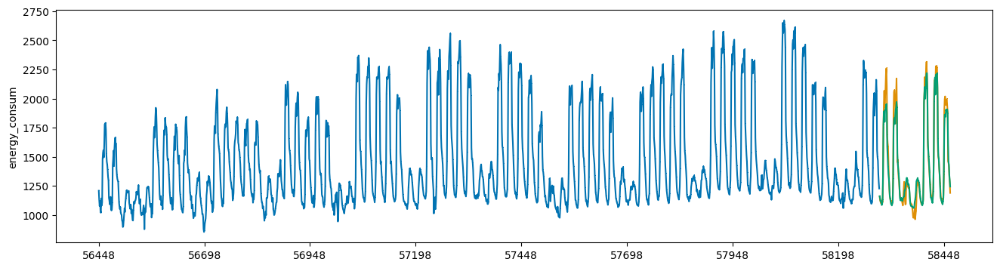

In [ ]:
lgbm_evaluation(train_ft_29, test_ft_29)

## 30

[LightGBM] [Info] Total Bins 2470
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 17
[LightGBM] [Info] Start training from score 843.738393
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[28]	training's l2: 3439.81	training's SMAPE: 2.66649	valid_1's l2: 12126.1	valid_1's SMAPE: 4.27964
SMAPE_SCORE : 4.279644015614242
[LightGBM] [Info] Total Bins 2471
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 17
[LightGBM] [Info] Start training from score 845.154837
[2.6193028520503487, 4.495299287805147, 7.734217927722348, 2.747156397584087, 2.7982411184580327, 1.6354235588205424, 3.9584013034278818, 2.4896266037885186, 2.12148087790762, 4.260243072831152, 1.535952556064176, 1.8826042642919132, 3.0525914102303906, 8.579447562669253, 1.4750973146336337, 2.963644782442167, 3.163861588660989, 3.4092909807984815, 3.90105459147488, 2.3233965495316915, 3.3898

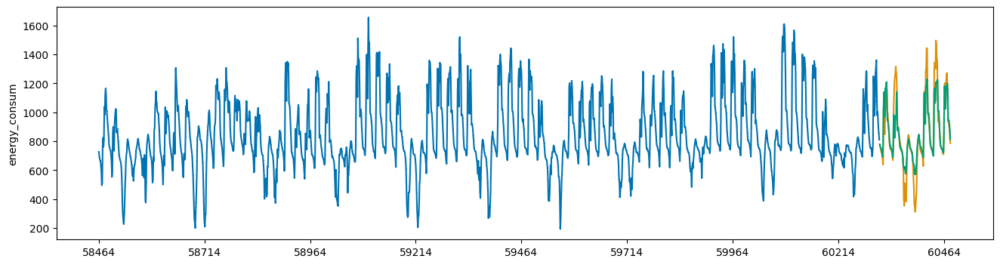

In [ ]:
lgbm_evaluation(train_ft_30, test_ft_30)

## 31

[LightGBM] [Info] Total Bins 2469
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 17
[LightGBM] [Info] Start training from score 1363.991005
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[48]	training's l2: 1526.51	training's SMAPE: 1.07154	valid_1's l2: 7869.2	valid_1's SMAPE: 2.45719
SMAPE_SCORE : 2.4571890611039615
[LightGBM] [Info] Total Bins 2470
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 17
[LightGBM] [Info] Start training from score 1358.770088
[2.6193028520503487, 4.495299287805147, 7.734217927722348, 2.747156397584087, 2.7982411184580327, 1.6354235588205424, 3.9584013034278818, 2.4896266037885186, 2.12148087790762, 4.260243072831152, 1.535952556064176, 1.8826042642919132, 3.0525914102303906, 8.579447562669253, 1.4750973146336337, 2.963644782442167, 3.163861588660989, 3.4092909807984815, 3.90105459147488, 2.3233965495316915, 3.38

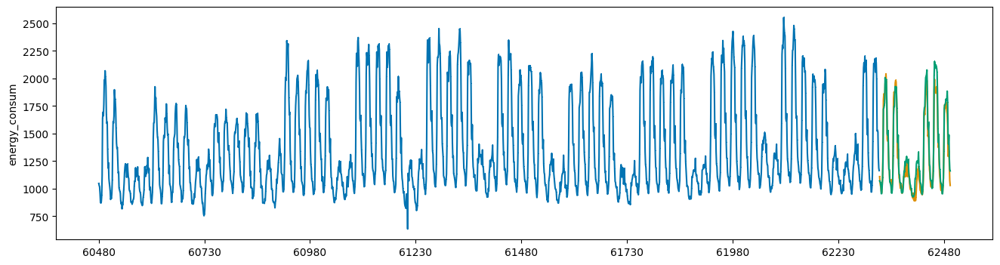

In [ ]:
lgbm_evaluation(train_ft_31, test_ft_31)

## 32

[LightGBM] [Info] Total Bins 2464
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 16
[LightGBM] [Info] Start training from score 9871.341222
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[77]	training's l2: 361.088	training's SMAPE: 0.0731026	valid_1's l2: 4998.52	valid_1's SMAPE: 0.279885
SMAPE_SCORE : 0.27988442493529486
[LightGBM] [Info] Total Bins 2466
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 16
[LightGBM] [Info] Start training from score 9872.854094
[2.6193028520503487, 4.495299287805147, 7.734217927722348, 2.747156397584087, 2.7982411184580327, 1.6354235588205424, 3.9584013034278818, 2.4896266037885186, 2.12148087790762, 4.260243072831152, 1.535952556064176, 1.8826042642919132, 3.0525914102303906, 8.579447562669253, 1.4750973146336337, 2.963644782442167, 3.163861588660989, 3.4092909807984815, 3.90105459147488, 2.3233965495316915,

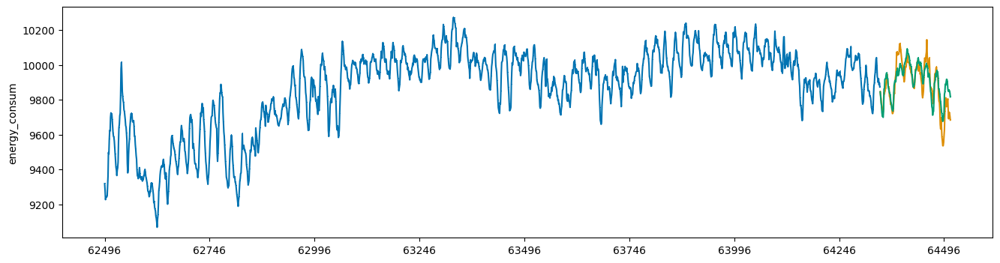

In [ ]:
lgbm_evaluation(train_ft_32, test_ft_32)

## 33

[LightGBM] [Info] Total Bins 2463
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 16
[LightGBM] [Info] Start training from score 8699.036486
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[49]	training's l2: 428.711	training's SMAPE: 0.0900574	valid_1's l2: 1704.7	valid_1's SMAPE: 0.188466
SMAPE_SCORE : 0.18846569357843107
[LightGBM] [Info] Total Bins 2465
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 16
[LightGBM] [Info] Start training from score 8705.436427
[2.6193028520503487, 4.495299287805147, 7.734217927722348, 2.747156397584087, 2.7982411184580327, 1.6354235588205424, 3.9584013034278818, 2.4896266037885186, 2.12148087790762, 4.260243072831152, 1.535952556064176, 1.8826042642919132, 3.0525914102303906, 8.579447562669253, 1.4750973146336337, 2.963644782442167, 3.163861588660989, 3.4092909807984815, 3.90105459147488, 2.3233965495316915, 

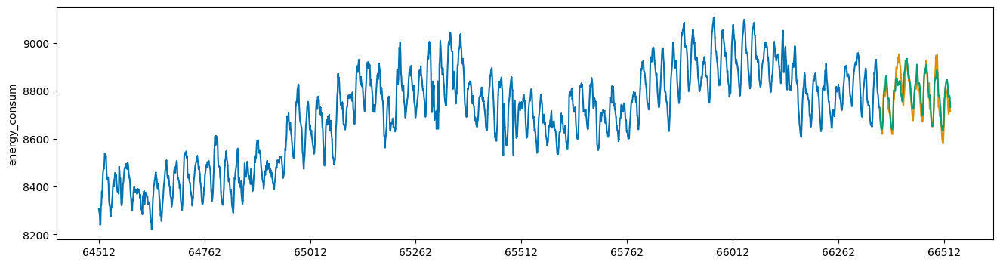

In [ ]:
lgbm_evaluation(train_ft_33, test_ft_33)

## 34

[LightGBM] [Info] Total Bins 2460
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 16
[LightGBM] [Info] Start training from score 3353.344285
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[96]	training's l2: 258.232	training's SMAPE: 0.126846	valid_1's l2: 1435.46	valid_1's SMAPE: 0.397705
SMAPE_SCORE : 0.3977052817911015
[LightGBM] [Info] Total Bins 2462
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 16
[LightGBM] [Info] Start training from score 3355.337678
[2.6193028520503487, 4.495299287805147, 7.734217927722348, 2.747156397584087, 2.7982411184580327, 1.6354235588205424, 3.9584013034278818, 2.4896266037885186, 2.12148087790762, 4.260243072831152, 1.535952556064176, 1.8826042642919132, 3.0525914102303906, 8.579447562669253, 1.4750973146336337, 2.963644782442167, 3.163861588660989, 3.4092909807984815, 3.90105459147488, 2.3233965495316915, 3

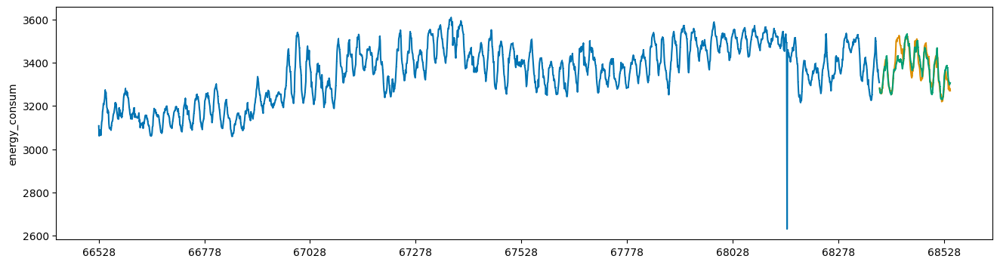

In [ ]:
lgbm_evaluation(train_ft_34, test_ft_34)

## 35

[LightGBM] [Info] Total Bins 2459
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 16
[LightGBM] [Info] Start training from score 2172.606819
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[100]	training's l2: 20.9828	training's SMAPE: 0.0757305	valid_1's l2: 208.144	valid_1's SMAPE: 0.259664
SMAPE_SCORE : 0.25966457563067136
[LightGBM] [Info] Total Bins 2461
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 16
[LightGBM] [Info] Start training from score 2173.522917
[2.6193028520503487, 4.495299287805147, 7.734217927722348, 2.747156397584087, 2.7982411184580327, 1.6354235588205424, 3.9584013034278818, 2.4896266037885186, 2.12148087790762, 4.260243072831152, 1.535952556064176, 1.8826042642919132, 3.0525914102303906, 8.579447562669253, 1.4750973146336337, 2.963644782442167, 3.163861588660989, 3.4092909807984815, 3.90105459147488, 2.3233965495316915

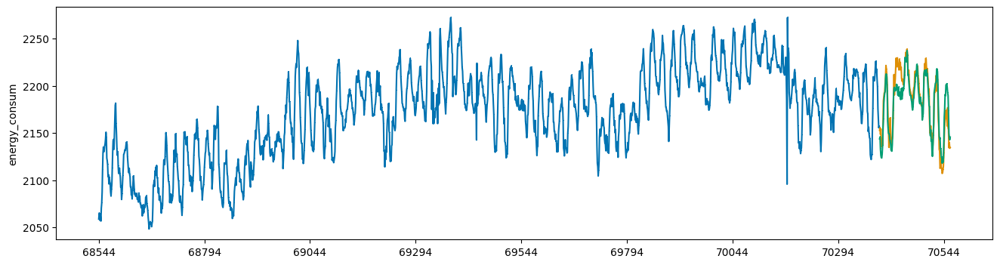

In [ ]:
lgbm_evaluation(train_ft_35, test_ft_35)

## 36

[LightGBM] [Info] Total Bins 2458
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 16
[LightGBM] [Info] Start training from score 2893.058246
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[98]	training's l2: 44.3697	training's SMAPE: 0.088749	valid_1's l2: 395.688	valid_1's SMAPE: 0.259189
SMAPE_SCORE : 0.2591888500688085
[LightGBM] [Info] Total Bins 2461
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 16
[LightGBM] [Info] Start training from score 2893.374107
[2.6193028520503487, 4.495299287805147, 7.734217927722348, 2.747156397584087, 2.7982411184580327, 1.6354235588205424, 3.9584013034278818, 2.4896266037885186, 2.12148087790762, 4.260243072831152, 1.535952556064176, 1.8826042642919132, 3.0525914102303906, 8.579447562669253, 1.4750973146336337, 2.963644782442167, 3.163861588660989, 3.4092909807984815, 3.90105459147488, 2.3233965495316915, 3

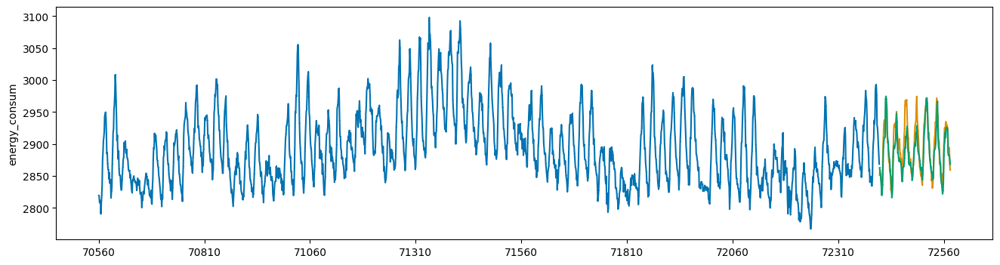

In [ ]:
lgbm_evaluation(train_ft_36, test_ft_36)

## 37

[LightGBM] [Info] Total Bins 2467
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 17
[LightGBM] [Info] Start training from score 3347.322238
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[38]	training's l2: 12991.1	training's SMAPE: 1.71611	valid_1's l2: 20964.8	valid_1's SMAPE: 1.48626
SMAPE_SCORE : 1.4862600532068801
[LightGBM] [Info] Total Bins 2469
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 17
[LightGBM] [Info] Start training from score 3357.473956
[2.6193028520503487, 4.495299287805147, 7.734217927722348, 2.747156397584087, 2.7982411184580327, 1.6354235588205424, 3.9584013034278818, 2.4896266037885186, 2.12148087790762, 4.260243072831152, 1.535952556064176, 1.8826042642919132, 3.0525914102303906, 8.579447562669253, 1.4750973146336337, 2.963644782442167, 3.163861588660989, 3.4092909807984815, 3.90105459147488, 2.3233965495316915, 3.3

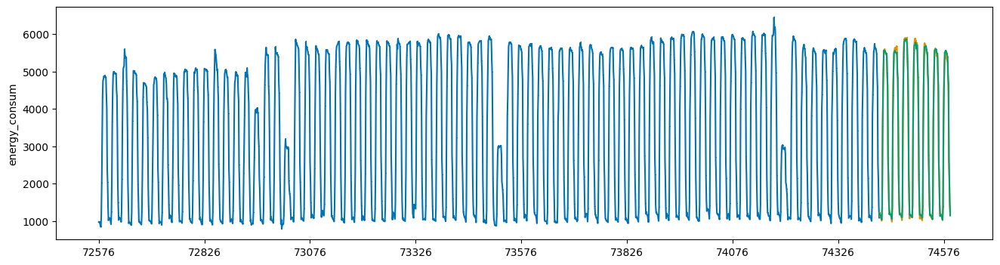

In [ ]:
lgbm_evaluation(train_ft_37, test_ft_37)

## 38

[LightGBM] [Info] Total Bins 2465
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 17
[LightGBM] [Info] Start training from score 1807.772727
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[56]	training's l2: 2748.19	training's SMAPE: 1.24809	valid_1's l2: 2769.05	valid_1's SMAPE: 1.73194
SMAPE_SCORE : 1.7319369399976847
[LightGBM] [Info] Total Bins 2467
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 17
[LightGBM] [Info] Start training from score 1814.066072
[2.6193028520503487, 4.495299287805147, 7.734217927722348, 2.747156397584087, 2.7982411184580327, 1.6354235588205424, 3.9584013034278818, 2.4896266037885186, 2.12148087790762, 4.260243072831152, 1.535952556064176, 1.8826042642919132, 3.0525914102303906, 8.579447562669253, 1.4750973146336337, 2.963644782442167, 3.163861588660989, 3.4092909807984815, 3.90105459147488, 2.3233965495316915, 3.3

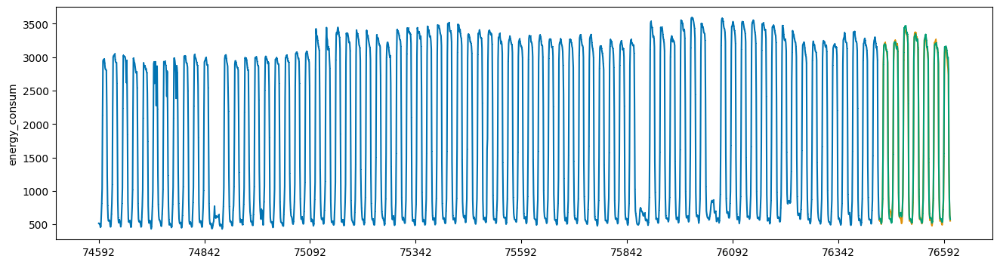

In [ ]:
lgbm_evaluation(train_ft_38, test_ft_38)

## 39

[LightGBM] [Info] Total Bins 2468
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 17
[LightGBM] [Info] Start training from score 2166.333767
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[70]	training's l2: 1695.42	training's SMAPE: 0.500277	valid_1's l2: 2901.6	valid_1's SMAPE: 0.815224
SMAPE_SCORE : 0.8152238879652475
[LightGBM] [Info] Total Bins 2470
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 17
[LightGBM] [Info] Start training from score 2172.330954
[1.3096514260251744, 2.2476496439025735, 3.867108963861174, 1.3735781987920435, 1.3991205592290163, 0.8177117794102712, 1.9792006517139409, 1.2448133018942593, 1.06074043895381, 2.130121536415576, 0.767976278032088, 0.9413021321459566, 1.5262957051151953, 4.289723781334627, 0.7375486573168168, 1.4818223912210835, 1.5819307943304945, 1.7046454903992407, 1.95052729573744, 1.1616982747658458

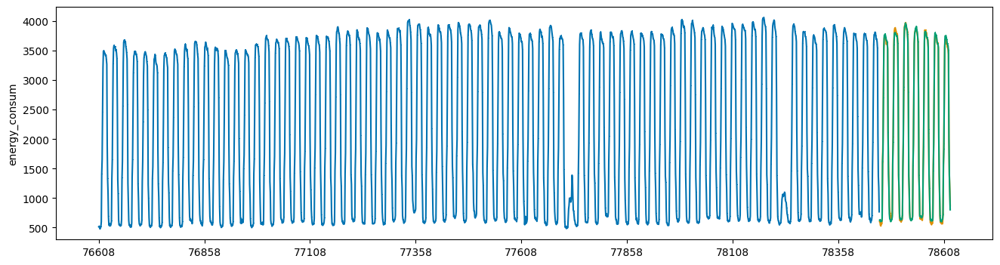

In [ ]:
lgbm_evaluation(train_ft_39, test_ft_39)

## 40

[LightGBM] [Info] Total Bins 2448
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 17
[LightGBM] [Info] Start training from score 1878.314774
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[24]	training's l2: 30080.6	training's SMAPE: 3.19224	valid_1's l2: 27717.9	valid_1's SMAPE: 2.19437
SMAPE_SCORE : 2.194366063408913
[LightGBM] [Info] Total Bins 2453
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 17
[LightGBM] [Info] Start training from score 1889.157293
[1.3096514260251744, 2.2476496439025735, 3.867108963861174, 1.3735781987920435, 1.3991205592290163, 0.8177117794102712, 1.9792006517139409, 1.2448133018942593, 1.06074043895381, 2.130121536415576, 0.767976278032088, 0.9413021321459566, 1.5262957051151953, 4.289723781334627, 0.7375486573168168, 1.4818223912210835, 1.5819307943304945, 1.7046454903992407, 1.95052729573744, 1.1616982747658458, 

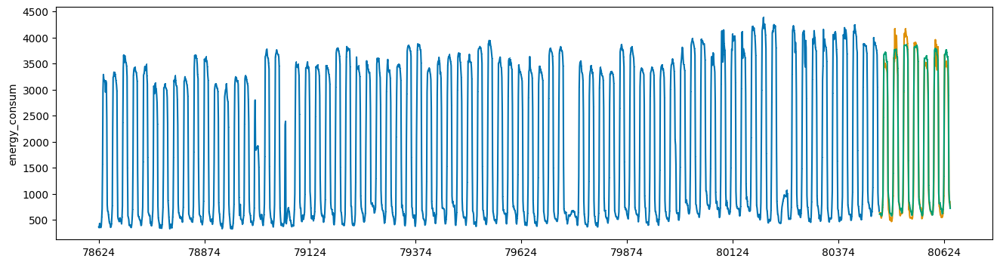

In [ ]:
lgbm_evaluation(train_ft_40, test_ft_40)

## 41

[LightGBM] [Info] Total Bins 2467
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 18
[LightGBM] [Info] Start training from score 3255.086202
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[56]	training's l2: 10429.1	training's SMAPE: 1.44773	valid_1's l2: 16019.4	valid_1's SMAPE: 1.85628
SMAPE_SCORE : 1.85628443661381
[LightGBM] [Info] Total Bins 2469
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 18
[LightGBM] [Info] Start training from score 3272.762351
[2.6193028520503487, 4.495299287805147, 7.734217927722348, 2.747156397584087, 2.7982411184580327, 1.6354235588205424, 3.9584013034278818, 2.4896266037885186, 2.12148087790762, 4.260243072831152, 1.535952556064176, 1.8826042642919132, 3.0525914102303906, 8.579447562669253, 1.4750973146336337, 2.963644782442167, 3.163861588660989, 3.4092909807984815, 3.90105459147488, 2.3233965495316915, 3.389

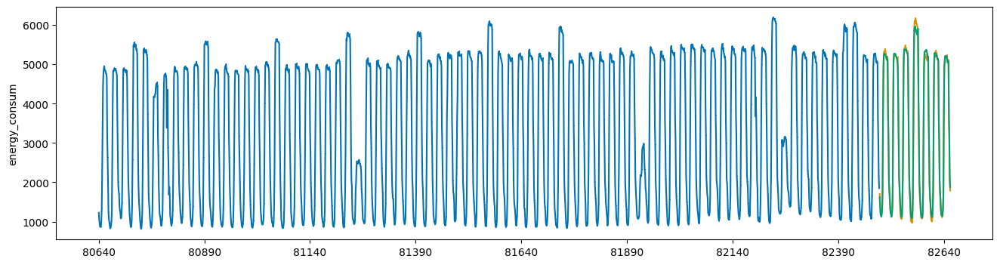

In [ ]:
lgbm_evaluation(train_ft_41, test_ft_41)

## 42

[LightGBM] [Info] Total Bins 2467
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 17
[LightGBM] [Info] Start training from score 1604.826817
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[90]	training's l2: 916.79	training's SMAPE: 0.914216	valid_1's l2: 13980.3	valid_1's SMAPE: 3.06567
SMAPE_SCORE : 3.065666029731918
[LightGBM] [Info] Total Bins 2468
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 17
[LightGBM] [Info] Start training from score 1597.826964
[2.6193028520503487, 4.495299287805147, 7.734217927722348, 2.747156397584087, 2.7982411184580327, 1.6354235588205424, 3.9584013034278818, 2.4896266037885186, 2.12148087790762, 4.260243072831152, 1.535952556064176, 1.8826042642919132, 3.0525914102303906, 8.579447562669253, 1.4750973146336337, 2.963644782442167, 3.163861588660989, 3.4092909807984815, 3.90105459147488, 2.3233965495316915, 3.38

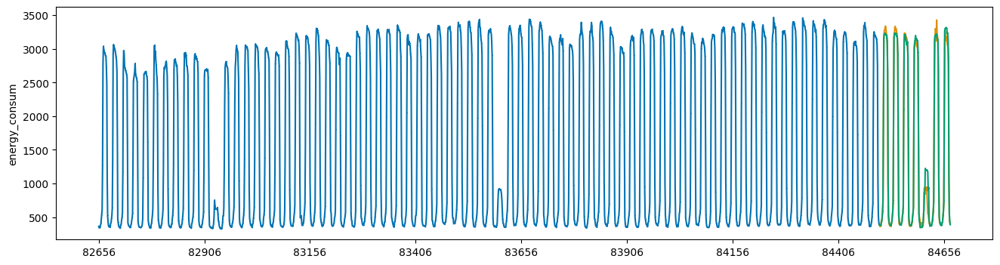

In [ ]:
lgbm_evaluation(train_ft_42, test_ft_42)

## 43

[LightGBM] [Info] Total Bins 2450
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 17
[LightGBM] [Info] Start training from score 1889.464939
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[90]	training's l2: 1194.32	training's SMAPE: 1.18766	valid_1's l2: 6974.91	valid_1's SMAPE: 2.38002
SMAPE_SCORE : 2.380021339182576
[LightGBM] [Info] Total Bins 2458
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 17
[LightGBM] [Info] Start training from score 1897.245837
[2.6193028520503487, 4.495299287805147, 7.734217927722348, 2.747156397584087, 2.7982411184580327, 1.6354235588205424, 3.9584013034278818, 2.4896266037885186, 2.12148087790762, 4.260243072831152, 1.535952556064176, 1.8826042642919132, 3.0525914102303906, 8.579447562669253, 1.4750973146336337, 2.963644782442167, 3.163861588660989, 3.4092909807984815, 3.90105459147488, 2.3233965495316915, 3.38

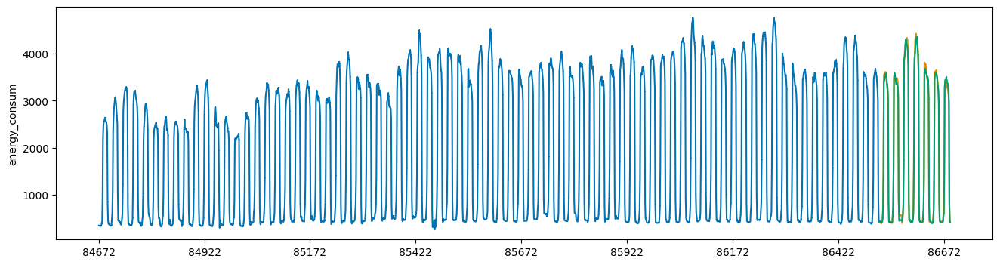

In [ ]:
lgbm_evaluation(train_ft_43, test_ft_43)

## 44

[LightGBM] [Info] Total Bins 2451
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 17
[LightGBM] [Info] Start training from score 2125.560260
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[32]	training's l2: 6218.78	training's SMAPE: 1.40279	valid_1's l2: 13096.7	valid_1's SMAPE: 1.94664
SMAPE_SCORE : 1.9466412540993177
[LightGBM] [Info] Total Bins 2459
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 17
[LightGBM] [Info] Start training from score 2129.255239
[1.3096514260251744, 2.2476496439025735, 3.867108963861174, 1.3735781987920435, 1.3991205592290163, 0.8177117794102712, 1.9792006517139409, 1.2448133018942593, 1.06074043895381, 2.130121536415576, 0.767976278032088, 0.9413021321459566, 1.5262957051151953, 4.289723781334627, 0.7375486573168168, 1.4818223912210835, 1.5819307943304945, 1.7046454903992407, 1.95052729573744, 1.1616982747658458,

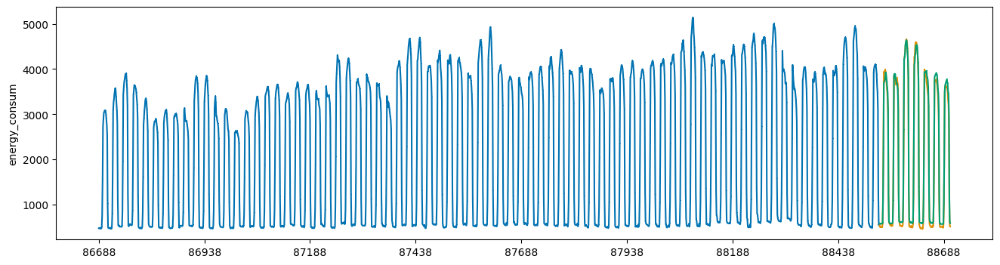

In [ ]:
lgbm_evaluation(train_ft_44, test_ft_44)

## 45

In [ ]:
train_ft_45.head()

,energy_consum,time,day,month,week,sin_time,cos_time,temp_RM,wind_RM,hum_RM,temp_EMA,wind_EMA,hum_EMA,THI,feels_temp,day_hour_mean,periodic_avg_power_change_rate,periodic_avg_power_change_rate_6,weekend
88704,1967.52,0,3,6,22,0.000000,1.000000,24.150000,3.183333,39.666667,22.027950,2.485679,47.470422,69.672872,28.818026,2347.08,0.022423,0.004932,0
88705,1945.92,1,3,6,22,0.258819,0.965926,23.258333,2.900000,43.583333,21.346727,2.226344,50.782665,68.942223,27.987268,2347.56,0.026160,0.005352,0
88706,1918.08,2,3,6,22,0.500000,0.866025,22.325000,2.583333,47.916667,20.708769,1.991522,53.893024,68.121589,27.080175,2324.88,0.025630,0.005576,0
88707,1906.08,3,3,6,22,0.707107,0.707107,21.400000,2.400000,52.583333,20.168959,2.023595,57.140251,67.254888,26.152269,2302.52,0.023099,0.005132,0
88708,1941.60,4,3,6,22,0.866025,0.500000,20.533333,2.133333,57.000000,19.712196,2.019965,60.810982,66.367960,25.248724,2375.88,0.025552,0.006059,0


[LightGBM] [Info] Total Bins 2466
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 17
[LightGBM] [Info] Start training from score 2949.231167
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[33]	training's l2: 4605.25	training's SMAPE: 0.465754	valid_1's l2: 6064.54	valid_1's SMAPE: 0.497211
SMAPE_SCORE : 0.49721075012829935
[LightGBM] [Info] Total Bins 2468
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 17
[LightGBM] [Info] Start training from score 2960.537141
[1.3096514260251744, 2.2476496439025735, 3.867108963861174, 1.3735781987920435, 1.3991205592290163, 0.8177117794102712, 1.9792006517139409, 1.2448133018942593, 1.06074043895381, 2.130121536415576, 0.767976278032088, 0.9413021321459566, 1.5262957051151953, 4.289723781334627, 0.7375486573168168, 1.4818223912210835, 1.5819307943304945, 1.7046454903992407, 1.95052729573744, 1.16169827476584

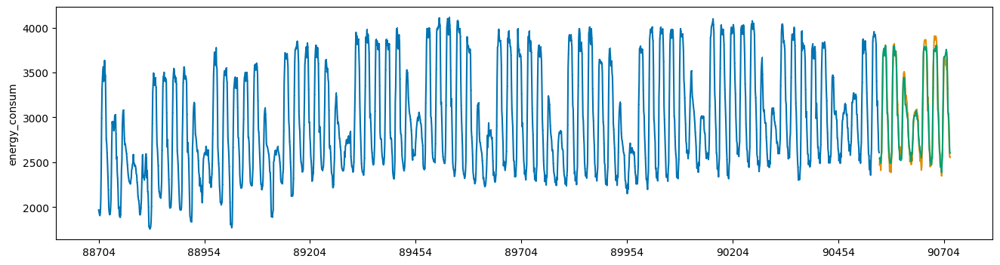

In [ ]:
lgbm_evaluation(train_ft_45, test_ft_45)

## 46

[LightGBM] [Info] Total Bins 2466
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 17
[LightGBM] [Info] Start training from score 2250.247792
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[47]	training's l2: 4607.73	training's SMAPE: 0.607654	valid_1's l2: 24156.4	valid_1's SMAPE: 1.20808
SMAPE_SCORE : 1.2080823412493926
[LightGBM] [Info] Total Bins 2468
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 17
[LightGBM] [Info] Start training from score 2258.839286
[1.3096514260251744, 2.2476496439025735, 3.867108963861174, 1.3735781987920435, 1.3991205592290163, 0.8177117794102712, 1.9792006517139409, 1.2448133018942593, 1.06074043895381, 2.130121536415576, 0.767976278032088, 0.9413021321459566, 1.5262957051151953, 4.289723781334627, 0.7375486573168168, 1.4818223912210835, 1.5819307943304945, 1.7046454903992407, 1.95052729573744, 1.1616982747658458

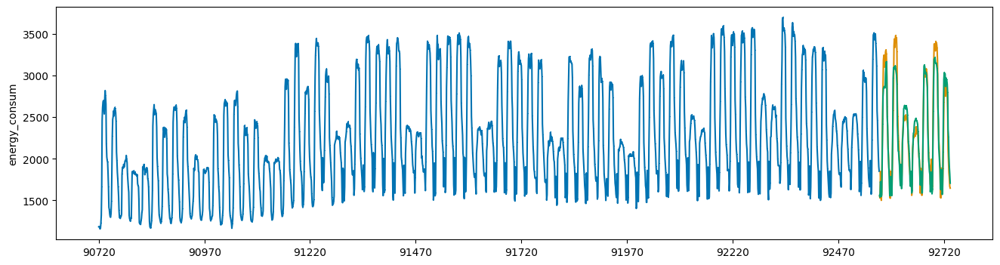

In [ ]:
lgbm_evaluation(train_ft_46, test_ft_46)

## 47

[LightGBM] [Info] Total Bins 2462
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 17
[LightGBM] [Info] Start training from score 5387.977272
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[40]	training's l2: 14153.4	training's SMAPE: 0.449439	valid_1's l2: 67595.2	valid_1's SMAPE: 0.997754
SMAPE_SCORE : 0.9977540499004453
[LightGBM] [Info] Total Bins 2465
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 17
[LightGBM] [Info] Start training from score 5391.546070
[1.3096514260251744, 2.2476496439025735, 3.867108963861174, 1.3735781987920435, 1.3991205592290163, 0.8177117794102712, 1.9792006517139409, 1.2448133018942593, 1.06074043895381, 2.130121536415576, 0.767976278032088, 0.9413021321459566, 1.5262957051151953, 4.289723781334627, 0.7375486573168168, 1.4818223912210835, 1.5819307943304945, 1.7046454903992407, 1.95052729573744, 1.161698274765845

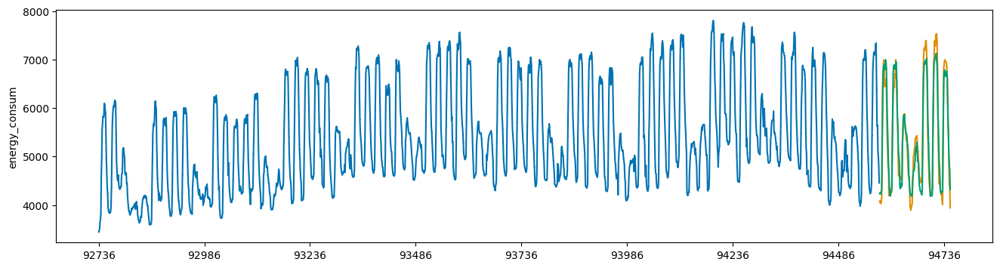

In [ ]:
lgbm_evaluation(train_ft_47, test_ft_47)

## 48

[LightGBM] [Info] Total Bins 2449
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 17
[LightGBM] [Info] Start training from score 1883.103702
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[100]	training's l2: 339.298	training's SMAPE: 0.192521	valid_1's l2: 2521.47	valid_1's SMAPE: 0.452355
SMAPE_SCORE : 0.45235467426228615
[LightGBM] [Info] Total Bins 2453
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 17
[LightGBM] [Info] Start training from score 1890.170358
[1.3096514260251744, 2.2476496439025735, 3.867108963861174, 1.3735781987920435, 1.3991205592290163, 0.8177117794102712, 1.9792006517139409, 1.2448133018942593, 1.06074043895381, 2.130121536415576, 0.767976278032088, 0.9413021321459566, 1.5262957051151953, 4.289723781334627, 0.7375486573168168, 1.4818223912210835, 1.5819307943304945, 1.7046454903992407, 1.95052729573744, 1.1616982747658

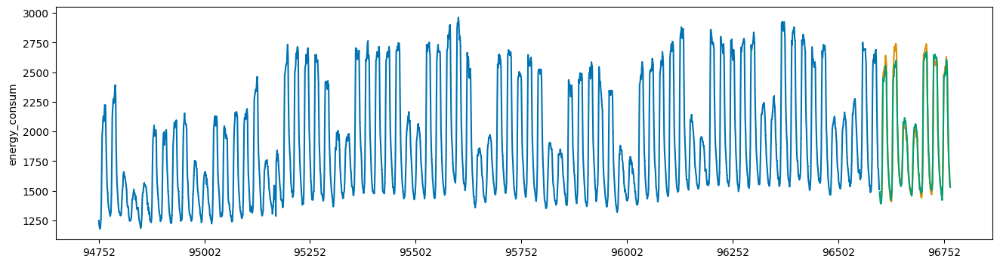

In [ ]:
lgbm_evaluation(train_ft_48, test_ft_48)

## 49

[LightGBM] [Info] Total Bins 2450
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 17
[LightGBM] [Info] Start training from score 3046.460846
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[70]	training's l2: 1193.75	training's SMAPE: 0.218259	valid_1's l2: 7051	valid_1's SMAPE: 0.5231
SMAPE_SCORE : 0.5231000990380688
[LightGBM] [Info] Total Bins 2454
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 17
[LightGBM] [Info] Start training from score 3063.804644
[1.3096514260251744, 2.2476496439025735, 3.867108963861174, 1.3735781987920435, 1.3991205592290163, 0.8177117794102712, 1.9792006517139409, 1.2448133018942593, 1.06074043895381, 2.130121536415576, 0.767976278032088, 0.9413021321459566, 1.5262957051151953, 4.289723781334627, 0.7375486573168168, 1.4818223912210835, 1.5819307943304945, 1.7046454903992407, 1.95052729573744, 1.1616982747658458, 1.

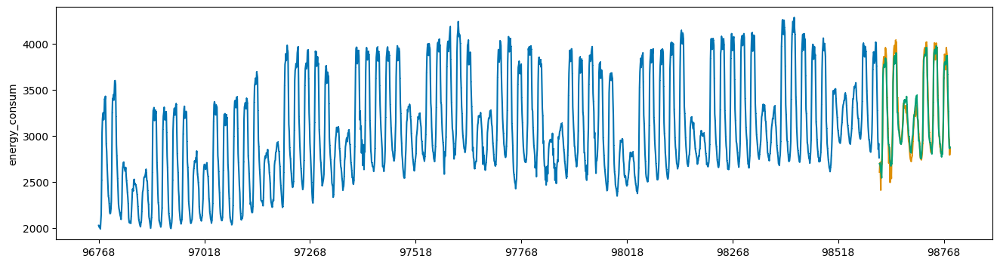

In [ ]:
lgbm_evaluation(train_ft_49, test_ft_49)

## 50

[LightGBM] [Info] Total Bins 2468
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 17
[LightGBM] [Info] Start training from score 3032.765745
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[60]	training's l2: 1369.58	training's SMAPE: 0.240073	valid_1's l2: 7074.89	valid_1's SMAPE: 0.537506
SMAPE_SCORE : 0.5375063246341879
[LightGBM] [Info] Total Bins 2469
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 17
[LightGBM] [Info] Start training from score 3039.537945
[1.3096514260251744, 2.2476496439025735, 3.867108963861174, 1.3735781987920435, 1.3991205592290163, 0.8177117794102712, 1.9792006517139409, 1.2448133018942593, 1.06074043895381, 2.130121536415576, 0.767976278032088, 0.9413021321459566, 1.5262957051151953, 4.289723781334627, 0.7375486573168168, 1.4818223912210835, 1.5819307943304945, 1.7046454903992407, 1.95052729573744, 1.161698274765845

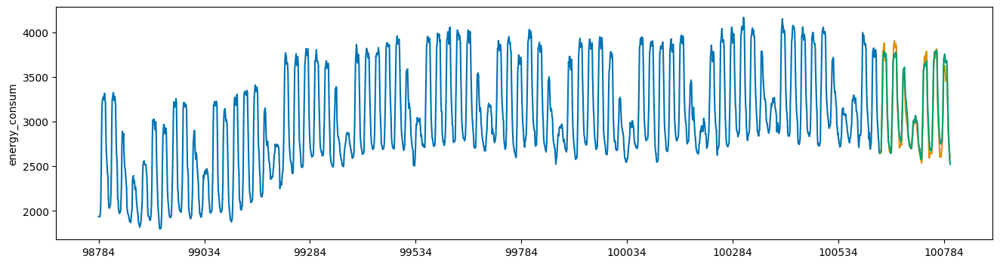

In [ ]:
lgbm_evaluation(train_ft_50, test_ft_50)

## 51

[LightGBM] [Info] Total Bins 2466
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 17
[LightGBM] [Info] Start training from score 2644.687694
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[40]	training's l2: 4027.68	training's SMAPE: 0.486175	valid_1's l2: 19311.6	valid_1's SMAPE: 0.935282
SMAPE_SCORE : 0.9352822124739667
[LightGBM] [Info] Total Bins 2467
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 17
[LightGBM] [Info] Start training from score 2649.473839
[1.3096514260251744, 2.2476496439025735, 3.867108963861174, 1.3735781987920435, 1.3991205592290163, 0.8177117794102712, 1.9792006517139409, 1.2448133018942593, 1.06074043895381, 2.130121536415576, 0.767976278032088, 0.9413021321459566, 1.5262957051151953, 4.289723781334627, 0.7375486573168168, 1.4818223912210835, 1.5819307943304945, 1.7046454903992407, 1.95052729573744, 1.161698274765845

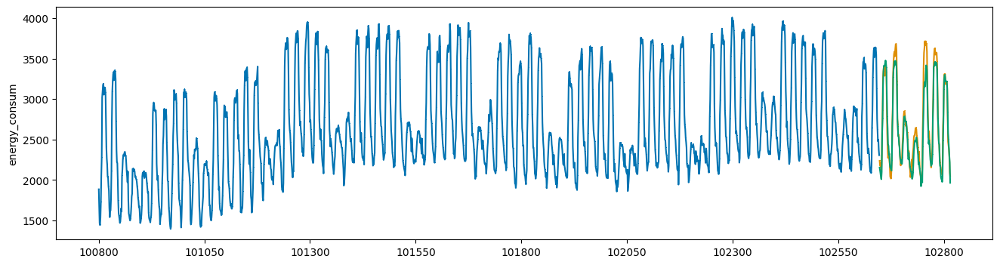

In [ ]:
lgbm_evaluation(train_ft_51, test_ft_51)

## 52

[LightGBM] [Info] Total Bins 2467
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 17
[LightGBM] [Info] Start training from score 2104.479707
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[48]	training's l2: 2819.15	training's SMAPE: 0.49702	valid_1's l2: 9256.98	valid_1's SMAPE: 0.763516
SMAPE_SCORE : 0.7635156917200063
[LightGBM] [Info] Total Bins 2469
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 17
[LightGBM] [Info] Start training from score 2117.802232
[1.3096514260251744, 2.2476496439025735, 3.867108963861174, 1.3735781987920435, 1.3991205592290163, 0.8177117794102712, 1.9792006517139409, 1.2448133018942593, 1.06074043895381, 2.130121536415576, 0.767976278032088, 0.9413021321459566, 1.5262957051151953, 4.289723781334627, 0.7375486573168168, 1.4818223912210835, 1.5819307943304945, 1.7046454903992407, 1.95052729573744, 1.1616982747658458

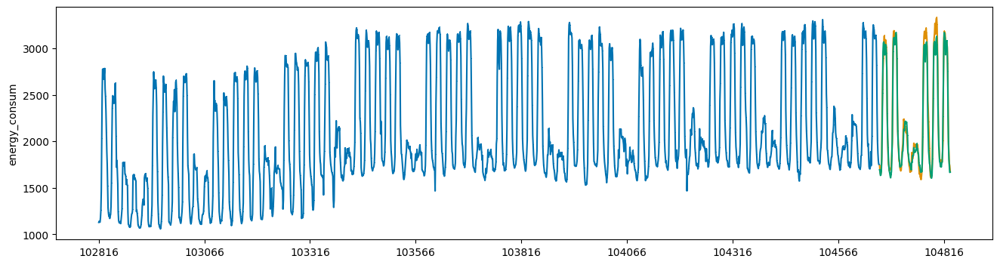

In [ ]:
lgbm_evaluation(train_ft_52, test_ft_52)

## 53

[LightGBM] [Info] Total Bins 2465
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 17
[LightGBM] [Info] Start training from score 2013.000649
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[29]	training's l2: 21107.1	training's SMAPE: 1.93989	valid_1's l2: 35114.9	valid_1's SMAPE: 2.44307
SMAPE_SCORE : 2.443066094079484
[LightGBM] [Info] Total Bins 2467
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 17
[LightGBM] [Info] Start training from score 2019.136071
[1.3096514260251744, 2.2476496439025735, 3.867108963861174, 1.3735781987920435, 1.3991205592290163, 0.8177117794102712, 1.9792006517139409, 1.2448133018942593, 1.06074043895381, 2.130121536415576, 0.767976278032088, 0.9413021321459566, 1.5262957051151953, 4.289723781334627, 0.7375486573168168, 1.4818223912210835, 1.5819307943304945, 1.7046454903992407, 1.95052729573744, 1.1616982747658458, 

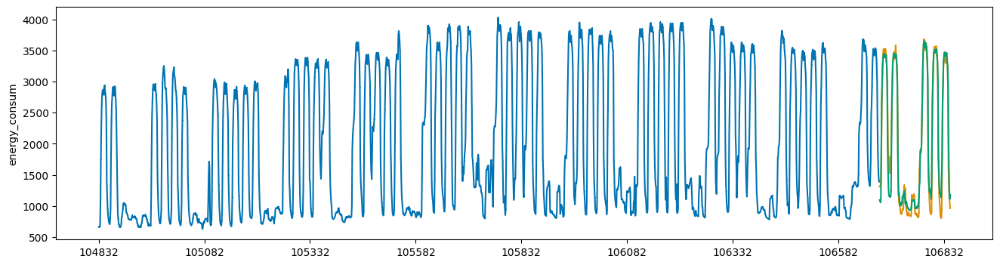

In [ ]:
lgbm_evaluation(train_ft_53, test_ft_53)

## 54

[LightGBM] [Info] Total Bins 2462
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 17
[LightGBM] [Info] Start training from score 1809.974514
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[12]	training's l2: 127365	training's SMAPE: 6.21821	valid_1's l2: 780524	valid_1's SMAPE: 8.84128
SMAPE_SCORE : 8.841281112839924
[LightGBM] [Info] Total Bins 2464
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 17
[LightGBM] [Info] Start training from score 1826.438483
[1.3096514260251744, 2.2476496439025735, 3.867108963861174, 1.3735781987920435, 1.3991205592290163, 0.8177117794102712, 1.9792006517139409, 1.2448133018942593, 1.06074043895381, 2.130121536415576, 0.767976278032088, 0.9413021321459566, 1.5262957051151953, 4.289723781334627, 0.7375486573168168, 1.4818223912210835, 1.5819307943304945, 1.7046454903992407, 1.95052729573744, 1.1616982747658458, 1.

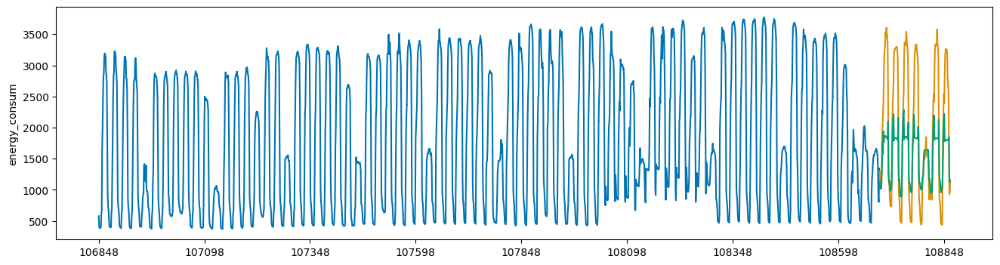

In [ ]:
lgbm_evaluation(train_ft_54, test_ft_54)

## 55

[LightGBM] [Info] Total Bins 2444
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 17
[LightGBM] [Info] Start training from score 1009.629157
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[84]	training's l2: 46.1682	training's SMAPE: 0.130055	valid_1's l2: 494.177	valid_1's SMAPE: 0.389092
SMAPE_SCORE : 0.3890918822431282
[LightGBM] [Info] Total Bins 2449
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 17
[LightGBM] [Info] Start training from score 1010.339048
[1.3096514260251744, 2.2476496439025735, 3.867108963861174, 1.3735781987920435, 1.3991205592290163, 0.8177117794102712, 1.9792006517139409, 1.2448133018942593, 1.06074043895381, 2.130121536415576, 0.767976278032088, 0.9413021321459566, 1.5262957051151953, 4.289723781334627, 0.7375486573168168, 1.4818223912210835, 1.5819307943304945, 1.7046454903992407, 1.95052729573744, 1.161698274765845

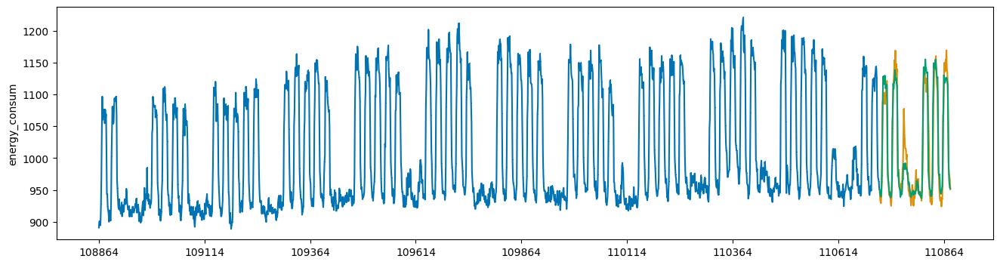

In [ ]:
lgbm_evaluation(train_ft_55, test_ft_55)

## 56

[LightGBM] [Info] Total Bins 2467
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 17
[LightGBM] [Info] Start training from score 4173.144935
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[29]	training's l2: 1710.48	training's SMAPE: 0.130629	valid_1's l2: 1607.03	valid_1's SMAPE: 0.203237
SMAPE_SCORE : 0.20323738472385966
[LightGBM] [Info] Total Bins 2467
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 17
[LightGBM] [Info] Start training from score 4172.646607
[1.3096514260251744, 2.2476496439025735, 3.867108963861174, 1.3735781987920435, 1.3991205592290163, 0.8177117794102712, 1.9792006517139409, 1.2448133018942593, 1.06074043895381, 2.130121536415576, 0.767976278032088, 0.9413021321459566, 1.5262957051151953, 4.289723781334627, 0.7375486573168168, 1.4818223912210835, 1.5819307943304945, 1.7046454903992407, 1.95052729573744, 1.16169827476584

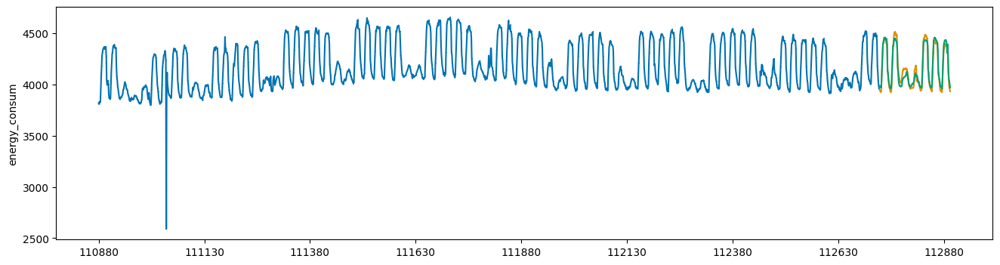

In [ ]:
lgbm_evaluation(train_ft_56, test_ft_56)

## 57

[LightGBM] [Info] Total Bins 2465
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 17
[LightGBM] [Info] Start training from score 1905.730810
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[38]	training's l2: 5995.7	training's SMAPE: 0.952068	valid_1's l2: 11938	valid_1's SMAPE: 1.23042
SMAPE_SCORE : 1.2304167523919263
[LightGBM] [Info] Total Bins 2467
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 17
[LightGBM] [Info] Start training from score 1912.423302
[1.3096514260251744, 2.2476496439025735, 3.867108963861174, 1.3735781987920435, 1.3991205592290163, 0.8177117794102712, 1.9792006517139409, 1.2448133018942593, 1.06074043895381, 2.130121536415576, 0.767976278032088, 0.9413021321459566, 1.5262957051151953, 4.289723781334627, 0.7375486573168168, 1.4818223912210835, 1.5819307943304945, 1.7046454903992407, 1.95052729573744, 1.1616982747658458, 1

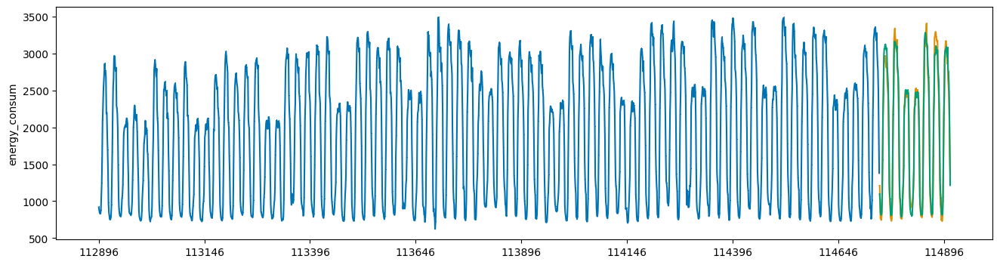

In [ ]:
lgbm_evaluation(train_ft_57, test_ft_57)

## 58

[LightGBM] [Info] Total Bins 2458
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 17
[LightGBM] [Info] Start training from score 2881.721557
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[37]	training's l2: 173.31	training's SMAPE: 0.0796706	valid_1's l2: 201.625	valid_1's SMAPE: 0.100707
SMAPE_SCORE : 0.10070735836464778
[LightGBM] [Info] Total Bins 2461
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 17
[LightGBM] [Info] Start training from score 2883.900236
[1.3096514260251744, 2.2476496439025735, 3.867108963861174, 1.3735781987920435, 1.3991205592290163, 0.8177117794102712, 1.9792006517139409, 1.2448133018942593, 1.06074043895381, 2.130121536415576, 0.767976278032088, 0.9413021321459566, 1.5262957051151953, 4.289723781334627, 0.7375486573168168, 1.4818223912210835, 1.5819307943304945, 1.7046454903992407, 1.95052729573744, 1.16169827476584

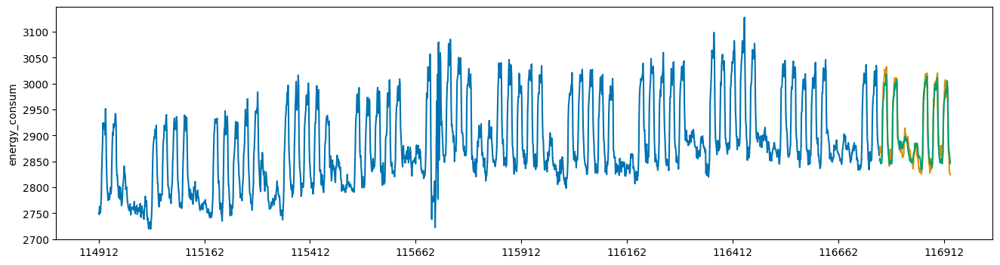

In [ ]:
lgbm_evaluation(train_ft_58, test_ft_58)

## 59

[LightGBM] [Info] Total Bins 2465
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 17
[LightGBM] [Info] Start training from score 1664.450941
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[46]	training's l2: 6473.28	training's SMAPE: 0.904234	valid_1's l2: 14942.7	valid_1's SMAPE: 1.03233
SMAPE_SCORE : 1.0323318698266137
[LightGBM] [Info] Total Bins 2467
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 17
[LightGBM] [Info] Start training from score 1668.882411
[1.3096514260251744, 2.2476496439025735, 3.867108963861174, 1.3735781987920435, 1.3991205592290163, 0.8177117794102712, 1.9792006517139409, 1.2448133018942593, 1.06074043895381, 2.130121536415576, 0.767976278032088, 0.9413021321459566, 1.5262957051151953, 4.289723781334627, 0.7375486573168168, 1.4818223912210835, 1.5819307943304945, 1.7046454903992407, 1.95052729573744, 1.1616982747658458

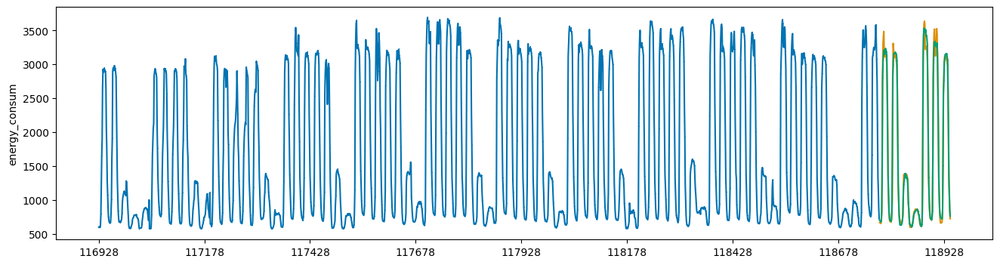

In [ ]:
lgbm_evaluation(train_ft_59, test_ft_59)

## 60

[LightGBM] [Info] Total Bins 2467
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 17
[LightGBM] [Info] Start training from score 2945.192987
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[31]	training's l2: 15520.3	training's SMAPE: 0.891603	valid_1's l2: 58854.6	valid_1's SMAPE: 1.38773
SMAPE_SCORE : 1.3877301907730273
[LightGBM] [Info] Total Bins 2469
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 17
[LightGBM] [Info] Start training from score 2952.853333
[1.3096514260251744, 2.2476496439025735, 3.867108963861174, 1.3735781987920435, 1.3991205592290163, 0.8177117794102712, 1.9792006517139409, 1.2448133018942593, 1.06074043895381, 2.130121536415576, 0.767976278032088, 0.9413021321459566, 1.5262957051151953, 4.289723781334627, 0.7375486573168168, 1.4818223912210835, 1.5819307943304945, 1.7046454903992407, 1.95052729573744, 1.1616982747658458

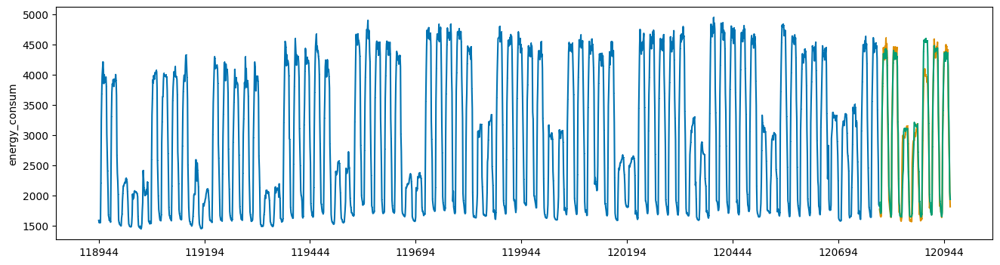

In [ ]:
lgbm_evaluation(train_ft_60, test_ft_60)

## 61

[LightGBM] [Info] Total Bins 2465
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 17
[LightGBM] [Info] Start training from score 3114.364284
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[44]	training's l2: 9630.57	training's SMAPE: 0.570809	valid_1's l2: 33651.6	valid_1's SMAPE: 0.98081
SMAPE_SCORE : 0.9808097632413397
[LightGBM] [Info] Total Bins 2467
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 17
[LightGBM] [Info] Start training from score 3119.994283
[1.3096514260251744, 2.2476496439025735, 3.867108963861174, 1.3735781987920435, 1.3991205592290163, 0.8177117794102712, 1.9792006517139409, 1.2448133018942593, 1.06074043895381, 2.130121536415576, 0.767976278032088, 0.9413021321459566, 1.5262957051151953, 4.289723781334627, 0.7375486573168168, 1.4818223912210835, 1.5819307943304945, 1.7046454903992407, 1.95052729573744, 1.1616982747658458

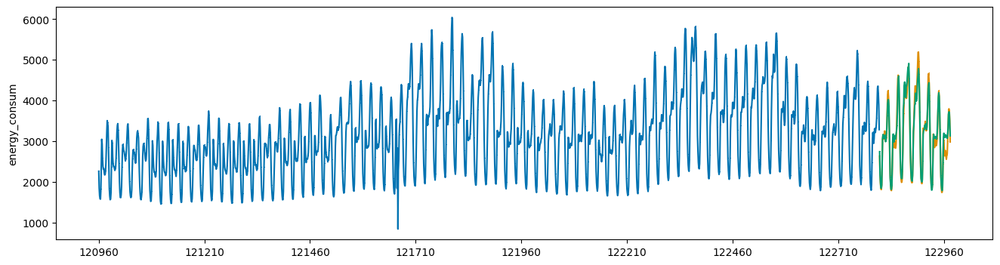

In [ ]:
lgbm_evaluation(train_ft_61, test_ft_61)

## 62

[LightGBM] [Info] Total Bins 2465
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 17
[LightGBM] [Info] Start training from score 1148.152014
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[54]	training's l2: 795.439	training's SMAPE: 0.475125	valid_1's l2: 6235.87	valid_1's SMAPE: 1.20708
SMAPE_SCORE : 1.2070778100111534
[LightGBM] [Info] Total Bins 2467
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 17
[LightGBM] [Info] Start training from score 1150.902054
[1.3096514260251744, 2.2476496439025735, 3.867108963861174, 1.3735781987920435, 1.3991205592290163, 0.8177117794102712, 1.9792006517139409, 1.2448133018942593, 1.06074043895381, 2.130121536415576, 0.767976278032088, 0.9413021321459566, 1.5262957051151953, 4.289723781334627, 0.7375486573168168, 1.4818223912210835, 1.5819307943304945, 1.7046454903992407, 1.95052729573744, 1.1616982747658458

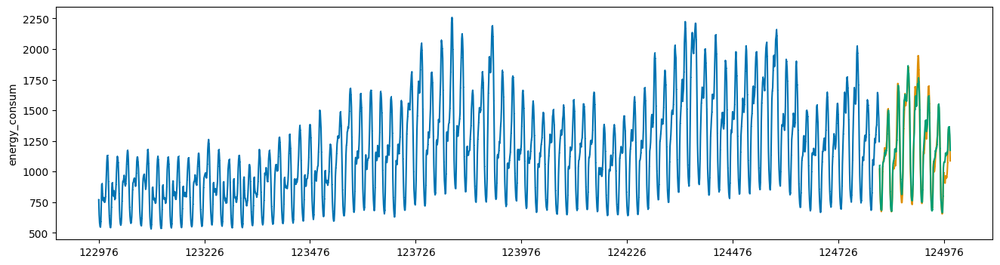

In [ ]:
lgbm_evaluation(train_ft_62, test_ft_62)

## 63

[LightGBM] [Info] Total Bins 2468
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 17
[LightGBM] [Info] Start training from score 755.362792
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[64]	training's l2: 334.819	training's SMAPE: 0.937142	valid_1's l2: 2311.01	valid_1's SMAPE: 2.40745
SMAPE_SCORE : 2.4074517882375885
[LightGBM] [Info] Total Bins 2470
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 17
[LightGBM] [Info] Start training from score 755.476875
[2.6193028520503487, 4.495299287805147, 7.734217927722348, 2.747156397584087, 2.7982411184580327, 1.6354235588205424, 3.9584013034278818, 2.4896266037885186, 2.12148087790762, 4.260243072831152, 1.535952556064176, 1.8826042642919132, 3.0525914102303906, 8.579447562669253, 1.4750973146336337, 2.963644782442167, 3.163861588660989, 3.4092909807984815, 3.90105459147488, 2.3233965495316915, 3.38

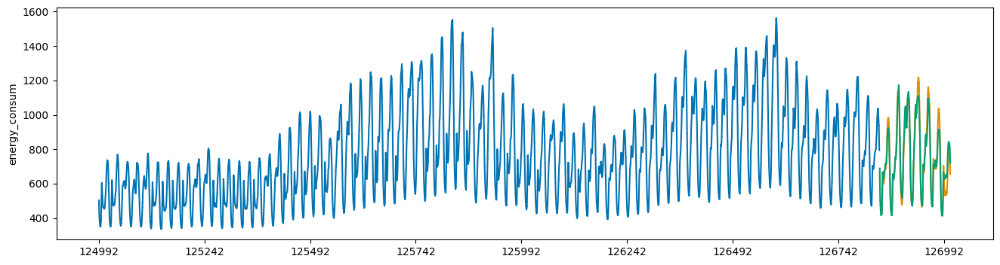

In [ ]:
lgbm_evaluation(train_ft_63, test_ft_63)

## 64

[LightGBM] [Info] Total Bins 2463
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 17
[LightGBM] [Info] Start training from score 1183.853474
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[55]	training's l2: 572.069	training's SMAPE: 0.7682	valid_1's l2: 5004.09	valid_1's SMAPE: 2.11495
SMAPE_SCORE : 2.1149488164852754
[LightGBM] [Info] Total Bins 2465
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 17
[LightGBM] [Info] Start training from score 1186.642947
[2.6193028520503487, 4.495299287805147, 7.734217927722348, 2.747156397584087, 2.7982411184580327, 1.6354235588205424, 3.9584013034278818, 2.4896266037885186, 2.12148087790762, 4.260243072831152, 1.535952556064176, 1.8826042642919132, 3.0525914102303906, 8.579447562669253, 1.4750973146336337, 2.963644782442167, 3.163861588660989, 3.4092909807984815, 3.90105459147488, 2.3233965495316915, 3.38

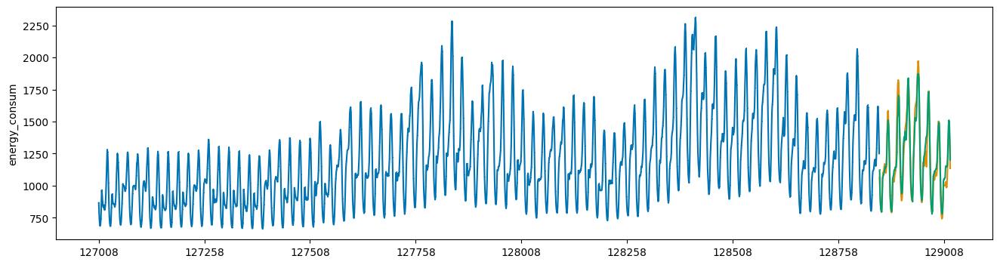

In [ ]:
lgbm_evaluation(train_ft_64, test_ft_64)

## 65

[LightGBM] [Info] Total Bins 2448
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 17
[LightGBM] [Info] Start training from score 569.951786
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[70]	training's l2: 825.878	training's SMAPE: 0.891563	valid_1's l2: 7688.08	valid_1's SMAPE: 2.28429
SMAPE_SCORE : 2.2842896620189626
[LightGBM] [Info] Total Bins 2453
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 17
[LightGBM] [Info] Start training from score 577.095179
[1.3096514260251744, 2.2476496439025735, 3.867108963861174, 1.3735781987920435, 1.3991205592290163, 0.8177117794102712, 1.9792006517139409, 1.2448133018942593, 1.06074043895381, 2.130121536415576, 0.767976278032088, 0.9413021321459566, 1.5262957051151953, 4.289723781334627, 0.7375486573168168, 1.4818223912210835, 1.5819307943304945, 1.7046454903992407, 1.95052729573744, 1.1616982747658458, 

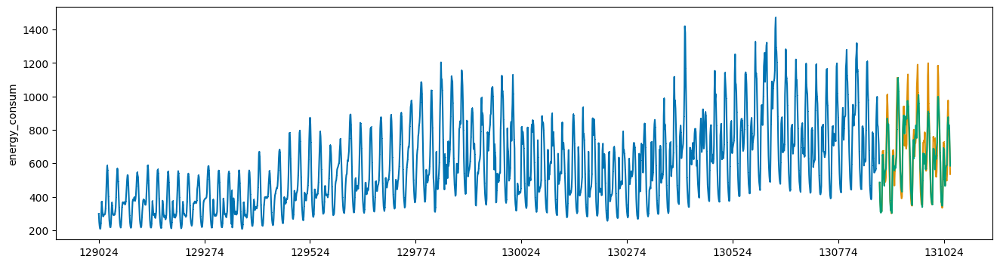

In [ ]:
lgbm_evaluation(train_ft_65, test_ft_65)

## 66

[LightGBM] [Info] Total Bins 2470
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 17
[LightGBM] [Info] Start training from score 397.512273
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[99]	training's l2: 28.472	training's SMAPE: 0.26147	valid_1's l2: 264.033	valid_1's SMAPE: 0.811979
SMAPE_SCORE : 0.811978823648031
[LightGBM] [Info] Total Bins 2471
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 17
[LightGBM] [Info] Start training from score 398.520714
[1.3096514260251744, 2.2476496439025735, 3.867108963861174, 1.3735781987920435, 1.3991205592290163, 0.8177117794102712, 1.9792006517139409, 1.2448133018942593, 1.06074043895381, 2.130121536415576, 0.767976278032088, 0.9413021321459566, 1.5262957051151953, 4.289723781334627, 0.7375486573168168, 1.4818223912210835, 1.5819307943304945, 1.7046454903992407, 1.95052729573744, 1.1616982747658458, 1.

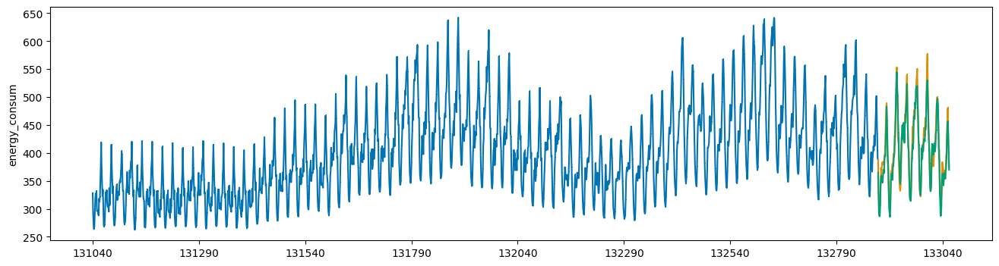

In [ ]:
lgbm_evaluation(train_ft_66, test_ft_66)

## 67

[LightGBM] [Info] Total Bins 2459
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 17
[LightGBM] [Info] Start training from score 1286.403052
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[29]	training's l2: 2223.98	training's SMAPE: 0.70833	valid_1's l2: 8399.04	valid_1's SMAPE: 1.54365
SMAPE_SCORE : 1.5436501596331824
[LightGBM] [Info] Total Bins 2463
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 17
[LightGBM] [Info] Start training from score 1283.149464
[1.3096514260251744, 2.2476496439025735, 3.867108963861174, 1.3735781987920435, 1.3991205592290163, 0.8177117794102712, 1.9792006517139409, 1.2448133018942593, 1.06074043895381, 2.130121536415576, 0.767976278032088, 0.9413021321459566, 1.5262957051151953, 4.289723781334627, 0.7375486573168168, 1.4818223912210835, 1.5819307943304945, 1.7046454903992407, 1.95052729573744, 1.1616982747658458,

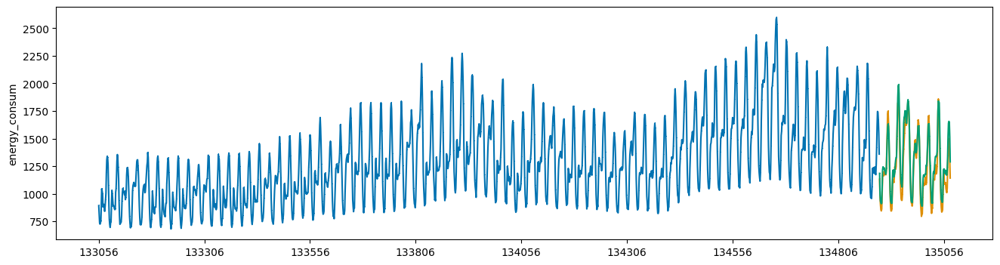

In [ ]:
lgbm_evaluation(train_ft_67, test_ft_67)

## 68

[LightGBM] [Info] Total Bins 2465
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 17
[LightGBM] [Info] Start training from score 2026.578084
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[88]	training's l2: 952.114	training's SMAPE: 0.293595	valid_1's l2: 14133.3	valid_1's SMAPE: 1.03247
SMAPE_SCORE : 1.0324666074936824
[LightGBM] [Info] Total Bins 2467
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 17
[LightGBM] [Info] Start training from score 2028.030803
[1.3096514260251744, 2.2476496439025735, 3.867108963861174, 1.3735781987920435, 1.3991205592290163, 0.8177117794102712, 1.9792006517139409, 1.2448133018942593, 1.06074043895381, 2.130121536415576, 0.767976278032088, 0.9413021321459566, 1.5262957051151953, 4.289723781334627, 0.7375486573168168, 1.4818223912210835, 1.5819307943304945, 1.7046454903992407, 1.95052729573744, 1.1616982747658458

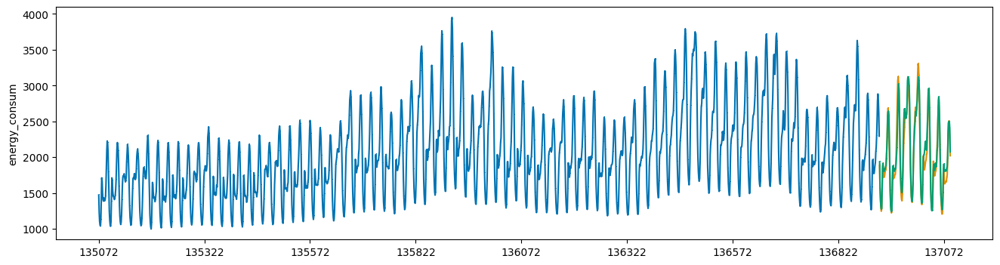

In [ ]:
lgbm_evaluation(train_ft_68, test_ft_68)

## 69

[LightGBM] [Info] Total Bins 2465
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 17
[LightGBM] [Info] Start training from score 4497.610064
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[38]	training's l2: 12225.3	training's SMAPE: 0.376932	valid_1's l2: 30799.4	valid_1's SMAPE: 0.701276
SMAPE_SCORE : 0.7012760891907749
[LightGBM] [Info] Total Bins 2467
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 17
[LightGBM] [Info] Start training from score 4505.322172
[1.3096514260251744, 2.2476496439025735, 3.867108963861174, 1.3735781987920435, 1.3991205592290163, 0.8177117794102712, 1.9792006517139409, 1.2448133018942593, 1.06074043895381, 2.130121536415576, 0.767976278032088, 0.9413021321459566, 1.5262957051151953, 4.289723781334627, 0.7375486573168168, 1.4818223912210835, 1.5819307943304945, 1.7046454903992407, 1.95052729573744, 1.161698274765845

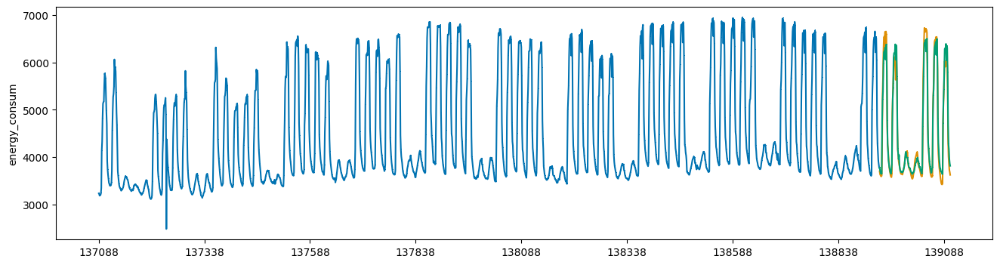

In [ ]:
lgbm_evaluation(train_ft_69, test_ft_69)

## 70

[LightGBM] [Info] Total Bins 2468
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 17
[LightGBM] [Info] Start training from score 4284.730983
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[56]	training's l2: 9926.23	training's SMAPE: 0.844802	valid_1's l2: 22948.6	valid_1's SMAPE: 1.1243
SMAPE_SCORE : 1.1242955696833408
[LightGBM] [Info] Total Bins 2470
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 17
[LightGBM] [Info] Start training from score 4303.824794
[2.6193028520503487, 4.495299287805147, 7.734217927722348, 2.747156397584087, 2.7982411184580327, 1.6354235588205424, 3.9584013034278818, 2.4896266037885186, 2.12148087790762, 4.260243072831152, 1.535952556064176, 1.8826042642919132, 3.0525914102303906, 8.579447562669253, 1.4750973146336337, 2.963644782442167, 3.163861588660989, 3.4092909807984815, 3.90105459147488, 2.3233965495316915, 3.3

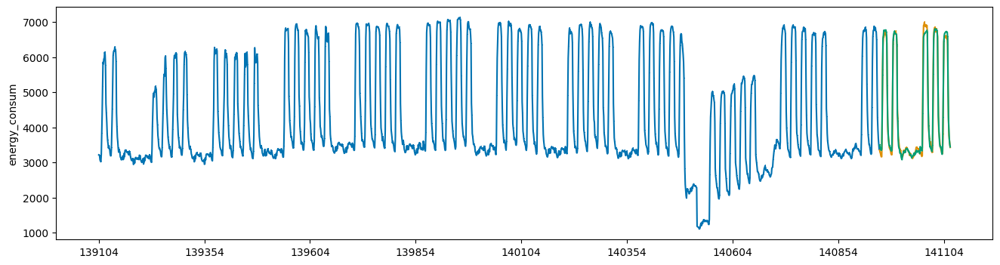

In [ ]:
lgbm_evaluation(train_ft_70, test_ft_70)

## 71

[LightGBM] [Info] Total Bins 2468
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 17
[LightGBM] [Info] Start training from score 2140.239353
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[28]	training's l2: 11150.4	training's SMAPE: 1.55291	valid_1's l2: 23627.9	valid_1's SMAPE: 2.10343
SMAPE_SCORE : 2.1034250010881186
[LightGBM] [Info] Total Bins 2470
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 17
[LightGBM] [Info] Start training from score 2150.689288
[2.6193028520503487, 4.495299287805147, 7.734217927722348, 2.747156397584087, 2.7982411184580327, 1.6354235588205424, 3.9584013034278818, 2.4896266037885186, 2.12148087790762, 4.260243072831152, 1.535952556064176, 1.8826042642919132, 3.0525914102303906, 8.579447562669253, 1.4750973146336337, 2.963644782442167, 3.163861588660989, 3.4092909807984815, 3.90105459147488, 2.3233965495316915, 3.3

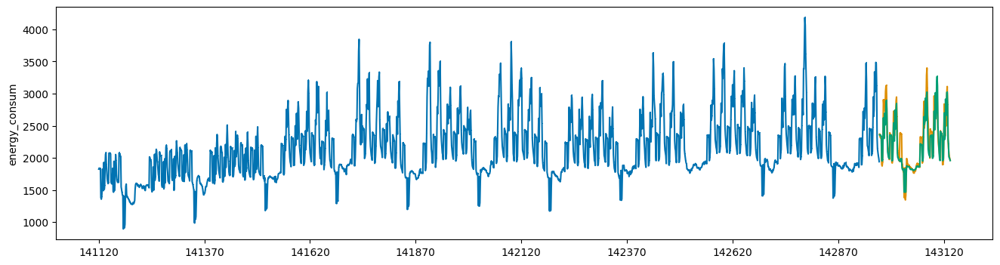

In [ ]:
lgbm_evaluation(train_ft_71, test_ft_71)

## 72

[LightGBM] [Info] Total Bins 2448
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 17
[LightGBM] [Info] Start training from score 1272.046657
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[34]	training's l2: 729.462	training's SMAPE: 0.771581	valid_1's l2: 10629.8	valid_1's SMAPE: 3.37434
SMAPE_SCORE : 3.374340685062186
[LightGBM] [Info] Total Bins 2453
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 17
[LightGBM] [Info] Start training from score 1281.908305
[2.6193028520503487, 4.495299287805147, 7.734217927722348, 2.747156397584087, 2.7982411184580327, 1.6354235588205424, 3.9584013034278818, 2.4896266037885186, 2.12148087790762, 4.260243072831152, 1.535952556064176, 1.8826042642919132, 3.0525914102303906, 8.579447562669253, 1.4750973146336337, 2.963644782442167, 3.163861588660989, 3.4092909807984815, 3.90105459147488, 2.3233965495316915, 3.3

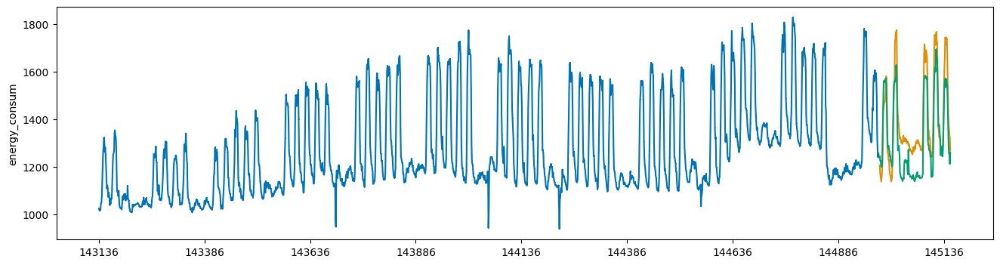

In [ ]:
lgbm_evaluation(train_ft_72, test_ft_72)

## 73

[LightGBM] [Info] Total Bins 2463
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 17
[LightGBM] [Info] Start training from score 3628.169088
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[33]	training's l2: 6435.09	training's SMAPE: 0.876758	valid_1's l2: 18448.2	valid_1's SMAPE: 1.45813
SMAPE_SCORE : 1.4581265657233258
[LightGBM] [Info] Total Bins 2466
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 17
[LightGBM] [Info] Start training from score 3641.660950
[2.6193028520503487, 4.495299287805147, 7.734217927722348, 2.747156397584087, 2.7982411184580327, 1.6354235588205424, 3.9584013034278818, 2.4896266037885186, 2.12148087790762, 4.260243072831152, 1.535952556064176, 1.8826042642919132, 3.0525914102303906, 8.579447562669253, 1.4750973146336337, 2.963644782442167, 3.163861588660989, 3.4092909807984815, 3.90105459147488, 2.3233965495316915, 3.

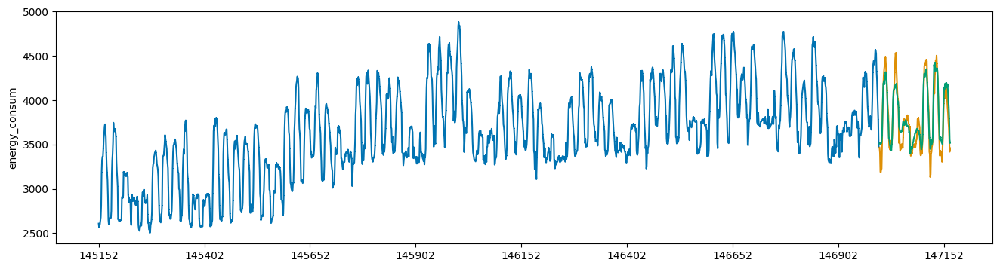

In [ ]:
lgbm_evaluation(train_ft_73, test_ft_73)

## 74

[LightGBM] [Info] Total Bins 2465
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 17
[LightGBM] [Info] Start training from score 4023.035461
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[32]	training's l2: 33925.9	training's SMAPE: 1.73335	valid_1's l2: 165778	valid_1's SMAPE: 2.7277
SMAPE_SCORE : 2.727695833181253
[LightGBM] [Info] Total Bins 2467
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 17
[LightGBM] [Info] Start training from score 4047.360720
[2.6193028520503487, 4.495299287805147, 7.734217927722348, 2.747156397584087, 2.7982411184580327, 1.6354235588205424, 3.9584013034278818, 2.4896266037885186, 2.12148087790762, 4.260243072831152, 1.535952556064176, 1.8826042642919132, 3.0525914102303906, 8.579447562669253, 1.4750973146336337, 2.963644782442167, 3.163861588660989, 3.4092909807984815, 3.90105459147488, 2.3233965495316915, 3.3898

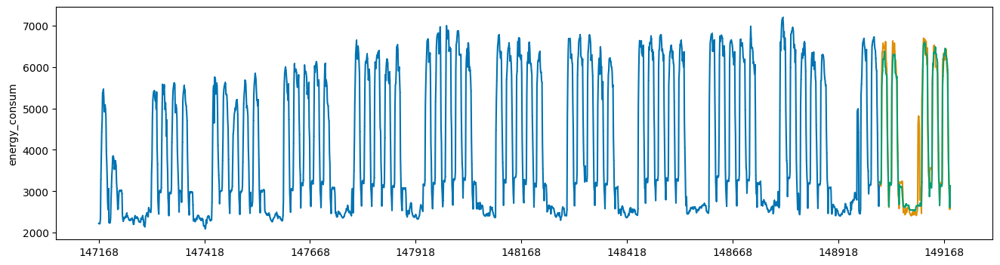

In [ ]:
lgbm_evaluation(train_ft_74, test_ft_74)

## 75

[LightGBM] [Info] Total Bins 2467
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 17
[LightGBM] [Info] Start training from score 1406.505649
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[22]	training's l2: 11497.7	training's SMAPE: 2.73255	valid_1's l2: 5884.45	valid_1's SMAPE: 1.88399
SMAPE_SCORE : 1.8839868573135798
[LightGBM] [Info] Total Bins 2468
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 17
[LightGBM] [Info] Start training from score 1410.518511
[2.6193028520503487, 4.495299287805147, 7.734217927722348, 2.747156397584087, 2.7982411184580327, 1.6354235588205424, 3.9584013034278818, 2.4896266037885186, 2.12148087790762, 4.260243072831152, 1.535952556064176, 1.8826042642919132, 3.0525914102303906, 8.579447562669253, 1.4750973146336337, 2.963644782442167, 3.163861588660989, 3.4092909807984815, 3.90105459147488, 2.3233965495316915, 3.3

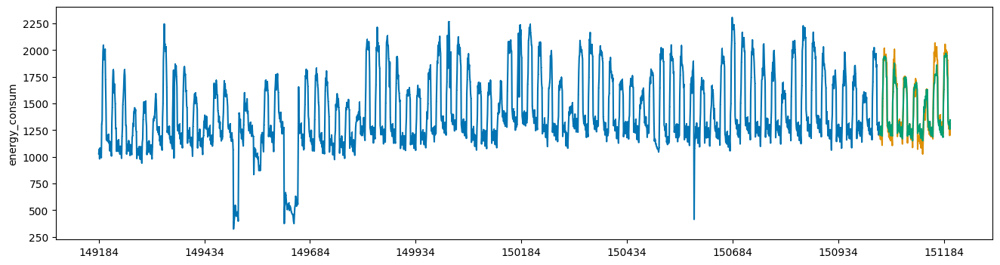

In [ ]:
lgbm_evaluation(train_ft_75, test_ft_75)

## 76

[LightGBM] [Info] Total Bins 2468
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 17
[LightGBM] [Info] Start training from score 1198.982339
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[15]	training's l2: 4810.5	training's SMAPE: 2.29004	valid_1's l2: 3633.03	valid_1's SMAPE: 1.9133
SMAPE_SCORE : 1.9133008494556367
[LightGBM] [Info] Total Bins 2470
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 17
[LightGBM] [Info] Start training from score 1204.154019
[2.6193028520503487, 4.495299287805147, 7.734217927722348, 2.747156397584087, 2.7982411184580327, 1.6354235588205424, 3.9584013034278818, 2.4896266037885186, 2.12148087790762, 4.260243072831152, 1.535952556064176, 1.8826042642919132, 3.0525914102303906, 8.579447562669253, 1.4750973146336337, 2.963644782442167, 3.163861588660989, 3.4092909807984815, 3.90105459147488, 2.3233965495316915, 3.389

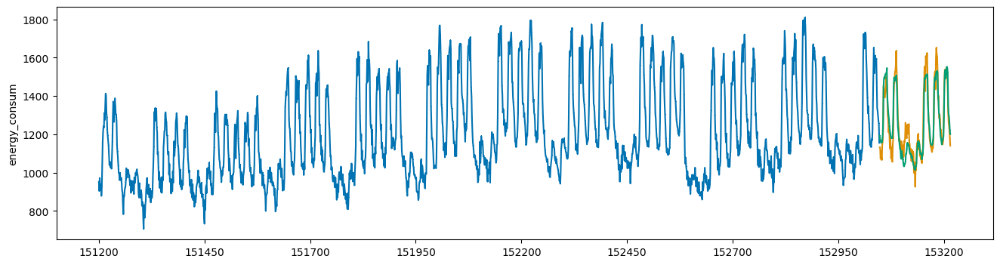

In [ ]:
lgbm_evaluation(train_ft_76, test_ft_76)

## 77

[LightGBM] [Info] Total Bins 2463
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 17
[LightGBM] [Info] Start training from score 1486.338508
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[49]	training's l2: 1244.03	training's SMAPE: 0.908041	valid_1's l2: 1588.37	valid_1's SMAPE: 1.13603
SMAPE_SCORE : 1.1360295830694565
[LightGBM] [Info] Total Bins 2466
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 17
[LightGBM] [Info] Start training from score 1490.198573
[2.6193028520503487, 4.495299287805147, 7.734217927722348, 2.747156397584087, 2.7982411184580327, 1.6354235588205424, 3.9584013034278818, 2.4896266037885186, 2.12148087790762, 4.260243072831152, 1.535952556064176, 1.8826042642919132, 3.0525914102303906, 8.579447562669253, 1.4750973146336337, 2.963644782442167, 3.163861588660989, 3.4092909807984815, 3.90105459147488, 2.3233965495316915, 3.

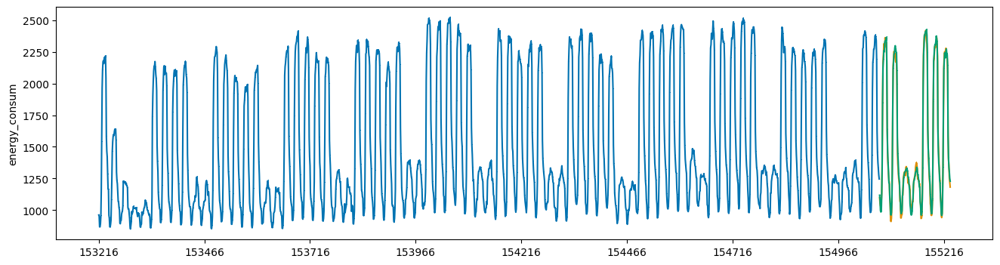

In [ ]:
lgbm_evaluation(train_ft_77, test_ft_77)

## 78

[LightGBM] [Info] Total Bins 2462
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 17
[LightGBM] [Info] Start training from score 1648.529479
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[96]	training's l2: 401.227	training's SMAPE: 0.236313	valid_1's l2: 5477.37	valid_1's SMAPE: 0.856283
SMAPE_SCORE : 0.8562825561392792
[LightGBM] [Info] Total Bins 2465
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 17
[LightGBM] [Info] Start training from score 1657.119165
[1.3096514260251744, 2.2476496439025735, 3.867108963861174, 1.3735781987920435, 1.3991205592290163, 0.8177117794102712, 1.9792006517139409, 1.2448133018942593, 1.06074043895381, 2.130121536415576, 0.767976278032088, 0.9413021321459566, 1.5262957051151953, 4.289723781334627, 0.7375486573168168, 1.4818223912210835, 1.5819307943304945, 1.7046454903992407, 1.95052729573744, 1.161698274765845

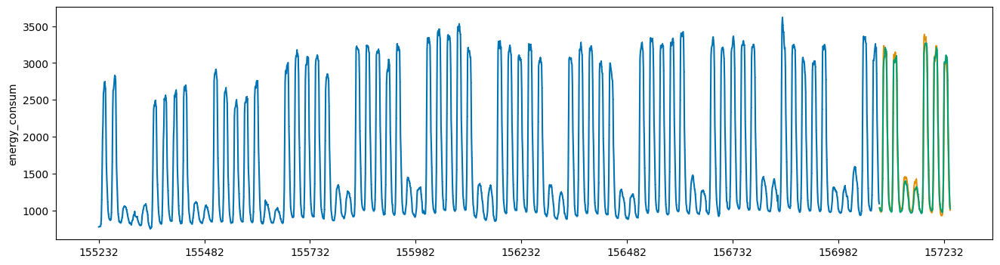

In [ ]:
lgbm_evaluation(train_ft_78, test_ft_78)

## 79

[LightGBM] [Info] Total Bins 2463
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 17
[LightGBM] [Info] Start training from score 2894.813893
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[33]	training's l2: 5319.18	training's SMAPE: 0.501516	valid_1's l2: 11041	valid_1's SMAPE: 0.707129
SMAPE_SCORE : 0.7071287558665832
[LightGBM] [Info] Total Bins 2465
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 17
[LightGBM] [Info] Start training from score 2903.851069
[1.3096514260251744, 2.2476496439025735, 3.867108963861174, 1.3735781987920435, 1.3991205592290163, 0.8177117794102712, 1.9792006517139409, 1.2448133018942593, 1.06074043895381, 2.130121536415576, 0.767976278032088, 0.9413021321459566, 1.5262957051151953, 4.289723781334627, 0.7375486573168168, 1.4818223912210835, 1.5819307943304945, 1.7046454903992407, 1.95052729573744, 1.1616982747658458,

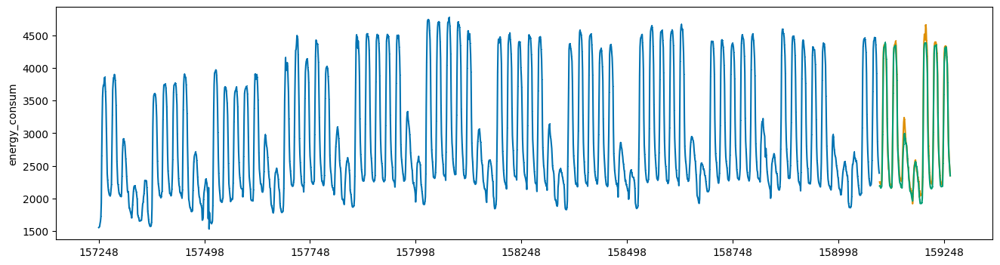

In [ ]:
lgbm_evaluation(train_ft_79, test_ft_79)

## 80

[LightGBM] [Info] Total Bins 2464
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 17
[LightGBM] [Info] Start training from score 2551.878115
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[53]	training's l2: 4298.49	training's SMAPE: 1.00951	valid_1's l2: 18716.8	valid_1's SMAPE: 1.60867
SMAPE_SCORE : 1.60867151557451
[LightGBM] [Info] Total Bins 2466
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 17
[LightGBM] [Info] Start training from score 2570.756605
[2.6193028520503487, 4.495299287805147, 7.734217927722348, 2.747156397584087, 2.7982411184580327, 1.6354235588205424, 3.9584013034278818, 2.4896266037885186, 2.12148087790762, 4.260243072831152, 1.535952556064176, 1.8826042642919132, 3.0525914102303906, 8.579447562669253, 1.4750973146336337, 2.963644782442167, 3.163861588660989, 3.4092909807984815, 3.90105459147488, 2.3233965495316915, 3.389

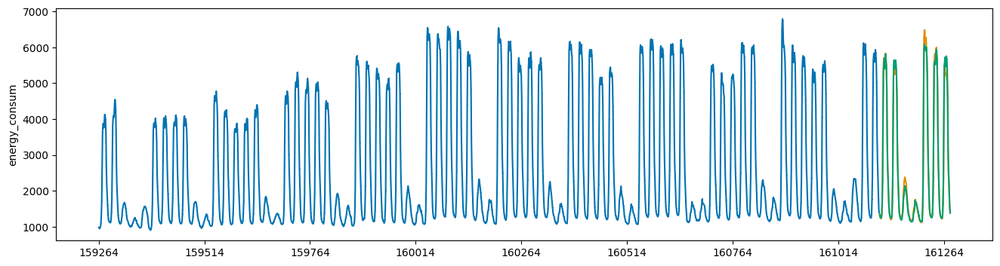

In [ ]:
lgbm_evaluation(train_ft_80, test_ft_80)

## 81

[LightGBM] [Info] Total Bins 2463
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 16
[LightGBM] [Info] Start training from score 1443.027466
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[64]	training's l2: 1603.84	training's SMAPE: 1.06707	valid_1's l2: 4367.49	valid_1's SMAPE: 1.56298
SMAPE_SCORE : 1.5629780173608165
[LightGBM] [Info] Total Bins 2465
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 16
[LightGBM] [Info] Start training from score 1448.854463
[2.6193028520503487, 4.495299287805147, 7.734217927722348, 2.747156397584087, 2.7982411184580327, 1.6354235588205424, 3.9584013034278818, 2.4896266037885186, 2.12148087790762, 4.260243072831152, 1.535952556064176, 1.8826042642919132, 3.0525914102303906, 8.579447562669253, 1.4750973146336337, 2.963644782442167, 3.163861588660989, 3.4092909807984815, 3.90105459147488, 2.3233965495316915, 3.3

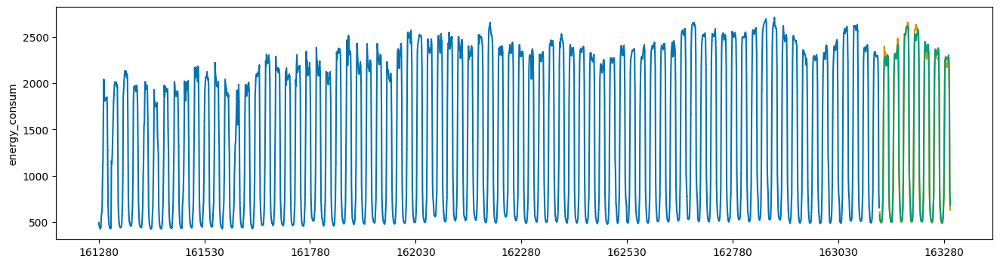

In [ ]:
lgbm_evaluation(train_ft_81, test_ft_81)

## 82

[LightGBM] [Info] Total Bins 2464
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 17
[LightGBM] [Info] Start training from score 2284.939869
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[59]	training's l2: 3900.61	training's SMAPE: 1.06606	valid_1's l2: 37782	valid_1's SMAPE: 2.48481
SMAPE_SCORE : 2.484809190743788
[LightGBM] [Info] Total Bins 2467
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 17
[LightGBM] [Info] Start training from score 2299.541071
[2.6193028520503487, 4.495299287805147, 7.734217927722348, 2.747156397584087, 2.7982411184580327, 1.6354235588205424, 3.9584013034278818, 2.4896266037885186, 2.12148087790762, 4.260243072831152, 1.535952556064176, 1.8826042642919132, 3.0525914102303906, 8.579447562669253, 1.4750973146336337, 2.963644782442167, 3.163861588660989, 3.4092909807984815, 3.90105459147488, 2.3233965495316915, 3.3898

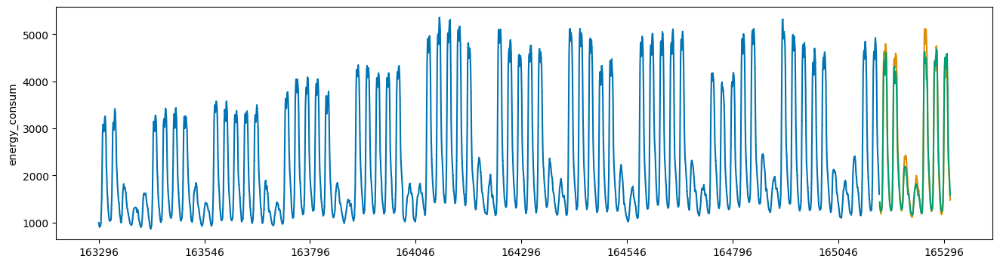

In [ ]:
lgbm_evaluation(train_ft_82, test_ft_82)

## 83

[LightGBM] [Info] Total Bins 2463
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 17
[LightGBM] [Info] Start training from score 1445.917371
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[42]	training's l2: 1924.79	training's SMAPE: 1.14815	valid_1's l2: 5665.76	valid_1's SMAPE: 1.22959
SMAPE_SCORE : 1.229590777850613
[LightGBM] [Info] Total Bins 2466
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 17
[LightGBM] [Info] Start training from score 1453.059971
[2.6193028520503487, 4.495299287805147, 7.734217927722348, 2.747156397584087, 2.7982411184580327, 1.6354235588205424, 3.9584013034278818, 2.4896266037885186, 2.12148087790762, 4.260243072831152, 1.535952556064176, 1.8826042642919132, 3.0525914102303906, 8.579447562669253, 1.4750973146336337, 2.963644782442167, 3.163861588660989, 3.4092909807984815, 3.90105459147488, 2.3233965495316915, 3.38

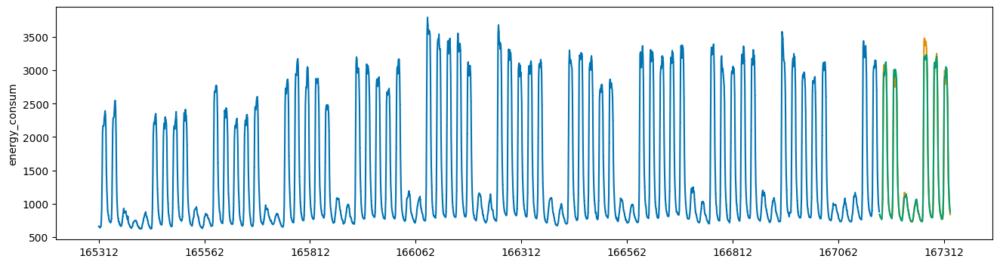

In [ ]:
lgbm_evaluation(train_ft_83, test_ft_83)

## 84

[LightGBM] [Info] Total Bins 2463
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 17
[LightGBM] [Info] Start training from score 1723.215585
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[36]	training's l2: 2454.8	training's SMAPE: 1.13079	valid_1's l2: 5079.61	valid_1's SMAPE: 1.27405
SMAPE_SCORE : 1.2740465598071817
[LightGBM] [Info] Total Bins 2466
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 17
[LightGBM] [Info] Start training from score 1729.795239
[2.6193028520503487, 4.495299287805147, 7.734217927722348, 2.747156397584087, 2.7982411184580327, 1.6354235588205424, 3.9584013034278818, 2.4896266037885186, 2.12148087790762, 4.260243072831152, 1.535952556064176, 1.8826042642919132, 3.0525914102303906, 8.579447562669253, 1.4750973146336337, 2.963644782442167, 3.163861588660989, 3.4092909807984815, 3.90105459147488, 2.3233965495316915, 3.38

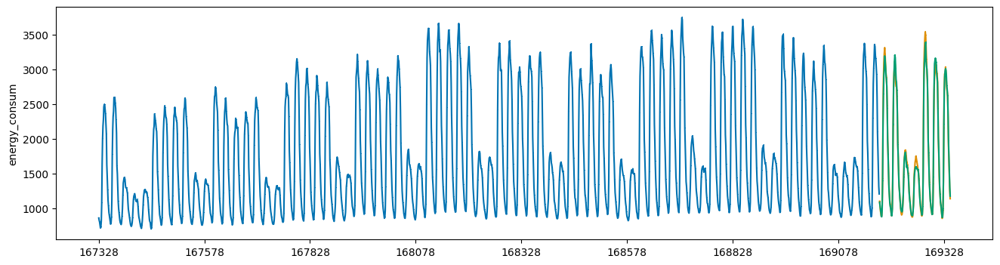

In [ ]:
lgbm_evaluation(train_ft_84, test_ft_84)

## 85

[LightGBM] [Info] Total Bins 2463
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 16
[LightGBM] [Info] Start training from score 2251.245778
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[93]	training's l2: 883.243	training's SMAPE: 0.509208	valid_1's l2: 8398.61	valid_1's SMAPE: 1.50885
SMAPE_SCORE : 1.5088490355740745
[LightGBM] [Info] Total Bins 2465
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 16
[LightGBM] [Info] Start training from score 2263.376605
[2.6193028520503487, 4.495299287805147, 7.734217927722348, 2.747156397584087, 2.7982411184580327, 1.6354235588205424, 3.9584013034278818, 2.4896266037885186, 2.12148087790762, 4.260243072831152, 1.535952556064176, 1.8826042642919132, 3.0525914102303906, 8.579447562669253, 1.4750973146336337, 2.963644782442167, 3.163861588660989, 3.4092909807984815, 3.90105459147488, 2.3233965495316915, 3.

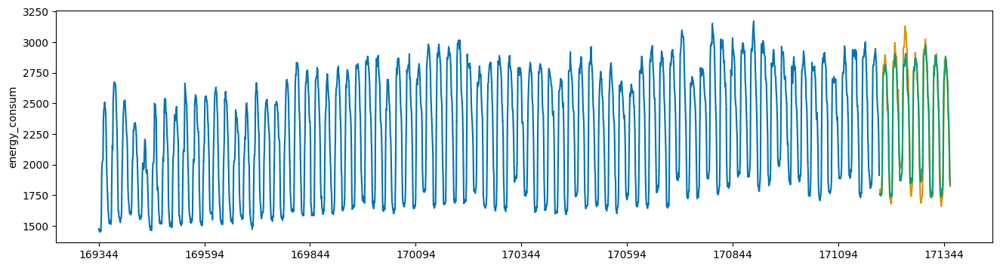

In [ ]:
lgbm_evaluation(train_ft_85, test_ft_85)

## 86

[LightGBM] [Info] Total Bins 2463
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 17
[LightGBM] [Info] Start training from score 1145.162532
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[57]	training's l2: 1129.47	training's SMAPE: 1.01648	valid_1's l2: 2835.92	valid_1's SMAPE: 1.83891
SMAPE_SCORE : 1.8389078698604093
[LightGBM] [Info] Total Bins 2466
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 17
[LightGBM] [Info] Start training from score 1150.644374
[2.6193028520503487, 4.495299287805147, 7.734217927722348, 2.747156397584087, 2.7982411184580327, 1.6354235588205424, 3.9584013034278818, 2.4896266037885186, 2.12148087790762, 4.260243072831152, 1.535952556064176, 1.8826042642919132, 3.0525914102303906, 8.579447562669253, 1.4750973146336337, 2.963644782442167, 3.163861588660989, 3.4092909807984815, 3.90105459147488, 2.3233965495316915, 3.3

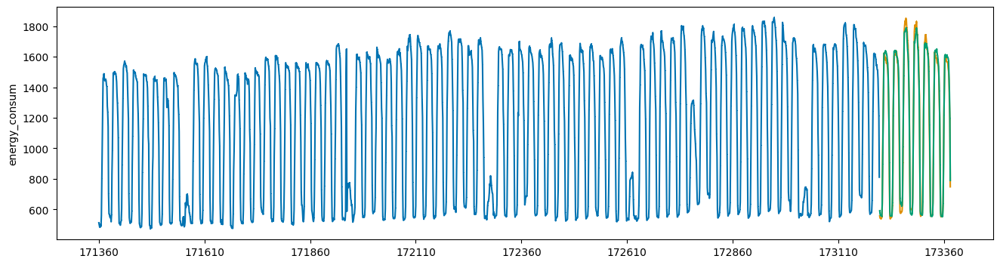

In [ ]:
lgbm_evaluation(train_ft_86, test_ft_86)

## 87

[LightGBM] [Info] Total Bins 2462
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 17
[LightGBM] [Info] Start training from score 1277.000407
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[24]	training's l2: 10160	training's SMAPE: 4.19474	valid_1's l2: 19167.3	valid_1's SMAPE: 4.28271
SMAPE_SCORE : 4.282708236280748
[LightGBM] [Info] Total Bins 2468
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 17
[LightGBM] [Info] Start training from score 1291.963527
[2.6193028520503487, 4.495299287805147, 7.734217927722348, 2.747156397584087, 2.7982411184580327, 1.6354235588205424, 3.9584013034278818, 2.4896266037885186, 2.12148087790762, 4.260243072831152, 1.535952556064176, 1.8826042642919132, 3.0525914102303906, 8.579447562669253, 1.4750973146336337, 2.963644782442167, 3.163861588660989, 3.4092909807984815, 3.90105459147488, 2.3233965495316915, 3.3898

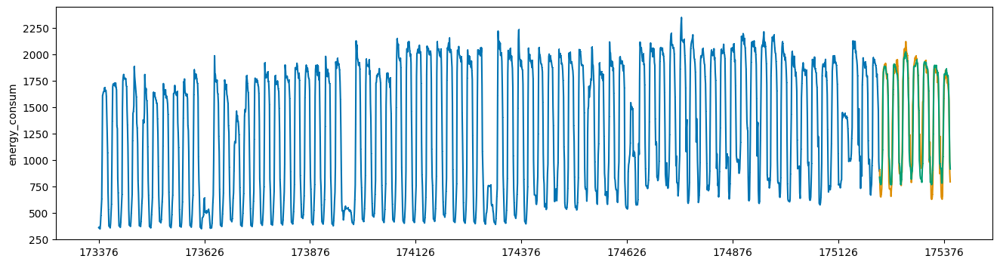

In [ ]:
lgbm_evaluation(train_ft_87, test_ft_87)

## 88

[LightGBM] [Info] Total Bins 2464
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 17
[LightGBM] [Info] Start training from score 1191.541706
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[100]	training's l2: 666.391	training's SMAPE: 0.832554	valid_1's l2: 3584.28	valid_1's SMAPE: 2.25471
SMAPE_SCORE : 2.254710347591923
[LightGBM] [Info] Total Bins 2467
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 17
[LightGBM] [Info] Start training from score 1196.471742
[2.6193028520503487, 4.495299287805147, 7.734217927722348, 2.747156397584087, 2.7982411184580327, 1.6354235588205424, 3.9584013034278818, 2.4896266037885186, 2.12148087790762, 4.260243072831152, 1.535952556064176, 1.8826042642919132, 3.0525914102303906, 8.579447562669253, 1.4750973146336337, 2.963644782442167, 3.163861588660989, 3.4092909807984815, 3.90105459147488, 2.3233965495316915, 3.

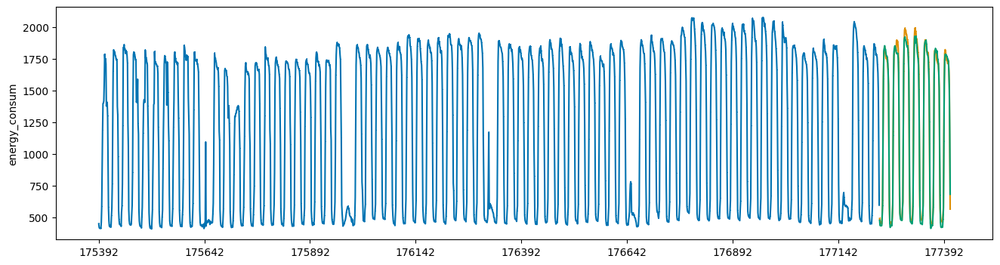

In [ ]:
lgbm_evaluation(train_ft_88, test_ft_88)

## 89

[LightGBM] [Info] Total Bins 2463
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 17
[LightGBM] [Info] Start training from score 1428.498830
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[92]	training's l2: 1212.34	training's SMAPE: 1.03554	valid_1's l2: 6374.44	valid_1's SMAPE: 1.94395
SMAPE_SCORE : 1.9439461385687555
[LightGBM] [Info] Total Bins 2465
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 17
[LightGBM] [Info] Start training from score 1436.786189
[2.6193028520503487, 4.495299287805147, 7.734217927722348, 2.747156397584087, 2.7982411184580327, 1.6354235588205424, 3.9584013034278818, 2.4896266037885186, 2.12148087790762, 4.260243072831152, 1.535952556064176, 1.8826042642919132, 3.0525914102303906, 8.579447562669253, 1.4750973146336337, 2.963644782442167, 3.163861588660989, 3.4092909807984815, 3.90105459147488, 2.3233965495316915, 3.3

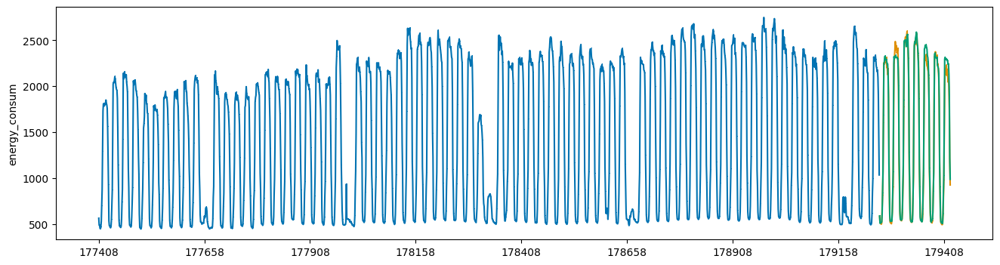

In [ ]:
lgbm_evaluation(train_ft_89, test_ft_89)

## 90

[LightGBM] [Info] Total Bins 2465
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 17
[LightGBM] [Info] Start training from score 1377.120911
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[32]	training's l2: 4894.79	training's SMAPE: 2.63862	valid_1's l2: 7372.09	valid_1's SMAPE: 2.86559
SMAPE_SCORE : 2.8655875672273385
[LightGBM] [Info] Total Bins 2466
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 17
[LightGBM] [Info] Start training from score 1388.329883
[2.6193028520503487, 4.495299287805147, 7.734217927722348, 2.747156397584087, 2.7982411184580327, 1.6354235588205424, 3.9584013034278818, 2.4896266037885186, 2.12148087790762, 4.260243072831152, 1.535952556064176, 1.8826042642919132, 3.0525914102303906, 8.579447562669253, 1.4750973146336337, 2.963644782442167, 3.163861588660989, 3.4092909807984815, 3.90105459147488, 2.3233965495316915, 3.3

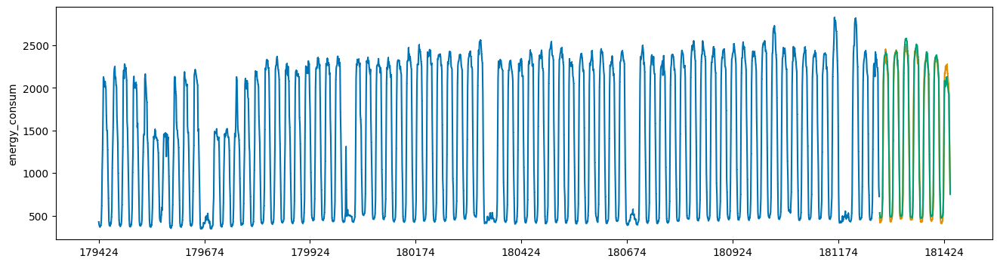

In [ ]:
lgbm_evaluation(train_ft_90, test_ft_90)

## 91

[LightGBM] [Info] Total Bins 2447
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 17
[LightGBM] [Info] Start training from score 1321.630648
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[31]	training's l2: 5908.59	training's SMAPE: 3.06901	valid_1's l2: 32184.2	valid_1's SMAPE: 5.98439
SMAPE_SCORE : 5.984385808513223
[LightGBM] [Info] Total Bins 2452
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 17
[LightGBM] [Info] Start training from score 1327.730832
[2.6193028520503487, 4.495299287805147, 7.734217927722348, 2.747156397584087, 2.7982411184580327, 1.6354235588205424, 3.9584013034278818, 2.4896266037885186, 2.12148087790762, 4.260243072831152, 1.535952556064176, 1.8826042642919132, 3.0525914102303906, 8.579447562669253, 1.4750973146336337, 2.963644782442167, 3.163861588660989, 3.4092909807984815, 3.90105459147488, 2.3233965495316915, 3.38

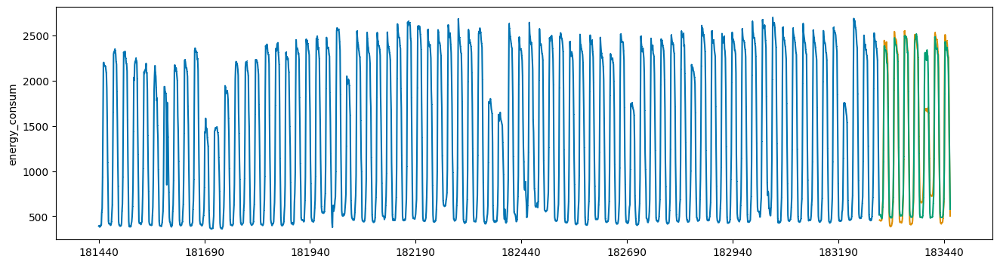

In [ ]:
lgbm_evaluation(train_ft_91, test_ft_91)

## 92

[LightGBM] [Info] Total Bins 2463
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 17
[LightGBM] [Info] Start training from score 1286.162631
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[99]	training's l2: 999.301	training's SMAPE: 0.970279	valid_1's l2: 4645.73	valid_1's SMAPE: 1.97461
SMAPE_SCORE : 1.9746131172817083
[LightGBM] [Info] Total Bins 2466
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 17
[LightGBM] [Info] Start training from score 1285.541965
[2.6193028520503487, 4.495299287805147, 7.734217927722348, 2.747156397584087, 2.7982411184580327, 1.6354235588205424, 3.9584013034278818, 2.4896266037885186, 2.12148087790762, 4.260243072831152, 1.535952556064176, 1.8826042642919132, 3.0525914102303906, 8.579447562669253, 1.4750973146336337, 2.963644782442167, 3.163861588660989, 3.4092909807984815, 3.90105459147488, 2.3233965495316915, 3.

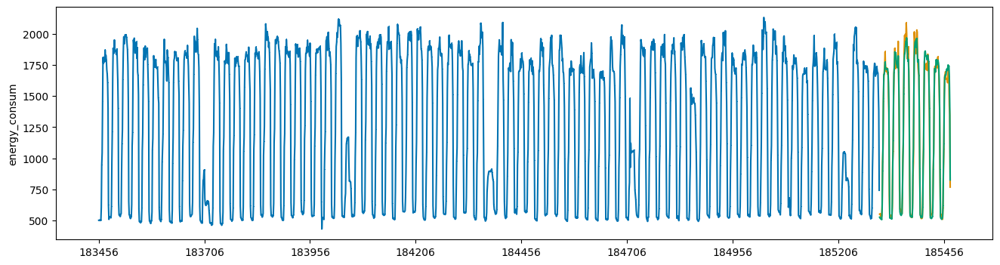

In [ ]:
lgbm_evaluation(train_ft_92, test_ft_92)

## 93

[LightGBM] [Info] Total Bins 2462
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 16
[LightGBM] [Info] Start training from score 1102.524740
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[69]	training's l2: 594.242	training's SMAPE: 0.899271	valid_1's l2: 6856.72	valid_1's SMAPE: 2.95195
SMAPE_SCORE : 2.951948432569998
[LightGBM] [Info] Total Bins 2464
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 16
[LightGBM] [Info] Start training from score 1108.170893
[2.6193028520503487, 4.495299287805147, 7.734217927722348, 2.747156397584087, 2.7982411184580327, 1.6354235588205424, 3.9584013034278818, 2.4896266037885186, 2.12148087790762, 4.260243072831152, 1.535952556064176, 1.8826042642919132, 3.0525914102303906, 8.579447562669253, 1.4750973146336337, 2.963644782442167, 3.163861588660989, 3.4092909807984815, 3.90105459147488, 2.3233965495316915, 3.3

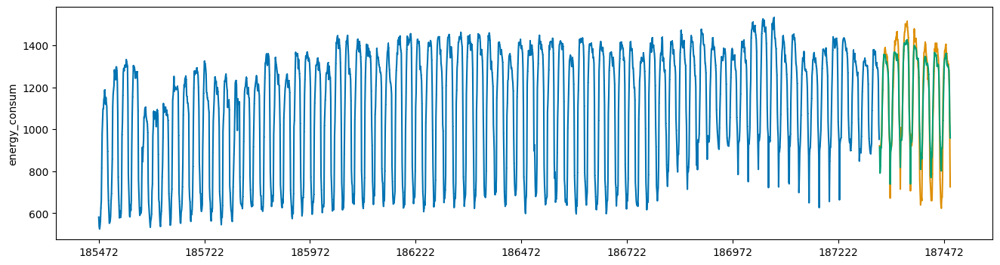

In [ ]:
lgbm_evaluation(train_ft_93, test_ft_93)

## 94

[LightGBM] [Info] Total Bins 2463
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 16
[LightGBM] [Info] Start training from score 2449.506882
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[86]	training's l2: 4122.4	training's SMAPE: 1.08056	valid_1's l2: 47041.3	valid_1's SMAPE: 3.4272
SMAPE_SCORE : 3.4271972611980597
[LightGBM] [Info] Total Bins 2465
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 16
[LightGBM] [Info] Start training from score 2465.009523
[2.6193028520503487, 4.495299287805147, 7.734217927722348, 2.747156397584087, 2.7982411184580327, 1.6354235588205424, 3.9584013034278818, 2.4896266037885186, 2.12148087790762, 4.260243072831152, 1.535952556064176, 1.8826042642919132, 3.0525914102303906, 8.579447562669253, 1.4750973146336337, 2.963644782442167, 3.163861588660989, 3.4092909807984815, 3.90105459147488, 2.3233965495316915, 3.389

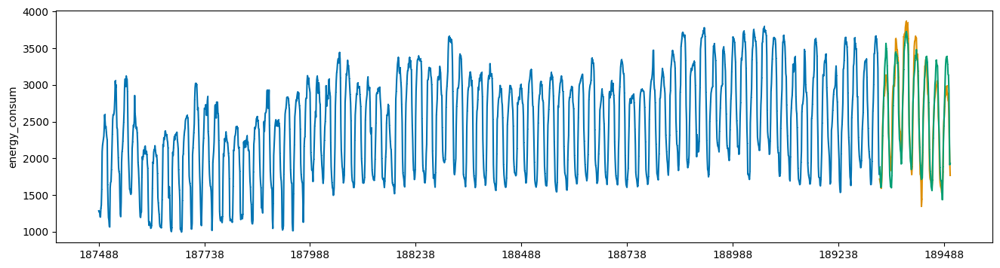

In [ ]:
lgbm_evaluation(train_ft_94, test_ft_94)

## 95

[LightGBM] [Info] Total Bins 2459
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 16
[LightGBM] [Info] Start training from score 1112.910681
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[43]	training's l2: 13689.6	training's SMAPE: 4.38978	valid_1's l2: 40576.3	valid_1's SMAPE: 7.82889
SMAPE_SCORE : 7.828890787629447
[LightGBM] [Info] Total Bins 2464
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 16
[LightGBM] [Info] Start training from score 1113.724910
[2.6193028520503487, 4.495299287805147, 7.734217927722348, 2.747156397584087, 2.7982411184580327, 1.6354235588205424, 3.9584013034278818, 2.4896266037885186, 2.12148087790762, 4.260243072831152, 1.535952556064176, 1.8826042642919132, 3.0525914102303906, 8.579447562669253, 1.4750973146336337, 2.963644782442167, 3.163861588660989, 3.4092909807984815, 3.90105459147488, 2.3233965495316915, 3.38

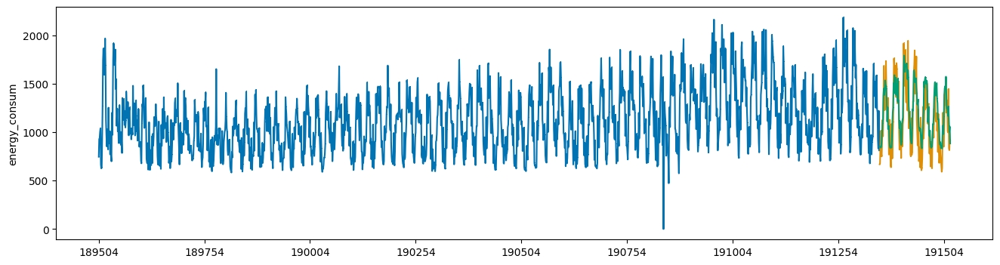

In [ ]:
lgbm_evaluation(train_ft_95, test_ft_95)

## 96

[LightGBM] [Info] Total Bins 2457
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 16
[LightGBM] [Info] Start training from score 2804.841137
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[67]	training's l2: 2931.77	training's SMAPE: 0.780764	valid_1's l2: 19328	valid_1's SMAPE: 1.8037
SMAPE_SCORE : 1.8037029867283543
[LightGBM] [Info] Total Bins 2461
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 16
[LightGBM] [Info] Start training from score 2815.258244
[2.6193028520503487, 4.495299287805147, 7.734217927722348, 2.747156397584087, 2.7982411184580327, 1.6354235588205424, 3.9584013034278818, 2.4896266037885186, 2.12148087790762, 4.260243072831152, 1.535952556064176, 1.8826042642919132, 3.0525914102303906, 8.579447562669253, 1.4750973146336337, 2.963644782442167, 3.163861588660989, 3.4092909807984815, 3.90105459147488, 2.3233965495316915, 3.389

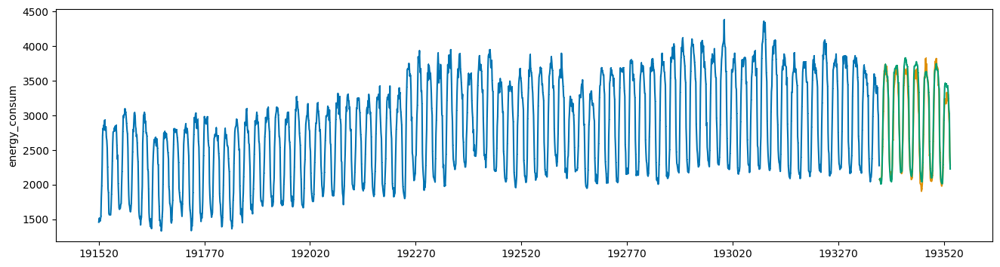

In [ ]:
lgbm_evaluation(train_ft_96, test_ft_96)

## 97

[LightGBM] [Info] Total Bins 2466
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 16
[LightGBM] [Info] Start training from score 1227.729253
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[36]	training's l2: 2199.2	training's SMAPE: 1.58974	valid_1's l2: 10493.9	valid_1's SMAPE: 2.80159
SMAPE_SCORE : 2.801590420740339
[LightGBM] [Info] Total Bins 2468
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 16
[LightGBM] [Info] Start training from score 1240.199910
[2.6193028520503487, 4.495299287805147, 7.734217927722348, 2.747156397584087, 2.7982411184580327, 1.6354235588205424, 3.9584013034278818, 2.4896266037885186, 2.12148087790762, 4.260243072831152, 1.535952556064176, 1.8826042642919132, 3.0525914102303906, 8.579447562669253, 1.4750973146336337, 2.963644782442167, 3.163861588660989, 3.4092909807984815, 3.90105459147488, 2.3233965495316915, 3.389

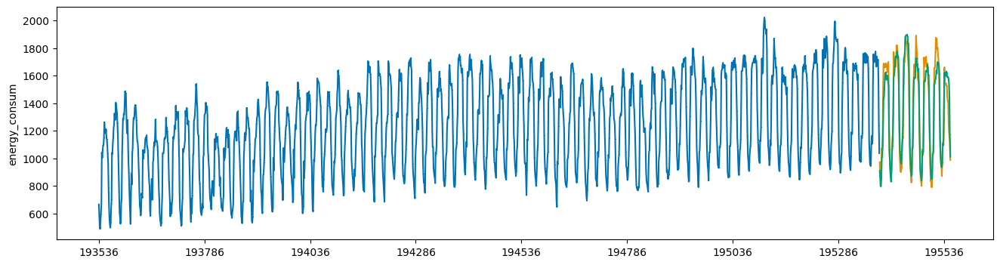

In [ ]:
lgbm_evaluation(train_ft_97, test_ft_97)

## 98

[LightGBM] [Info] Total Bins 2464
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 16
[LightGBM] [Info] Start training from score 1136.092402
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[91]	training's l2: 1851.79	training's SMAPE: 1.59146	valid_1's l2: 27903.3	valid_1's SMAPE: 6.30162
SMAPE_SCORE : 6.301622708169094
[LightGBM] [Info] Total Bins 2465
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 16
[LightGBM] [Info] Start training from score 1138.321696
[2.6193028520503487, 4.495299287805147, 7.734217927722348, 2.747156397584087, 2.7982411184580327, 1.6354235588205424, 3.9584013034278818, 2.4896266037885186, 2.12148087790762, 4.260243072831152, 1.535952556064176, 1.8826042642919132, 3.0525914102303906, 8.579447562669253, 1.4750973146336337, 2.963644782442167, 3.163861588660989, 3.4092909807984815, 3.90105459147488, 2.3233965495316915, 3.38

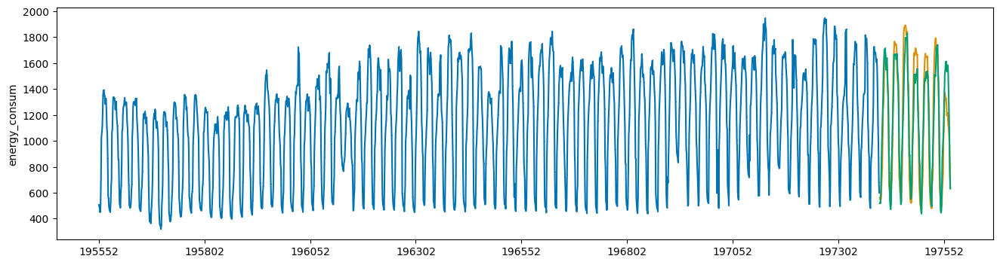

In [ ]:
lgbm_evaluation(train_ft_98, test_ft_98)

## 99

[LightGBM] [Info] Total Bins 2459
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 16
[LightGBM] [Info] Start training from score 1161.630877
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[42]	training's l2: 850.257	training's SMAPE: 1.02677	valid_1's l2: 3133.44	valid_1's SMAPE: 1.798
SMAPE_SCORE : 1.7979956108061534
[LightGBM] [Info] Total Bins 2465
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 16
[LightGBM] [Info] Start training from score 1162.119196
[2.6193028520503487, 4.495299287805147, 7.734217927722348, 2.747156397584087, 2.7982411184580327, 1.6354235588205424, 3.9584013034278818, 2.4896266037885186, 2.12148087790762, 4.260243072831152, 1.535952556064176, 1.8826042642919132, 3.0525914102303906, 8.579447562669253, 1.4750973146336337, 2.963644782442167, 3.163861588660989, 3.4092909807984815, 3.90105459147488, 2.3233965495316915, 3.389

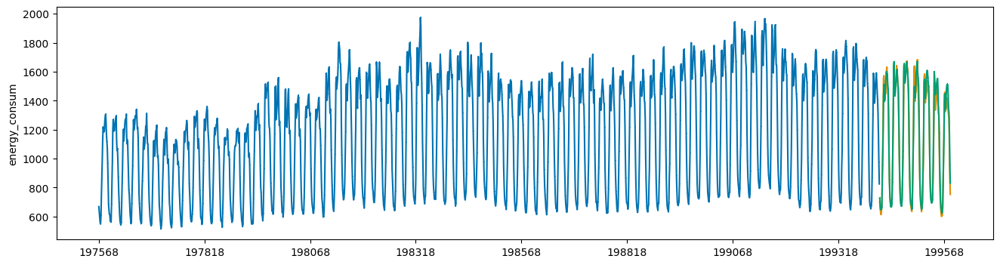

In [ ]:
lgbm_evaluation(train_ft_99, test_ft_99)

## 100

[LightGBM] [Info] Total Bins 2461
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 16
[LightGBM] [Info] Start training from score 822.422209
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[98]	training's l2: 536.075	training's SMAPE: 1.11306	valid_1's l2: 3161.4	valid_1's SMAPE: 2.39387
SMAPE_SCORE : 2.3938702266586445
[LightGBM] [Info] Total Bins 2464
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 16
[LightGBM] [Info] Start training from score 826.264167
[2.6193028520503487, 4.495299287805147, 7.734217927722348, 2.747156397584087, 2.7982411184580327, 1.6354235588205424, 3.9584013034278818, 2.4896266037885186, 2.12148087790762, 4.260243072831152, 1.535952556064176, 1.8826042642919132, 3.0525914102303906, 8.579447562669253, 1.4750973146336337, 2.963644782442167, 3.163861588660989, 3.4092909807984815, 3.90105459147488, 2.3233965495316915, 3.3898

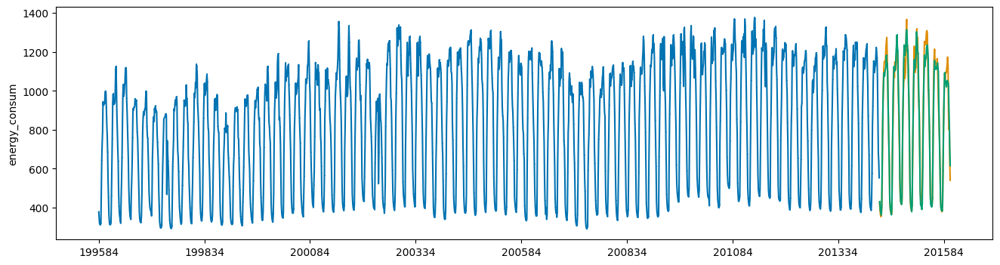

In [ ]:
lgbm_evaluation(train_ft_100, test_ft_100)

# 제출

In [ ]:
# submission = pd.read_csv(f"{DATA_PATH}sample_submission.csv")

In [ ]:
len(lgbm_preds)

16800

In [ ]:
train_ft.columns

Index(['energy_consum', 'building_num', 'date_time', 'temp', 'precip', 'wind',
       'hum', 'building_type', 'time', 'day', 'month', 'week', 'day_of_year',
       'sin_time', 'cos_time', 'temp_RM', 'wind_RM', 'hum_RM', 'temp_EMA',
       'wind_EMA', 'hum_EMA', 'THI', 'feels_temp', 'CDH', 'hour_mean',
       'day_hour_mean', 'hour_std', 'heat_index', 'heat_wave',
       'periodic_avg_power_change_rate', 'periodic_avg_power_change_rate_6'],
      dtype='object')

In [ ]:
submission.iloc[:, 1] = lgbm_preds

In [ ]:
submission.to_csv(f"{DATA_PATH}submission_powerchange1.csv", index=False)

In [ ]:
submission.to_csv("submission_powerchange1.csv", index=False)

In [ ]:
pd.DataFrame(smape_score)

,0
0,2.619303
1,4.495299
2,7.734218
3,2.747156
4,2.798241
...,...
95,1.803703
96,2.801590
97,6.301623
98,1.797996


In [ ]:
train_ft_1.columns

Index(['energy_consum', 'time', 'day', 'month', 'week', 'sin_time', 'cos_time',
       'temp_RM', 'wind_RM', 'hum_RM', 'temp_EMA', 'wind_EMA', 'hum_EMA',
       'THI', 'feels_temp', 'day_hour_mean', 'periodic_avg_power_change_rate',
       'periodic_avg_power_change_rate_6', 'weekend'],
      dtype='object')